# Detecting Bank Account Fraud

### Data Source
Raw Data at https://www.kaggle.com/datasets/sgpjesus/bank-account-fraud-dataset-neurips-2022/data


Data Dictionary at https://github.com/feedzai/bank-account-fraud/blob/main/documents/datasheet.pdf

### Purpose/goal of the Code:

To develop a model that identifes fradulent bank account applications that maximizes the f1 score since both false positives and false negatives are costly. A false positive would deny a person from opening a bank account when there is no fraudulent intention, while a false negative would approve opening a bank account for a person with fraudulent intention, therefore to balance out both of these concerns we are using the F1 score instead of just either recall or precision.

Please see whole code at: https://github.com/ksejas/Fraud_Detection/tree/main

### Missing Values in Data
Based on Data Dictionary:


-1 is a missing value for the following fields:
prev_address_months_count (60 percentile still missing),  
current_address_months_count,
bank_months_count,
session_length_in_minutes, and
device_distinct_emails




negative value indicates missing value for the following field:
intended_balcon_amount

Imputation for missing data does not seem appropriate.

### Experiment Overview:

First Experiment -

Data: Utilized 100,000 sample. Predictor variables were not standardized.

Description: Utilized PyCaret’s setup options to have it automatically select the 6 best predictor variables to utilize (based on the LGB Classifier) in the 15 model types run. Additionally, predictor variables with inter-correlations higher than 0.6 were removed from the models run.

Second Experiment -

Data: Utilized 100,000 sample. Predictor variables were not standardized.

Description: Similar to our first experiment except that we used the synthetic minority over-sampling technique (SMOTE) to address the imbalance in the response variable. The results of these models performed better than our first experiment.

Source: https://pycaret.gitbook.io/docs/get-started/preprocessing/data-preparation


Third Experiment -

Data: Utilized 100,000 observation sample. Predictor variables were not standardized.


Description: Similar to our second experiment except we increased the number of predictor variables in the models to be 10 instead of 6. Experiment 3 like Experiment 2 continues to use SMOTE to fix the imbalance.

Fourth Experiment -

Data: Utilized 10,000 observation sample. Reduced size of sample, previously experiments 1-3 used a 100,000 observation sample. Predictor variables were not standardized.

Description: Gradient Boosting Classifier Models with 3 Predictor Variables. We restricted the models we ran to include only certain fields in the data, chosen based on feature selection, to run models based on all possible 3 predictor variable combinations. Does not utilize SMOTE. Tests various hyperparameters (learning rate and number of boosting stages).

Restricted to 3 predictor variable combinations using: predictor_vars = ['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit']

Gradient Boosting Classifier Info:

https://scikit-learn.org/stable/modules/ensemble.html#gradient-boosting
https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html#sklearn.ensemble.GradientBoostingClassifier

Results: results_gbc_model.xlsx


Fifth Experiment -

Data: Utilized 10,000 observation sample like in the fourth experiment. Reduced size of sample, previously experiments 1-3 used a 100,000 observation sample. Predictor variables were not standardized.

Description: Gradient Boosting Classifier Models with 6 Predictor Variables instead of 3 like in the fourth experiment. We restricted the models we ran to include only certain fields in the data, choosen based on feature selection, to run models based on all possible 6 predictor variable combinations. Does not utilize SMOTE. Tests various hyperparameters (learning rate, number of boosting stages, and max depth).

Restricted to 6 predictor variable combinations using (same fields as experiment four): predictor_vars = ['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit']

Results: results_gbc_model_6_lr_small.xlsx, results_gbc_model_6_lr_med.xlsx, and results_gbc_model_6_lr_large.xlsx

Based on the results of experiment 4 for experiment 5 we adjusted the hyperparameter values tested, specifically we used smaller learning rates (0.05, 0.1), same values for the number of boosting stages (50, 100, 150, 200), and this time also tested a max depth of 4 plus the previous value of 3.



Sixth Experiment -

Data: Run on the whole data (1,000,000 observations). Predictor variables were standardized.

Description: Gradient Boosting Classifier Model with 6 specific Predictor Variables: ['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'zip_count_4w'].
Utilizes SMOTE. Tests various hyperparameters (learning rate, number of boosting stages, and max depth) adjusted values based on results of fifth experiment, specifically, used smaller learning rates, higher number of boosting stages, and higher values for max depth.

Referenced: https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.SMOTE.html

Results: results_gbc_sel_m1.xlsx

Seventh Experiment -

Data: Run on the whole data (1,000,000 observations). Predictor variables were standardized.

Description: Logistic Regression Model with 6 Predictor Variables using elastic net, solver saga, and a balanced class weight. We restricted the models we ran to include only certain fields in the data, chosen based on feature selection, to run models based on all possible 6 predictor variable combinations.
Does not utilize SMOTE. Tests various hyperparameters (L1 Ratio and Max Iterations).


Restricted to 6 predictor variable combinations using: predictor_vars = ['income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit']. We did not include 'prev_address_months_count' and 'bank_months_count' as part of the predictor variables we choose based on feature selection as we previously did in prior experiments.

Referenced: https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html#sklearn.linear_model.LogisticRegression

Results: results_logistic_model_standardized.xlsx
The models from this experiment did not converge.

Eighth Experiment -

Data: Utilized 100,000 observation sample. Predictor variables were standardized.

Description: Logistic Regression Model with 6 Predictor Variables using elastic net, solver saga, and a balanced class weight. We restricted the models we ran to include only certain fields in the data, choosen based on feature selection, to run models based on all possible 6 predictor variable combinations.
Does not utilize SMOTE. Tests various hyperparameters (L1 Ratios, Max Iterations, and Regularization Strength). Since the models from experiment 7 did not converge, the max iterations values run in experiment 8 were increased and 4 different regularization strengths were tried.


Restricted to 6 predictor variable combinations using: predictor_vars = ['income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit']. Restricted to the same predictor variables used in experiment 7.

Results: results_logistic_model_standardized_highiter2.xlsx
The models from this experiment did not converge.

### Environment

In [ ]:
import numpy as np
import pandas as pd
import os
import sys
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as pexp

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import itertools
from imblearn.over_sampling import SMOTE

sys.tracebacklimit=0
pd.set_option('display.max_columns', 20)
pd.set_option('display.max_rows', 20)

### Data Import

If running from my computer.

In [ ]:
oldpath=os.getcwd()
print(oldpath)
os.chdir("/Users/kys/Downloads/DS5110BigData/Project/Data/Bank/archive (6)") # update as needed
print(os.getcwd())

/Users/kys/Downloads/DS5110BigData/Project
/Users/kys/Downloads/DS5110BigData/Project/Data/Bank/archive (6)


In [ ]:
data_clean = pd.read_csv("Base.csv")
data_clean

,fraud_bool,income,name_email_similarity,prev_address_months_count,current_address_months_count,customer_age,days_since_request,intended_balcon_amount,payment_type,zip_count_4w,...,has_other_cards,proposed_credit_limit,foreign_request,source,session_length_in_minutes,device_os,keep_alive_session,device_distinct_emails_8w,device_fraud_count,month
0,0,0.3,0.986506,-1,25,40,0.006735,102.453711,AA,1059,...,0,1500.0,0,INTERNET,16.224843,linux,1,1,0,0
1,0,0.8,0.617426,-1,89,20,0.010095,-0.849551,AD,1658,...,0,1500.0,0,INTERNET,3.363854,other,1,1,0,0
2,0,0.8,0.996707,9,14,40,0.012316,-1.490386,AB,1095,...,0,200.0,0,INTERNET,22.730559,windows,0,1,0,0
3,0,0.6,0.475100,11,14,30,0.006991,-1.863101,AB,3483,...,0,200.0,0,INTERNET,15.215816,linux,1,1,0,0
4,0,0.9,0.842307,-1,29,40,5.742626,47.152498,AA,2339,...,0,200.0,0,INTERNET,3.743048,other,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,0,0.8,0.124690,-1,143,30,0.051348,-0.826239,AB,530,...,0,1500.0,0,INTERNET,16.967770,other,0,1,0,7
999996,0,0.9,0.824544,-1,193,30,0.009591,0.008307,AC,408,...,1,1000.0,0,INTERNET,1.504109,macintosh,0,1,0,7
999997,0,0.8,0.140891,-1,202,10,0.059287,50.609995,AA,749,...,0,200.0,0,INTERNET,16.068595,other,0,1,0,7
999998,0,0.9,0.002480,52,3,30,0.023357,-1.313387,AB,707,...,0,200.0,0,INTERNET,1.378683,linux,1,1,0,7


If running from Google Collab.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
abspath_curr = '/content/drive/MyDrive/Colab Notebooks/Bank/'
abspath_util_deep = '/content/drive/MyDrive/Colab Notebooks/'

Mounted at /content/drive


In [ ]:
%cd $abspath_util_deep

/content/drive/MyDrive/Colab Notebooks


In [ ]:
file_path = abspath_curr + "archive (6)/Base.csv"

In [ ]:
data_clean = pd.read_csv(file_path)
data_clean

,fraud_bool,income,name_email_similarity,prev_address_months_count,current_address_months_count,customer_age,days_since_request,intended_balcon_amount,payment_type,zip_count_4w,...,has_other_cards,proposed_credit_limit,foreign_request,source,session_length_in_minutes,device_os,keep_alive_session,device_distinct_emails_8w,device_fraud_count,month
0,0,0.3,0.986506,-1,25,40,0.006735,102.453711,AA,1059,...,0,1500.0,0,INTERNET,16.224843,linux,1,1,0,0
1,0,0.8,0.617426,-1,89,20,0.010095,-0.849551,AD,1658,...,0,1500.0,0,INTERNET,3.363854,other,1,1,0,0
2,0,0.8,0.996707,9,14,40,0.012316,-1.490386,AB,1095,...,0,200.0,0,INTERNET,22.730559,windows,0,1,0,0
3,0,0.6,0.475100,11,14,30,0.006991,-1.863101,AB,3483,...,0,200.0,0,INTERNET,15.215816,linux,1,1,0,0
4,0,0.9,0.842307,-1,29,40,5.742626,47.152498,AA,2339,...,0,200.0,0,INTERNET,3.743048,other,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,0,0.8,0.124690,-1,143,30,0.051348,-0.826239,AB,530,...,0,1500.0,0,INTERNET,16.967770,other,0,1,0,7
999996,0,0.9,0.824544,-1,193,30,0.009591,0.008307,AC,408,...,1,1000.0,0,INTERNET,1.504109,macintosh,0,1,0,7
999997,0,0.8,0.140891,-1,202,10,0.059287,50.609995,AA,749,...,0,200.0,0,INTERNET,16.068595,other,0,1,0,7
999998,0,0.9,0.002480,52,3,30,0.023357,-1.313387,AB,707,...,0,200.0,0,INTERNET,1.378683,linux,1,1,0,7


# Exploratory Data Analysis

In [ ]:
data_clean.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 32 columns):
 #   Column                            Non-Null Count    Dtype  
---  ------                            --------------    -----  
 0   fraud_bool                        1000000 non-null  int64  
 1   income                            1000000 non-null  float64
 2   name_email_similarity             1000000 non-null  float64
 3   prev_address_months_count         1000000 non-null  int64  
 4   current_address_months_count      1000000 non-null  int64  
 5   customer_age                      1000000 non-null  int64  
 6   days_since_request                1000000 non-null  float64
 7   intended_balcon_amount            1000000 non-null  float64
 8   payment_type                      1000000 non-null  object 
 9   zip_count_4w                      1000000 non-null  int64  
 10  velocity_6h                       1000000 non-null  float64
 11  velocity_24h                      1000

In [ ]:
data_clean.describe(percentiles = [.2, .4, .6, .8])

,fraud_bool,income,name_email_similarity,prev_address_months_count,current_address_months_count,customer_age,days_since_request,intended_balcon_amount,zip_count_4w,velocity_6h,...,phone_mobile_valid,bank_months_count,has_other_cards,proposed_credit_limit,foreign_request,session_length_in_minutes,keep_alive_session,device_distinct_emails_8w,device_fraud_count,month
count,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1.000000e+06,1000000.000000,1000000.000000,1000000.000000,...,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.0,1000000.000000
mean,0.011029,0.562696,0.493694,16.718568,86.587867,33.689080,1.025705e+00,8.661499,1572.692049,5665.296605,...,0.889676,10.839303,0.222988,515.851010,0.025242,7.544940,0.576947,1.018312,0.0,3.288674
std,0.104438,0.290343,0.289125,44.046230,88.406599,12.025799,5.381835e+00,20.236155,1005.374565,3009.380665,...,0.313293,12.116875,0.416251,487.559902,0.156859,8.033106,0.494044,0.180761,0.0,2.209994
min,0.000000,0.100000,0.000001,-1.000000,-1.000000,10.000000,4.036860e-09,-15.530555,1.000000,-170.603072,...,0.000000,-1.000000,0.000000,190.000000,0.000000,-1.000000,0.000000,-1.000000,0.0,0.000000
20%,0.000000,0.200000,0.182615,-1.000000,13.000000,20.000000,5.724910e-03,-1.257829,817.000000,2991.503101,...,1.000000,-1.000000,0.000000,200.000000,0.000000,2.597703,0.000000,1.000000,0.0,1.000000
40%,0.000000,0.500000,0.390272,-1.000000,39.000000,30.000000,1.180533e-02,-0.972005,1107.000000,4558.751348,...,1.000000,1.000000,0.000000,200.000000,0.000000,4.310156,0.000000,1.000000,0.0,3.000000
50%,0.000000,0.600000,0.492153,-1.000000,52.000000,30.000000,1.517574e-02,-0.830507,1263.000000,5319.769349,...,1.000000,5.000000,0.000000,200.000000,0.000000,5.114321,1.000000,1.000000,0.0,3.000000
60%,0.000000,0.700000,0.588109,-1.000000,73.000000,40.000000,1.899179e-02,-0.664528,1473.000000,6148.046597,...,1.000000,12.000000,0.000000,200.000000,0.000000,6.162644,1.000000,1.000000,0.0,4.000000
80%,0.000000,0.900000,0.805518,27.000000,156.000000,40.000000,2.982589e-02,19.101772,2244.000000,8187.818391,...,1.000000,26.000000,1.000000,1000.000000,0.000000,10.303067,1.000000,1.000000,0.0,6.000000
max,1.000000,0.900000,0.999999,383.000000,428.000000,90.000000,7.845690e+01,112.956928,6700.000000,16715.565404,...,1.000000,32.000000,1.000000,2100.000000,1.000000,85.899143,1.000000,2.000000,0.0,7.000000


In [ ]:
pd.set_option('display.max_rows', 50)
data_clean.describe(percentiles = [.2, .4, .6, .8]).T

,count,mean,std,min,20%,40%,50%,60%,80%,max
fraud_bool,1000000.0,0.011029,0.104438,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
income,1000000.0,0.562696,0.290343,1.000000e-01,0.200000,0.500000,0.600000,0.700000,0.900000,0.900000
name_email_similarity,1000000.0,0.493694,0.289125,1.434550e-06,0.182615,0.390272,0.492153,0.588109,0.805518,0.999999
prev_address_months_count,1000000.0,16.718568,44.046230,-1.000000e+00,-1.000000,-1.000000,-1.000000,-1.000000,27.000000,383.000000
current_address_months_count,1000000.0,86.587867,88.406599,-1.000000e+00,13.000000,39.000000,52.000000,73.000000,156.000000,428.000000
customer_age,1000000.0,33.689080,12.025799,1.000000e+01,20.000000,30.000000,30.000000,40.000000,40.000000,90.000000
days_since_request,1000000.0,1.025705,5.381835,4.036860e-09,0.005725,0.011805,0.015176,0.018992,0.029826,78.456904
intended_balcon_amount,1000000.0,8.661499,20.236155,-1.553055e+01,-1.257829,-0.972005,-0.830507,-0.664528,19.101772,112.956928
zip_count_4w,1000000.0,1572.692049,1005.374565,1.000000e+00,817.000000,1107.000000,1263.000000,1473.000000,2244.000000,6700.000000
velocity_6h,1000000.0,5665.296605,3009.380665,-1.706031e+02,2991.503101,4558.751348,5319.769349,6148.046597,8187.818391,16715.565404


In [ ]:
data_clean.describe(include="object")

,payment_type,employment_status,housing_status,source,device_os
count,1000000,1000000,1000000,1000000,1000000
unique,5,7,7,2,5
top,AB,CA,BC,INTERNET,other
freq,370554,730252,372143,992952,342728


Data Cleaning of String Fields

In [ ]:
def clean_string_vars(df):
    for column in df.columns:
        if df[column].dtype == 'object':
            df[column] = df[column].str.upper().str.strip()
    return df

clean_string_vars(data_clean)

,fraud_bool,income,name_email_similarity,prev_address_months_count,current_address_months_count,customer_age,days_since_request,intended_balcon_amount,payment_type,zip_count_4w,...,has_other_cards,proposed_credit_limit,foreign_request,source,session_length_in_minutes,device_os,keep_alive_session,device_distinct_emails_8w,device_fraud_count,month
0,0,0.3,0.986506,-1,25,40,0.006735,102.453711,AA,1059,...,0,1500.0,0,INTERNET,16.224843,LINUX,1,1,0,0
1,0,0.8,0.617426,-1,89,20,0.010095,-0.849551,AD,1658,...,0,1500.0,0,INTERNET,3.363854,OTHER,1,1,0,0
2,0,0.8,0.996707,9,14,40,0.012316,-1.490386,AB,1095,...,0,200.0,0,INTERNET,22.730559,WINDOWS,0,1,0,0
3,0,0.6,0.475100,11,14,30,0.006991,-1.863101,AB,3483,...,0,200.0,0,INTERNET,15.215816,LINUX,1,1,0,0
4,0,0.9,0.842307,-1,29,40,5.742626,47.152498,AA,2339,...,0,200.0,0,INTERNET,3.743048,OTHER,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,0,0.8,0.124690,-1,143,30,0.051348,-0.826239,AB,530,...,0,1500.0,0,INTERNET,16.967770,OTHER,0,1,0,7
999996,0,0.9,0.824544,-1,193,30,0.009591,0.008307,AC,408,...,1,1000.0,0,INTERNET,1.504109,MACINTOSH,0,1,0,7
999997,0,0.8,0.140891,-1,202,10,0.059287,50.609995,AA,749,...,0,200.0,0,INTERNET,16.068595,OTHER,0,1,0,7
999998,0,0.9,0.002480,52,3,30,0.023357,-1.313387,AB,707,...,0,200.0,0,INTERNET,1.378683,LINUX,1,1,0,7


In [ ]:
def freq_tables(df):
    for column in df.columns:
        if df[column].dtype == 'object':
            print(column)
            values = pd.DataFrame(df[column].value_counts())
            print(values)
freq_tables(data_clean)

payment_type
    payment_type
AB        370554
AA        258249
AC        252071
AD        118837
AE           289
employment_status
    employment_status
CA             730252
CB             138288
CF              44034
CC              37758
CD              26522
CE              22693
CG                453
housing_status
    housing_status
BC          372143
BB          260965
BA          169675
BE          169135
BD           26161
BF            1669
BG             252
source
          source
INTERNET  992952
TELEAPP     7048
device_os
           device_os
OTHER         342728
LINUX         332712
WINDOWS       263506
MACINTOSH      53826
X11             7228


In [ ]:
data_clean.duplicated().sum() # No duplicates in the data as expected

0

In [ ]:
values_fraud_bool = pd.DataFrame(data_clean['fraud_bool'].value_counts())
values_fraud_bool

,fraud_bool
0,988971
1,11029


In [ ]:
values_fraud_bool_per = pd.DataFrame(data_clean['fraud_bool'].value_counts(normalize=True)*100)
values_fraud_bool_per

,fraud_bool
0,98.8971
1,1.1029


In [ ]:
device_fraud_count_per = pd.DataFrame(data_clean['device_fraud_count'].value_counts(normalize=True)*100)
device_fraud_count_per

,device_fraud_count
0,100.0


In [ ]:
cor_table = data_clean.corr()

<ipython-input-16-f7b46909545b>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor_table = data_clean.corr()


In [ ]:
def corr_format(val):
    color = 'blue' if abs(val) > 0.3 else 'gray'  # Change to desired threshold
    return f'color: {color}'

In [ ]:
cor_table_formatted = cor_table.style.applymap(corr_format)
cor_table_formatted

,fraud_bool,income,name_email_similarity,prev_address_months_count,current_address_months_count,customer_age,days_since_request,intended_balcon_amount,zip_count_4w,velocity_6h,velocity_24h,velocity_4w,bank_branch_count_8w,date_of_birth_distinct_emails_4w,credit_risk_score,email_is_free,phone_home_valid,phone_mobile_valid,bank_months_count,has_other_cards,proposed_credit_limit,foreign_request,session_length_in_minutes,keep_alive_session,device_distinct_emails_8w,device_fraud_count,month
fraud_bool,1.000000,0.045079,-0.036720,-0.026031,0.033701,0.062959,0.000567,-0.024524,0.005212,-0.016892,-0.011183,-0.011536,-0.011577,-0.043224,0.070624,0.027758,-0.035128,-0.013180,-0.003222,-0.035156,0.068907,0.016885,0.008999,-0.050296,0.035704,nan,0.013250
income,0.045079,1.000000,-0.038519,0.018209,-0.036985,0.125822,-0.015877,0.059046,-0.080581,-0.096431,-0.101269,-0.106333,0.007474,-0.062348,0.171447,-0.024900,0.024938,0.014979,-0.004514,0.086861,0.108868,0.011452,-0.055430,-0.043584,-0.009992,nan,0.116479
name_email_similarity,-0.036720,-0.038519,1.000000,-0.018186,0.050305,-0.048902,-0.007736,0.029040,0.025114,0.024881,0.035221,0.039968,-0.001470,0.022994,0.049126,-0.066897,-0.002931,0.008966,-0.006351,0.011021,0.073159,-0.015224,0.005998,0.014342,-0.017804,nan,-0.042949
prev_address_months_count,-0.026031,0.018209,-0.018186,1.000000,-0.271730,-0.069178,0.078107,-0.009428,-0.029638,-0.001265,0.009020,0.005413,-0.040628,0.059560,-0.016104,-0.014348,-0.053353,0.004757,-0.045550,-0.042949,-0.028474,0.019242,0.051425,0.031672,0.011924,nan,-0.001793
current_address_months_count,0.033701,-0.036985,0.050305,-0.271730,1.000000,0.142863,-0.057836,0.057601,0.047286,0.027508,0.018753,0.026172,0.054202,-0.174714,0.094976,-0.079519,0.129102,-0.088268,0.071997,0.060732,0.130594,-0.012355,-0.033574,-0.050539,-0.000760,nan,-0.024541
customer_age,0.062959,0.125822,-0.048902,-0.069178,0.142863,1.000000,-0.035999,-0.013000,-0.014176,-0.022063,-0.010030,-0.004303,0.048412,-0.420173,0.166094,-0.000357,0.212713,-0.147098,0.012907,0.108743,0.148857,-0.001606,0.025049,-0.024272,0.025709,nan,0.005694
days_since_request,0.000567,-0.015877,-0.007736,0.078107,-0.057836,-0.035999,1.000000,0.019782,0.000249,0.027968,0.023869,0.017706,-0.018173,0.018731,-0.088141,0.008163,-0.042009,0.005130,-0.027460,-0.048861,-0.068670,0.001066,0.049613,0.000337,0.009025,nan,-0.017938
intended_balcon_amount,-0.024524,0.059046,0.029040,-0.009428,0.057601,-0.013000,0.019782,1.000000,0.002251,0.042849,0.064080,0.051407,0.102919,-0.027343,0.002058,-0.014754,0.000019,0.038625,0.178374,0.096676,0.057860,0.007933,0.022811,-0.020689,-0.019910,nan,-0.043070
zip_count_4w,0.005212,-0.080581,0.025114,-0.029638,0.047286,-0.014176,0.000249,0.002251,1.000000,0.142372,0.201186,0.302955,0.005958,0.126885,-0.102645,0.021731,-0.035661,0.012122,0.053637,-0.015015,-0.011651,0.017212,0.039687,0.022283,0.020550,nan,-0.287203
velocity_6h,-0.016892,-0.096431,0.024881,-0.001265,0.027508,-0.022063,0.027968,0.042849,0.142372,1.000000,0.464003,0.400254,0.020140,0.118752,-0.145254,0.028379,-0.036820,-0.010751,0.014874,-0.007049,-0.025005,-0.000450,0.054491,0.002797,0.030030,nan,-0.409148


Based on correlation results included above we will:

1.   drop date_of_birth_distinct_emails_4w while keeping customer_age (due to  correlation between the variables)
2.   drop month, velocity_6h, and velocity_4w while keeping velocity_24h (due to correlation between the variables)
3. proposed_credit_limit and credit_risk_score both have high correlations to each other, therefore only one can be used in a given model




In [ ]:
pd.set_option('display.max_columns', 500)
data_clean.groupby('fraud_bool').describe()

income                                               \
               count      mean       std  min  25%  50%  75%  max   
fraud_bool                                                          
0           988971.0  0.561313  0.290309  0.1  0.3  0.6  0.8  0.9   
1            11029.0  0.686635  0.265579  0.1  0.6  0.8  0.9  0.9   

           name_email_similarity                                          \
                           count      mean       std       min       25%   
fraud_bool                                                                 
0                       988971.0  0.494815  0.288855  0.000001  0.226963   
1                        11029.0  0.393161  0.295607  0.000132  0.134257   

                                         prev_address_months_count             \
                 50%       75%       max                     count       mean   
fraud_bool                                                                      
0           0.493571  0.756211  0.999999                  988971.0  16.839647   
1           0.292420  0.676543  0.999953                   11029.0   5.861365   

                                                   \
                  std  min  25%  50%   75%    max   
fraud_bool                                          
0           44.140319 -1.0 -1.0 -1.0  13.0  383.0   
1           32.816956 -1.0 -1.0 -1.0  -1.0  357.0   

           current_address_months_count                                    \
                                  count        mean        std  min   25%   
fraud_bool                                                                  
0                              988971.0   86.273232  88.389648 -1.0  19.0   
1                               11029.0  114.801161  85.324351 -1.0  53.0   

                               customer_age                                    \
             50%    75%    max        count       mean        std   min   25%   
fraud_bool                                                                      
0           52.0  129.0  428.0     988971.0  33.609125  11.989302  10.0  20.0   
1           94.0  156.0  392.0      11029.0  40.858645  13.086334  10.0  30.0   

                             days_since_request                      \
             50%   75%   max              count      mean       std   
fraud_bool                                                            
0           30.0  40.0  90.0           988971.0  1.025383  5.378088   
1           40.0  50.0  90.0            11029.0  1.054615  5.707977   

                                                                   \
                     min       25%       50%       75%        max   
fraud_bool                                                          
0           4.036860e-09  0.007209  0.015203  0.026361  78.456904   
1           1.013114e-06  0.005911  0.013094  0.023265  75.495921   

           intended_balcon_amount                                            \
                            count      mean        std        min       25%   
fraud_bool                                                                    
0                        988971.0  8.713907  20.266690 -15.530555 -1.181296   
1                         11029.0  3.962009  16.622067  -8.249792 -1.195618   

                                           zip_count_4w               \
                 50%       75%         max        count         mean   
fraud_bool                                                             
0          -0.829552  5.789258  112.956928     988971.0  1572.138693   
1          -0.900578 -0.562268  111.321272      11029.0  1622.311542   

                                                             velocity_6h  \
                    std   min    25%     50%     75%     max       count   
fraud_bool                                                                 
0           1005.357780   1.0  894.0  1262.0  1943.0  6700.0    988971.0   
1           1005.687071  18.0  909.0  1328.0  2050.0  6368.0

### Feature Selection

Dropping the following variables from consideration in the models due to their similar percentile values across fraud_bool values.
'days_since_request',
'velocity_24h', 'email_is_free', 'phone_home_valid', 'phone_mobile_valid', 'has_other_cards', 'foreign_request', 'session_length_in_minutes',  'keep_alive_session', 'device_distinct_emails_8w'

Income and proposed_credit_limit appear to be good fields to use in the models, less overlap in fraud_bool based on the boxplots.

Keeping the following features for models: ['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit']

fraud_bool


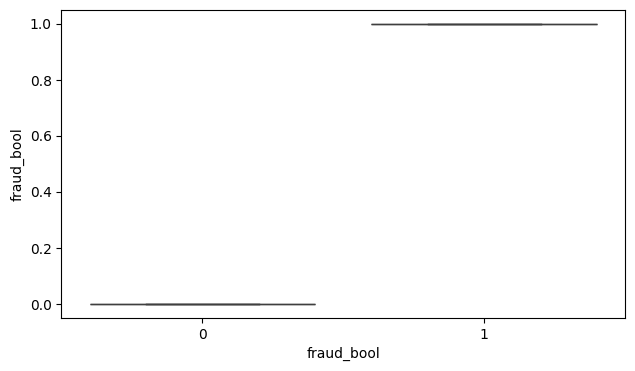

income


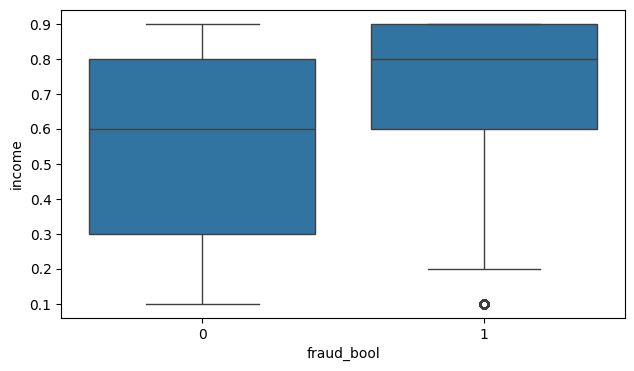

name_email_similarity


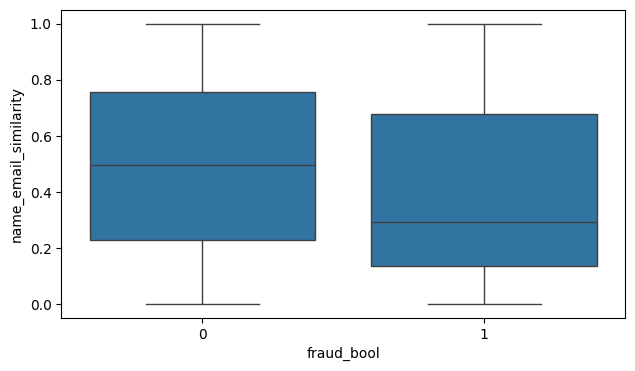

prev_address_months_count


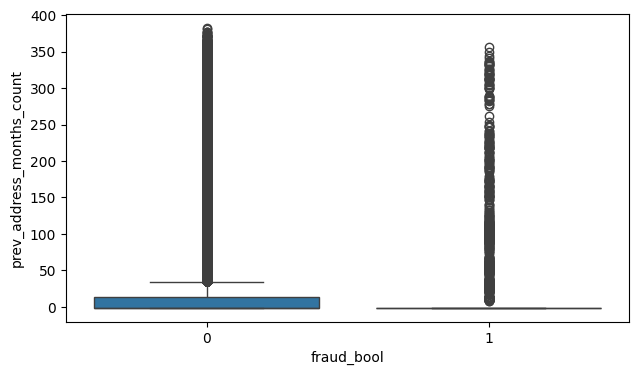

current_address_months_count


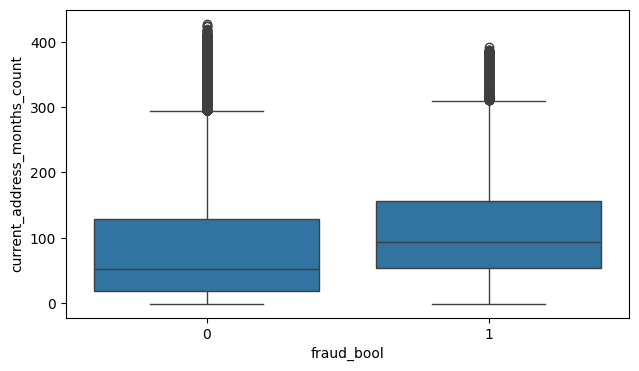

customer_age


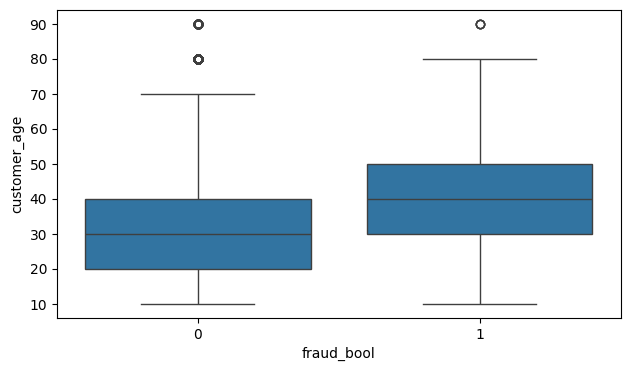

days_since_request


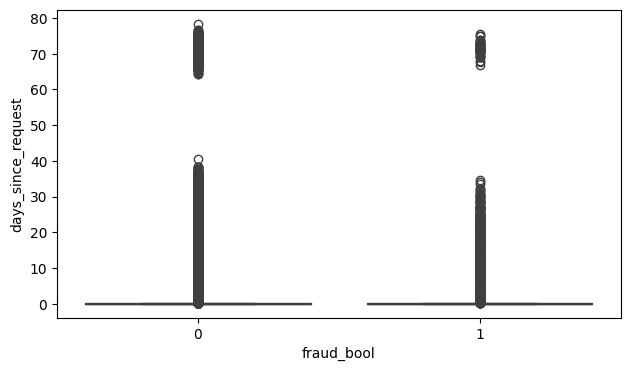

intended_balcon_amount


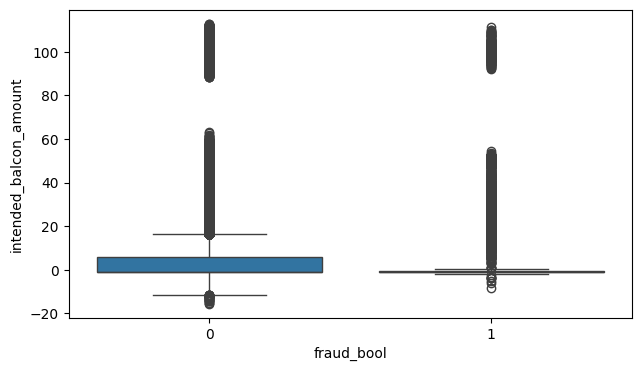

zip_count_4w


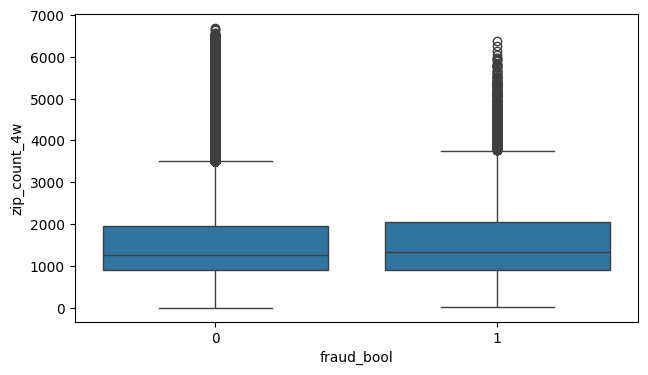

velocity_6h


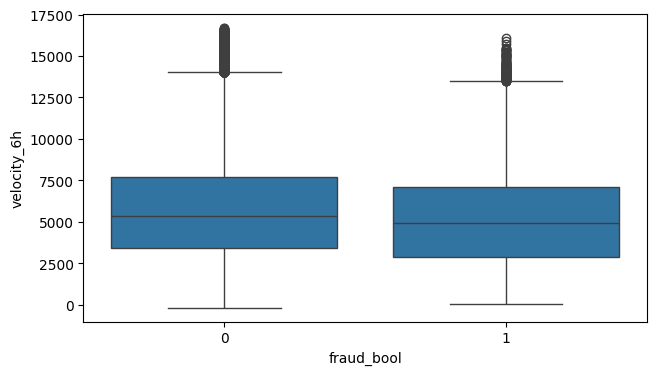

velocity_24h


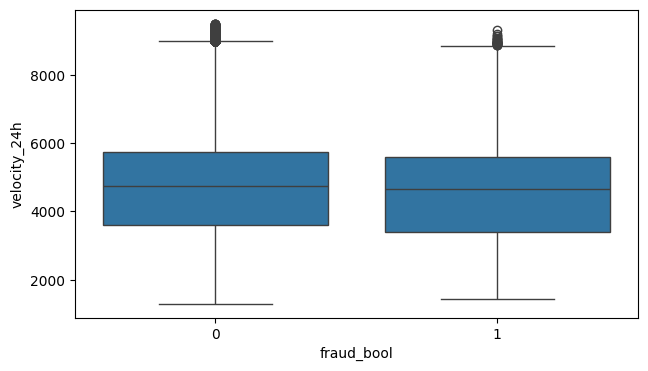

velocity_4w


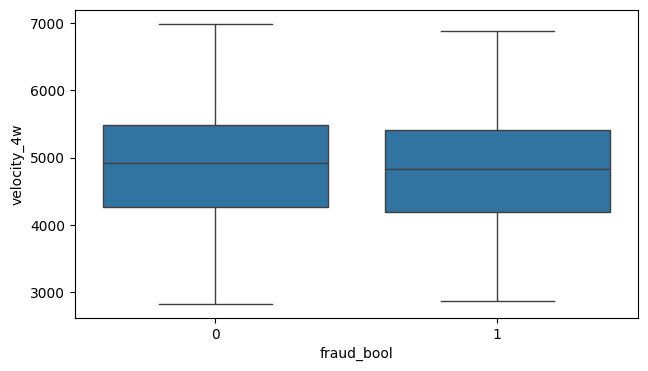

bank_branch_count_8w


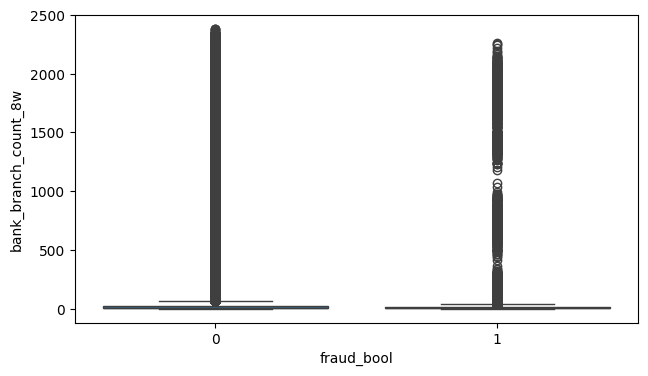

date_of_birth_distinct_emails_4w


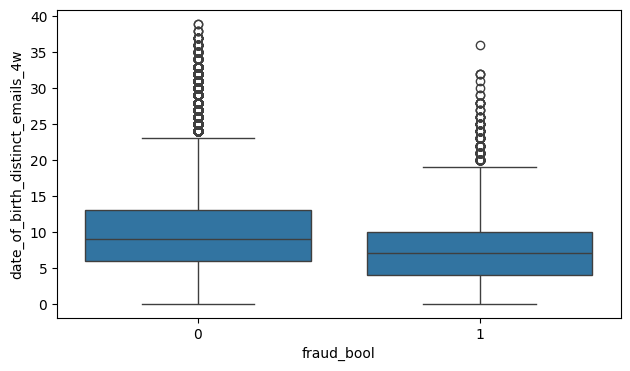

credit_risk_score


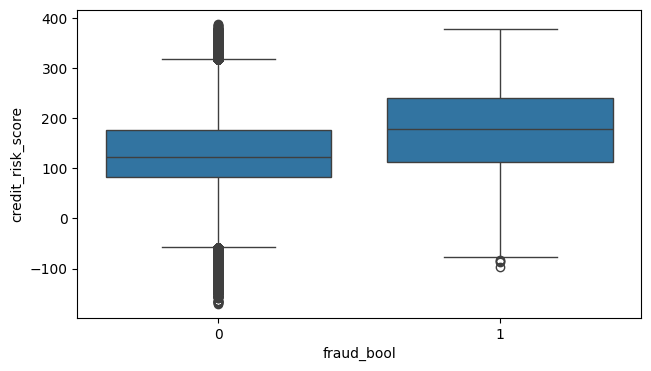

email_is_free


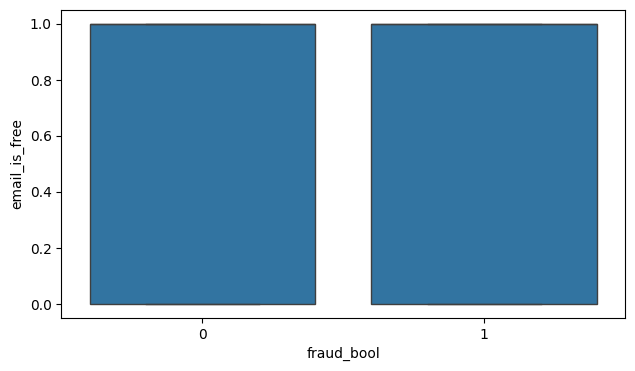

phone_home_valid


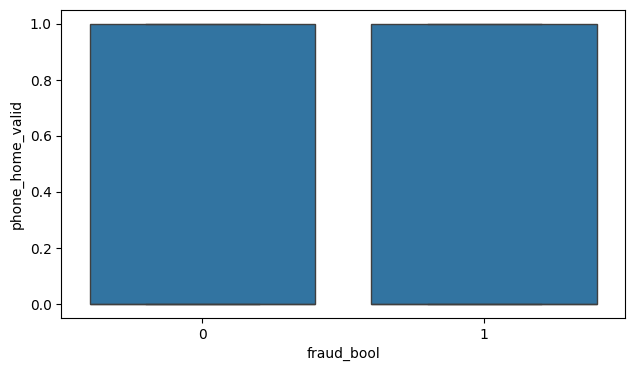

phone_mobile_valid


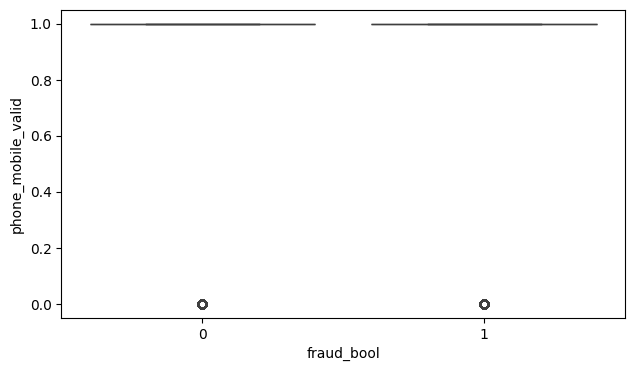

bank_months_count


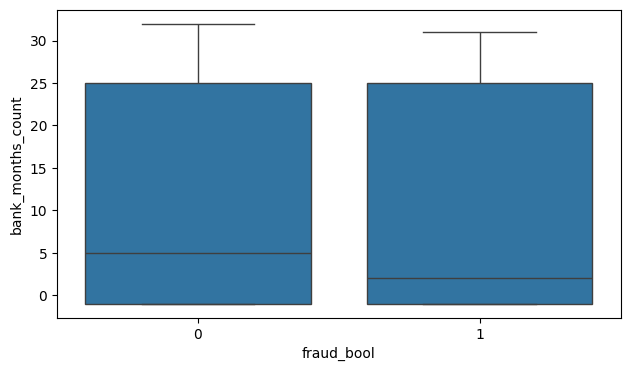

has_other_cards


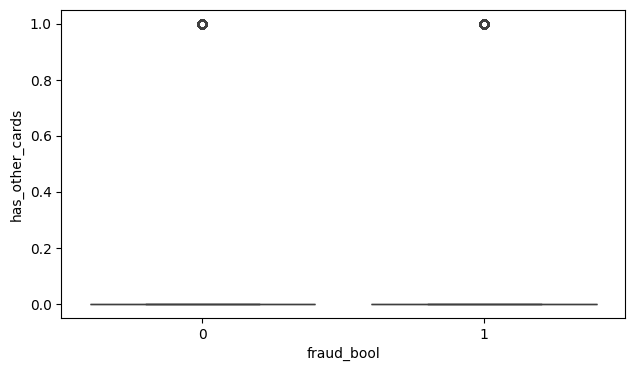

proposed_credit_limit


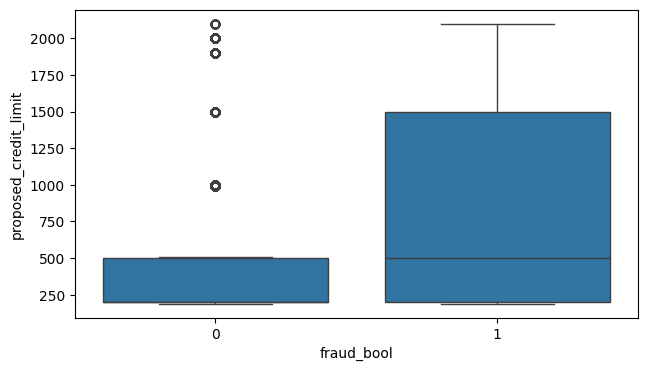

foreign_request


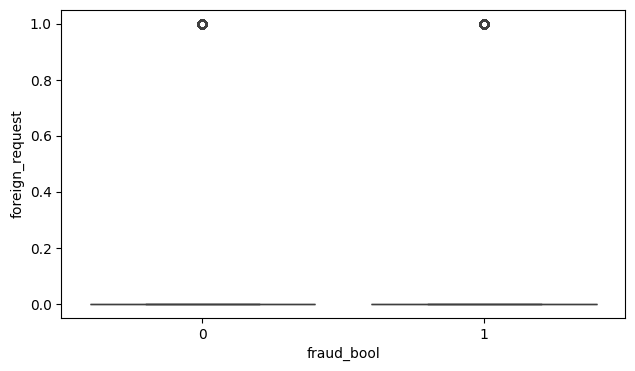

session_length_in_minutes


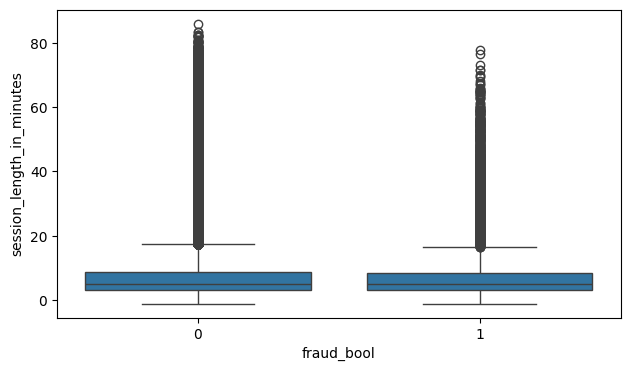

keep_alive_session


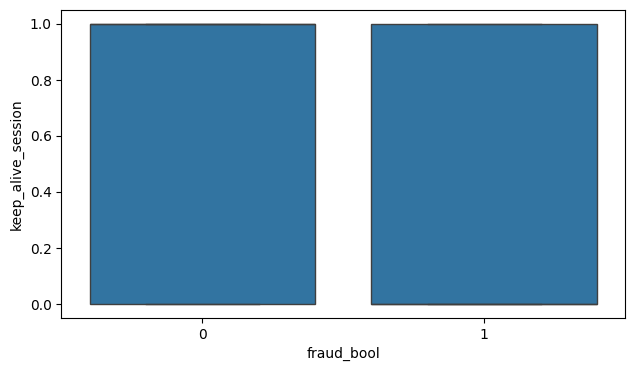

device_distinct_emails_8w


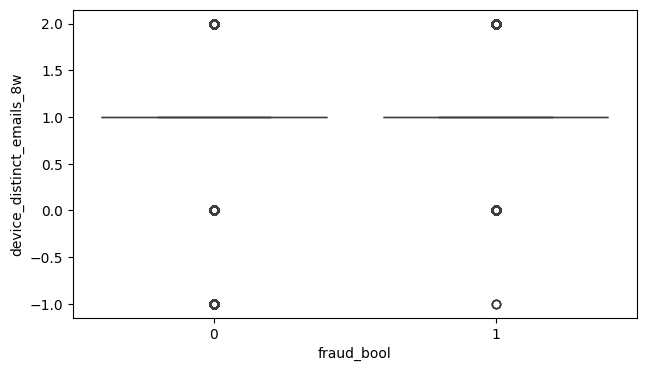

device_fraud_count


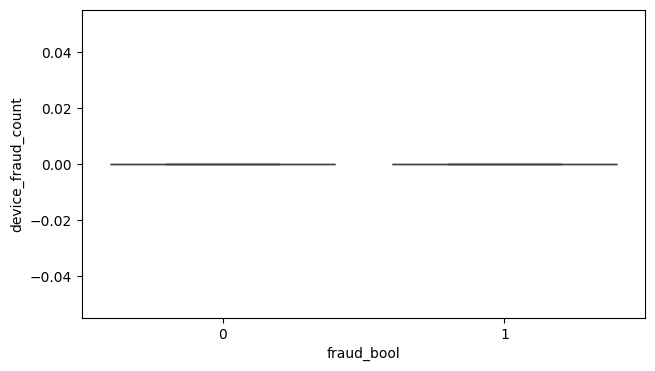

month


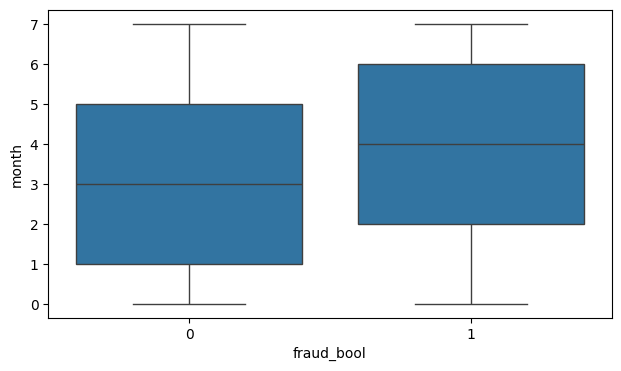

In [ ]:
col_list = data_clean.select_dtypes(include=np.number).columns.tolist()
for col in col_list:
    print(col)
    plt.figure(figsize=(16,4))
    plt.subplot(1,2,1)
    sns.boxplot(x=data_clean['fraud_bool'], y=data_clean[col])
    plt.show()

In [ ]:
print(col_list)

['fraud_bool', 'income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'days_since_request', 'intended_balcon_amount', 'zip_count_4w', 'velocity_6h', 'velocity_24h', 'velocity_4w', 'bank_branch_count_8w', 'date_of_birth_distinct_emails_4w', 'credit_risk_score', 'email_is_free', 'phone_home_valid', 'phone_mobile_valid', 'bank_months_count', 'has_other_cards', 'proposed_credit_limit', 'foreign_request', 'session_length_in_minutes', 'keep_alive_session', 'device_distinct_emails_8w', 'device_fraud_count', 'month']


Dropping some fields as mentioned above due to multicollinearity.


Dropping device_fraud_count since it has a value of 0 always.

In [ ]:
drop_columns = ['date_of_birth_distinct_emails_4w', 'month', 'velocity_6h', 'velocity_4w', 'device_fraud_count']
data_clean = data_clean.drop(columns=drop_columns)

In [ ]:
#filepath = '/Users/kys/Downloads/DS5110BigData/Project/Data/Bank/Data_Clean.csv'
#data_clean.to_csv(filepath, index=False)

Creating sample

In [ ]:
data_samp = data_clean.sample(n=100000, replace=False, random_state=1)

Standardize Data

In [ ]:
f_1=data_clean[data_clean['device_distinct_emails_8w']==-1]
f_1

,fraud_bool,income,name_email_similarity,prev_address_months_count,current_address_months_count,customer_age,days_since_request,intended_balcon_amount,payment_type,zip_count_4w,...,bank_months_count,has_other_cards,proposed_credit_limit,foreign_request,source,session_length_in_minutes,device_os,keep_alive_session,device_distinct_emails_8w,device_fraud_count
380,0,0.9,0.011502,-1,38,40,0.003979,-0.235103,AB,3485,...,1,0,200.0,0,INTERNET,2.604080,WINDOWS,0,-1,0
3005,0,0.1,0.134194,183,30,50,1.277548,-1.124181,AC,1835,...,-1,0,200.0,0,INTERNET,4.371002,OTHER,1,-1,0
8963,0,0.7,0.988861,62,43,60,0.010764,-0.071997,AC,1046,...,-1,0,2000.0,0,INTERNET,7.651565,OTHER,0,-1,0
13748,0,0.2,0.680039,-1,46,40,0.014483,-1.025643,AB,575,...,30,1,1500.0,0,TELEAPP,-1.000000,OTHER,0,-1,0
20281,0,0.9,0.772754,-1,39,40,0.037975,13.272743,AA,310,...,21,0,200.0,0,INTERNET,4.646904,OTHER,0,-1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
970753,0,0.7,0.332772,-1,141,40,0.964643,-0.943595,AC,909,...,-1,1,1500.0,0,TELEAPP,-1.000000,OTHER,0,-1,0
974333,0,0.6,0.470519,-1,51,40,0.007488,-1.018521,AC,1056,...,-1,0,200.0,0,INTERNET,3.888563,WINDOWS,0,-1,0
977261,0,0.9,0.557434,-1,195,40,0.020556,-1.072577,AB,756,...,30,0,500.0,0,TELEAPP,-1.000000,OTHER,0,-1,0
982903,0,0.9,0.545994,-1,53,30,3.491807,-1.062769,AC,3349,...,-1,1,200.0,0,TELEAPP,-1.000000,OTHER,0,-1,0


In [ ]:
f_2=f_1[f_1['fraud_bool']==1]
f_2

,fraud_bool,income,name_email_similarity,prev_address_months_count,current_address_months_count,customer_age,days_since_request,intended_balcon_amount,payment_type,zip_count_4w,...,bank_months_count,has_other_cards,proposed_credit_limit,foreign_request,source,session_length_in_minutes,device_os,keep_alive_session,device_distinct_emails_8w,device_fraud_count
53357,1,0.9,0.132431,-1,127,50,4.106458,-0.528230,AC,4481,...,-1,0,1500.0,0,TELEAPP,-1.000000,OTHER,0,-1,0
73778,1,0.8,0.520890,-1,46,60,0.001907,-0.825121,AB,4044,...,30,0,200.0,0,INTERNET,2.942641,WINDOWS,0,-1,0
122602,1,0.9,0.424966,-1,23,50,0.015377,-0.706985,AD,1257,...,28,0,200.0,0,INTERNET,2.644059,WINDOWS,0,-1,0
830640,1,0.7,0.110274,-1,41,40,1.622966,-0.966230,AB,890,...,2,0,1500.0,0,TELEAPP,-1.000000,OTHER,0,-1,0


In [ ]:
values_fraud_bool = pd.DataFrame(data_clean['fraud_bool'].value_counts())
values_fraud_bool

,fraud_bool
0,988971
1,11029


In [ ]:
data_clean_t = data_clean.copy()
data_clean_t = data_clean_t[data_clean_t['current_address_months_count'] != -1] # dropping missing values
data_clean_t = data_clean_t[data_clean_t['device_distinct_emails_8w'] != -1] # dropping missing values
values_fraud_bool = pd.DataFrame(data_clean_t['fraud_bool'].value_counts())
values_fraud_bool

,fraud_bool
0,984376
1,11011


In [ ]:
columns = ['name_email_similarity', 'income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'days_since_request', 'velocity_24h', 'device_distinct_emails_8w']
for column in columns:
    data_clean_t[column] = (data_clean_t[column] - data_clean_t[column].mean())/data_clean_t[column].std()

In [ ]:
pd.set_option('display.max_rows', 50)
data_clean_t.describe(percentiles = [.2, .4, .6, .8]).T

,count,mean,std,min,20%,40%,50%,60%,80%,max
fraud_bool,995387.0,1.106203e-02,0.104593,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
income,995387.0,-3.474798e-12,1.000000,-1.593324,-1.248922,-0.215719,0.128683,0.473084,1.161886,1.161886
name_email_similarity,995387.0,-4.399137e-14,1.000000,-1.707876,-1.076104,-0.357749,-0.004757,0.327344,1.078533,1.750503
current_address_months_count,995387.0,-1.496818e-15,1.000000,-0.983592,-0.825244,-0.531169,-0.384131,-0.157919,0.780861,3.857343
customer_age,995387.0,2.939310e-15,1.000000,-1.970409,-1.139090,-0.307771,-0.307771,0.523548,0.523548,4.680145
days_since_request,995387.0,1.870191e-15,1.000000,-0.190301,-0.189235,-0.188102,-0.187474,-0.186763,-0.184746,14.434801
intended_balcon_amount,995387.0,-1.444115e-15,1.000000,-1.195571,-0.490889,-0.476766,-0.469775,-0.461564,0.519053,5.148010
zip_count_4w,995387.0,-4.609958e-16,1.000000,-1.563992,-0.751432,-0.464002,-0.308850,-0.098996,0.667814,5.098605
velocity_24h,995387.0,-1.436938e-14,1.000000,-2.346363,-0.949582,-0.324282,-0.013285,0.224691,0.835232,3.203067
bank_branch_count_8w,995387.0,5.232093e-14,1.000000,-0.401419,-0.399245,-0.390550,-0.381854,-0.373159,-0.316640,4.783117


Distribution Plots

Before Standardization

fraud_bool


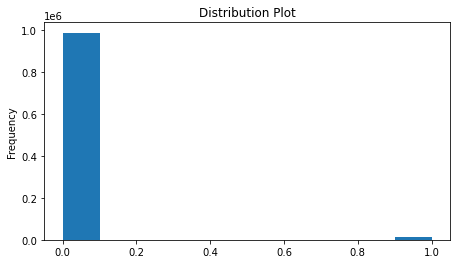

income


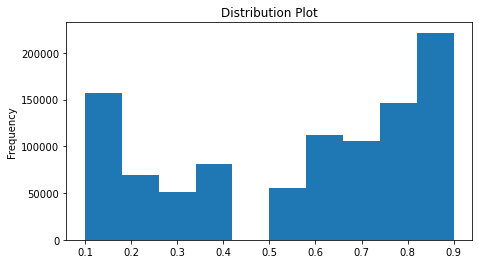

name_email_similarity


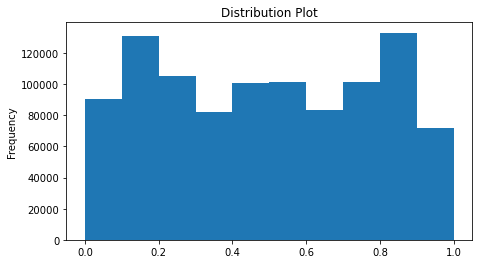

current_address_months_count


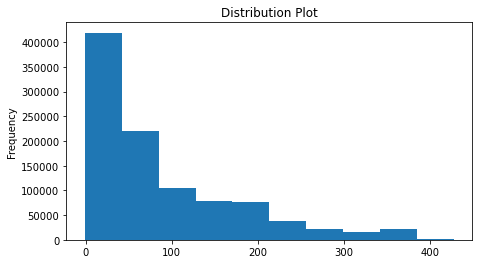

customer_age


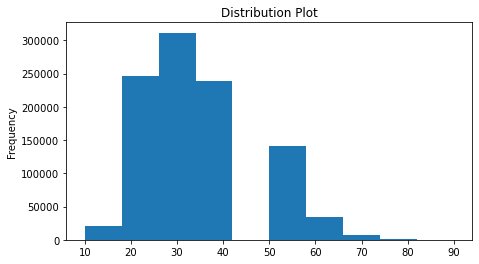

days_since_request


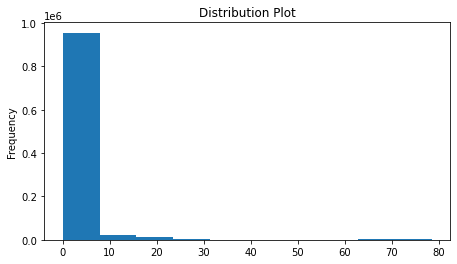

intended_balcon_amount


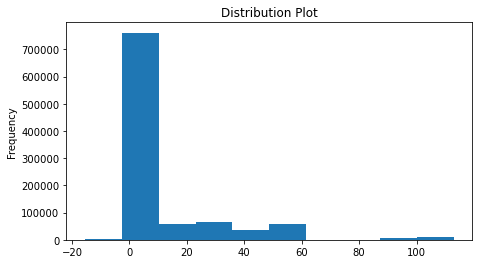

zip_count_4w


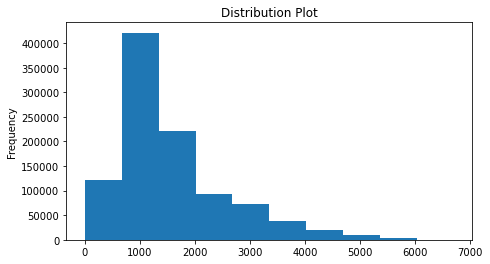

velocity_24h


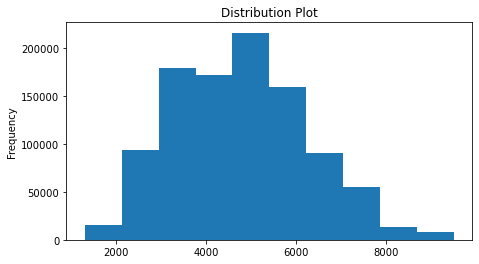

bank_branch_count_8w


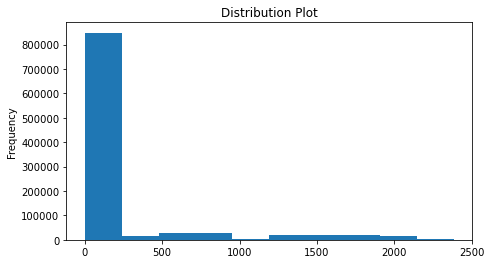

credit_risk_score


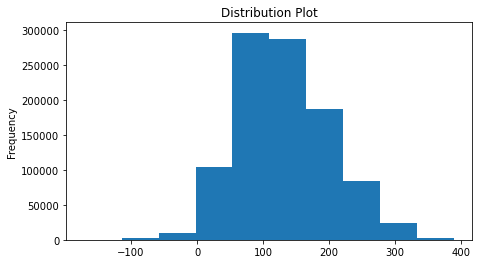

email_is_free


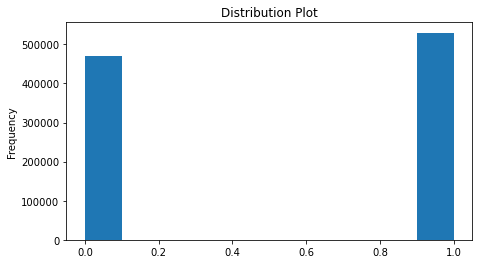

phone_home_valid


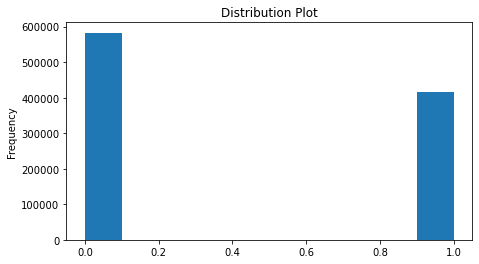

phone_mobile_valid


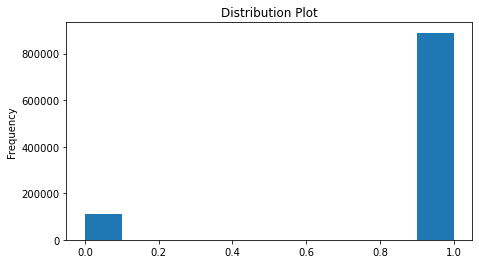

has_other_cards


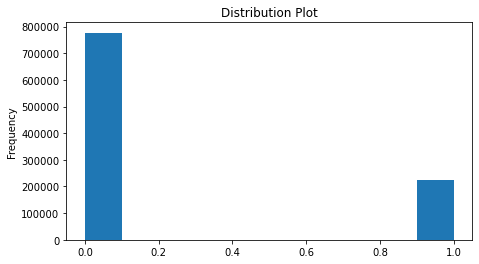

proposed_credit_limit


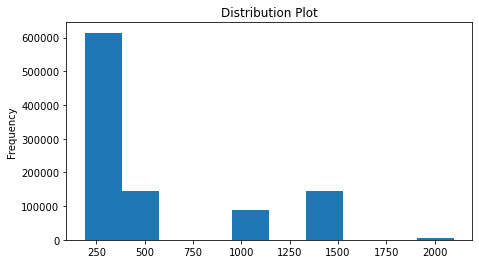

foreign_request


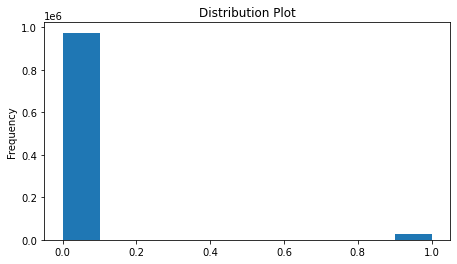

keep_alive_session


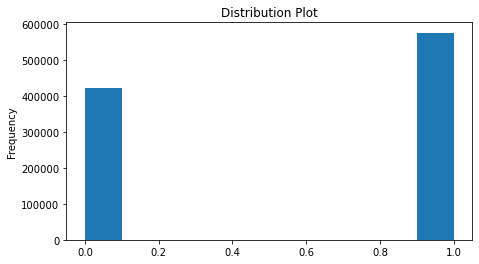

device_distinct_emails_8w


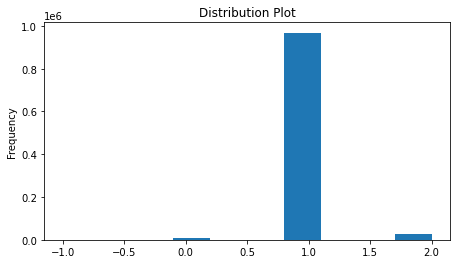

In [ ]:
col_list = data_clean.select_dtypes(include=np.number).columns.tolist()
for col in col_list:
    print(col)
    plt.figure(figsize=(16,4))
    plt.subplot(1,2,1)
    data_clean[col].plot(kind='hist', title='Distribution Plot')
    plt.show()

Distribution Plots

After Standardization

fraud_bool


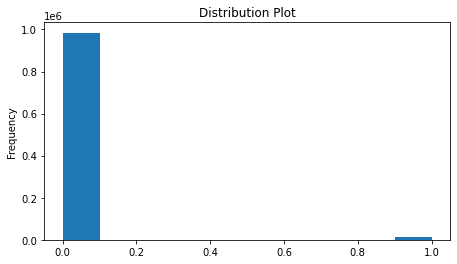

income


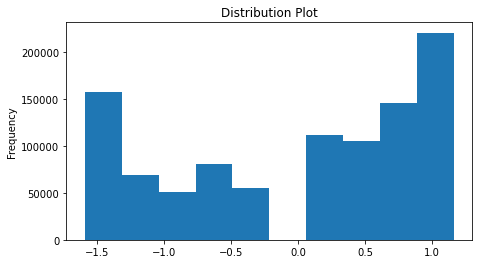

name_email_similarity


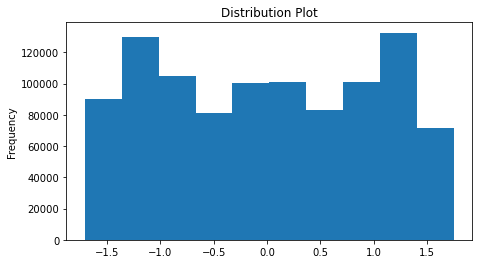

current_address_months_count


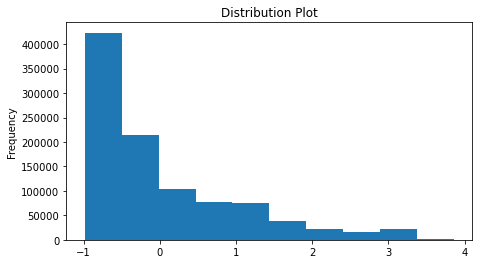

customer_age


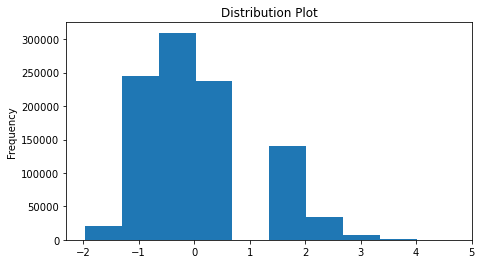

days_since_request


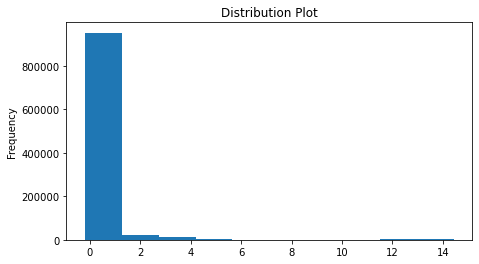

intended_balcon_amount


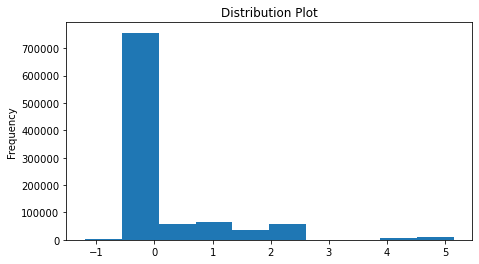

zip_count_4w


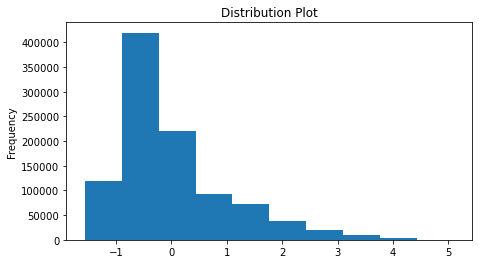

velocity_24h


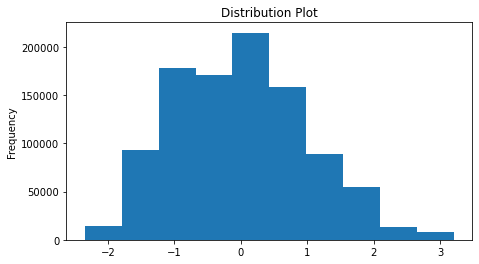

bank_branch_count_8w


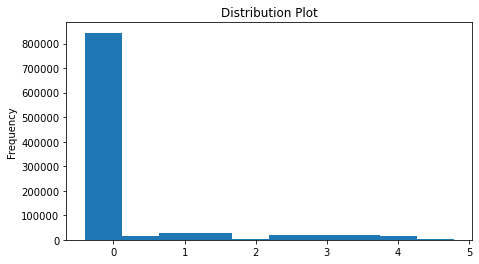

credit_risk_score


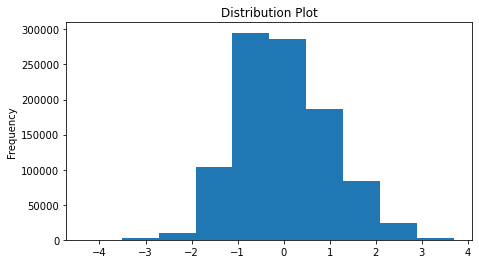

email_is_free


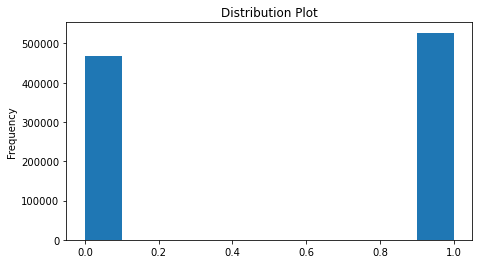

phone_home_valid


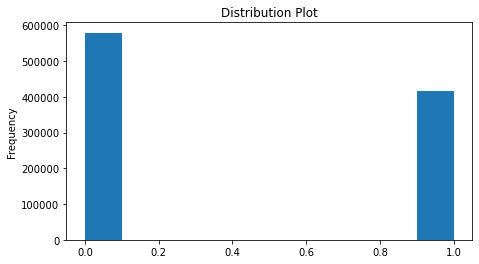

phone_mobile_valid


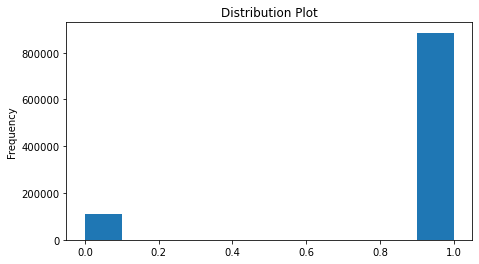

has_other_cards


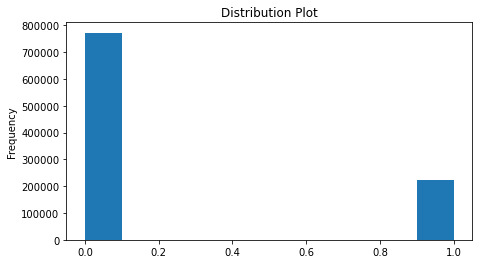

proposed_credit_limit


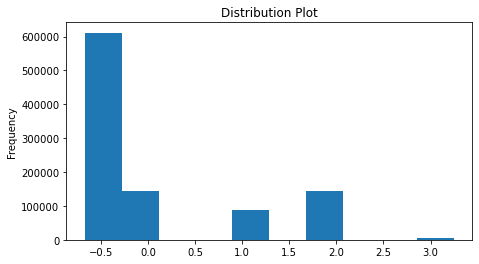

foreign_request


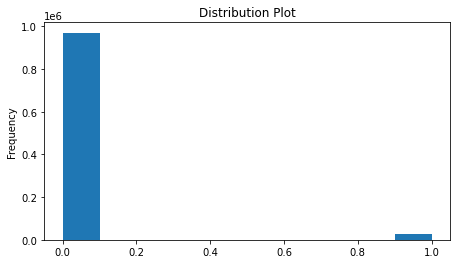

keep_alive_session


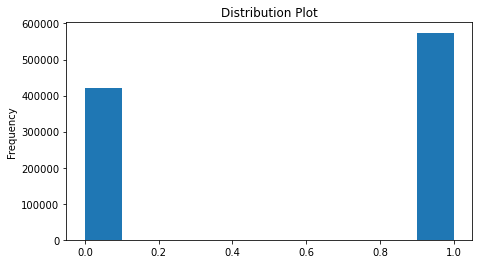

device_distinct_emails_8w


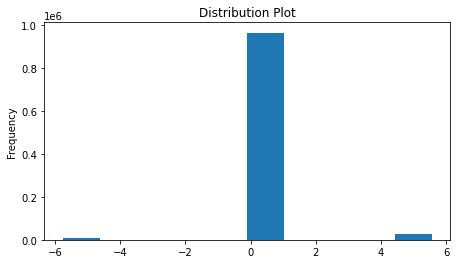

In [ ]:
col_list = data_clean_t.select_dtypes(include=np.number).columns.tolist()
for col in col_list:
    print(col)
    plt.figure(figsize=(16,4))
    plt.subplot(1,2,1)
    data_clean_t[col].plot(kind='hist', title='Distribution Plot')
    plt.show()

In [ ]:
data_samp_t = data_clean_t.sample(n=100000, replace=False, random_state=1)

### Environment for Modeling
(pycaret only works in google collab; did not work on my personal computer)

In [ ]:
try:
    import pycaret
except:
    !pip install pycaret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 485.9/485.9 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.5/160.5 kB 18.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.0/258.0 kB 26.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 20.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.7/80.7 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.9/21.9 MB 56.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 72.4 

Fraud_bool Frequency Checks

In [ ]:
values_fraud_bool = pd.DataFrame(data_clean['fraud_bool'].value_counts())
values_fraud_bool

,fraud_bool
0,988971
1,11029


In [ ]:
values_fraud_bool_per = pd.DataFrame(data_clean['fraud_bool'].value_counts(normalize=True)*100)
values_fraud_bool_per

,fraud_bool
0,98.8971
1,1.1029


In [ ]:
values_fraud_bool = pd.DataFrame(data_clean_t['fraud_bool'].value_counts())
values_fraud_bool

In [ ]:
values_fraud_bool_per = pd.DataFrame(data_clean_t['fraud_bool'].value_counts(normalize=True)*100)
values_fraud_bool_per

In [ ]:
values_fraud_bool_samp = pd.DataFrame(data_samp_t['fraud_bool'].value_counts())
values_fraud_bool_samp

,fraud_bool
0,98861
1,1139


In [ ]:
values_fraud_bool_per = pd.DataFrame(data_samp_t['fraud_bool'].value_counts(normalize=True)*100)
values_fraud_bool_per

Referenced https://www.pycaret.org/tutorials/html/CLF101.html for modeling code.

Referenced https://pycaret.gitbook.io/docs/get-started/preprocessing/feature-selection for feature selection.

At the moment we did not use a fix_imbalance method. We plan on trying to use different fix_imbalance methods if the results of these intital models needs improvement. https://pycaret.gitbook.io/docs/get-started/preprocessing/data-preparation

# First Experiment:

Data: Utilized 100,000 sample. Predictor variables were not standardized.

Description: Utilized PyCaret’s setup options to have it automatically select the 6 best predictor variables to utilize (based on the LGB Classifier) in the 15 model types run. Additionally, predictor variables with inter-correlations higher than 0.6 were removed from the models run.

In [ ]:
from pycaret.classification import *
data_samp_setup = setup(data = data_samp, target = 'fraud_bool', session_id=1, feature_selection=True, feature_selection_estimator='lightgbm', n_features_to_select=6,
                        remove_multicollinearity=True, multicollinearity_threshold = 0.6)

# feature_selection_estimator='lightgbm' is default value
# n_features_to_select=0.2 is default value

[LightGBM] [Info] Number of positive: 797, number of negative: 69203
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032064 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2663
[LightGBM] [Info] Number of data points in the train set: 70000, number of used features: 43
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.011386 -> initscore=-4.463945
[LightGBM] [Info] Start training from score -4.463945


,Description,Value
0,Session id,1
1,Target,fraud_bool
2,Target type,Binary
3,Original data shape,"(100000, 28)"
4,Transformed data shape,"(100000, 7)"
5,Transformed train set shape,"(70000, 7)"
6,Transformed test set shape,"(30000, 7)"
7,Numeric features,22
8,Categorical features,5
9,Preprocess,True


In [ ]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,4.1720
ridge,Ridge Classifier,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.7860
rf,Random Forest Classifier,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,14.5440
ada,Ada Boost Classifier,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,4.2230
lda,Linear Discriminant Analysis,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.7840
et,Extra Trees Classifier,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,4.2390
dummy,Dummy Classifier,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.6650
knn,K Neighbors Classifier,0.9885,0.0000,0.0000,0.0000,0.0000,-0.0002,-0.0007,2.3160
xgboost,Extreme Gradient Boosting,0.9885,0.0000,0.0000,0.0000,0.0000,-0.0002,-0.0007,2.2150
lightgbm,Light Gradient Boosting Machine,0.9884,0.0000,0.0025,0.0533,0.0048,0.0042,0.0098,2.8800


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=1, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

Since our data is imbalanced we will be looking at recall, precision, and the F1 measure.

In [ ]:
models = ['lr', 'knn', 'ridge', 'rf', 'et', 'dummy', 'svm', 'ada', 'xgboost', 'gbc', 'lightgbm', 'lda', 'dt', 'nb', 'qda']

for model_name in models:
    model = create_model(model_name)
    print(model)
    tuned_model = tune_model(model, optimize = 'F1')
    print(tuned_model)
    predict_model(tuned_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=1, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6686,0.0000,0.6076,0.0205,0.0397,0.0183,0.0620
1,0.6684,0.0000,0.5949,0.0201,0.0389,0.0175,0.0592
2,0.6621,0.0000,0.6962,0.0230,0.0444,0.0231,0.0797
3,0.6617,0.0000,0.5875,0.0197,0.0382,0.0164,0.0561
4,0.6067,0.0000,0.6375,0.0184,0.0357,0.0138,0.0530
5,0.6084,0.0000,0.6500,0.0188,0.0366,0.0147,0.0561
6,0.6813,0.0000,0.6875,0.0243,0.0470,0.0255,0.0838
7,0.6827,0.0000,0.6000,0.0215,0.0414,0.0198,0.0647
8,0.6837,0.0000,0.6250,0.0224,0.0432,0.0216,0.0705


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


LogisticRegression(C=0.073, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=1, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.6651,0.7025,0.6491,0.0219,0.0423,0.0207,0.0705


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9886,0.0000,0.0000,0.0000,0.0000,-0.0003,-0.0013
2,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9884,0.0000,0.0000,0.0000,0.0000,-0.0003,-0.0013
4,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9884,0.0000,0.0000,0.0000,0.0000,-0.0003,-0.0013
8,0.9884,0.0000,0.0000,0.0000,0.0000,-0.0003,-0.0013


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9791,0.0000,0.0000,0.0000,0.0000,-0.0105,-0.0105
1,0.9791,0.0000,0.0633,0.0649,0.0641,0.0536,0.0536
2,0.9787,0.0000,0.0380,0.0395,0.0387,0.0280,0.0280
3,0.9780,0.0000,0.0000,0.0000,0.0000,-0.0111,-0.0111
4,0.9764,0.0000,0.0000,0.0000,0.0000,-0.0119,-0.0119
5,0.9763,0.0000,0.0250,0.0222,0.0235,0.0116,0.0116
6,0.9794,0.0000,0.0250,0.0294,0.0270,0.0167,0.0168
7,0.9774,0.0000,0.0125,0.0125,0.0125,0.0011,0.0011
8,0.9766,0.0000,0.0125,0.0116,0.0120,0.0002,0.0002


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=2, p=2,
                     weights='distance')


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,K Neighbors Classifier,0.9771,0.5087,0.0292,0.0275,0.0283,0.0168,0.0168


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, positive=False, random_state=1, solver='auto',
                tol=0.0001)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, positive=False, random_state=1, solver='auto',
                tol=0.0001)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ridge Classifier,0.9886,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=100, n_jobs=-1,
                       oob_score=False, random_state=1, verbose=0,
                       warm_start=False)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7700,0.0000,0.5063,0.0248,0.0473,0.0264,0.0701
1,0.7371,0.0000,0.4937,0.0212,0.0407,0.0194,0.0561
2,0.7589,0.0000,0.5443,0.0254,0.0485,0.0275,0.0754
3,0.7067,0.0000,0.5875,0.0227,0.0438,0.0223,0.0689
4,0.5966,0.0000,0.6625,0.0186,0.0362,0.0143,0.0559
5,0.6147,0.0000,0.7000,0.0205,0.0399,0.0181,0.0684
6,0.7447,0.0000,0.7500,0.0328,0.0629,0.0419,0.1197
7,0.7359,0.0000,0.5625,0.0242,0.0464,0.0251,0.0723
8,0.7617,0.0000,0.6000,0.0285,0.0544,0.0333,0.0904


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='entropy',
                       max_depth=4, max_features=1.0, max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0001,
                       min_samples_leaf=2, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, monotonic_cst=None,
                       n_estimators=90, n_jobs=-1, oob_score=False,
                       random_state=1, verbose=0, warm_start=False)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.7707,0.7184,0.5409,0.0268,0.0510,0.0300,0.0793


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=1, verbose=0,
                     warm_start=False)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7797,0.0000,0.4810,0.0247,0.0470,0.0261,0.0674
1,0.7906,0.0000,0.4051,0.0221,0.0418,0.0209,0.0521
2,0.8340,0.0000,0.3671,0.0254,0.0475,0.0270,0.0590
3,0.7459,0.0000,0.4875,0.0219,0.0420,0.0206,0.0577
4,0.4326,0.0000,0.7750,0.0154,0.0303,0.0080,0.0438
5,0.4471,0.0000,0.8000,0.0163,0.0320,0.0098,0.0520
6,0.8477,0.0000,0.5250,0.0393,0.0730,0.0529,0.1112
7,0.7529,0.0000,0.5125,0.0237,0.0453,0.0239,0.0660
8,0.8237,0.0000,0.3500,0.0231,0.0434,0.0225,0.0504


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


ExtraTreesClassifier(bootstrap=True, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='entropy',
                     max_depth=2, max_features='sqrt', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.05,
                     min_samples_leaf=6, min_samples_split=5,
                     min_weight_fraction_leaf=0.0, monotonic_cst=None,
                     n_estimators=300, n_jobs=-1, oob_score=False,
                     random_state=1, verbose=0, warm_start=False)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extra Trees Classifier,0.8222,0.6584,0.4269,0.0276,0.0519,0.0311,0.0707


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DummyClassifier(constant=None, random_state=1, strategy='prior')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5019,0.0000,0.4557,0.0103,0.0202,-0.0019,-0.0089
1,0.5053,0.0000,0.6076,0.0138,0.0270,0.0050,0.0236
2,0.5033,0.0000,0.5190,0.0118,0.0230,0.0010,0.0047
3,0.5017,0.0000,0.4500,0.0103,0.0202,-0.0022,-0.0101
4,0.5040,0.0000,0.5500,0.0126,0.0247,0.0024,0.0114
5,0.5020,0.0000,0.4625,0.0106,0.0208,-0.0016,-0.0074
6,0.5037,0.0000,0.5375,0.0124,0.0242,0.0019,0.0087
7,0.5034,0.0000,0.5250,0.0121,0.0236,0.0013,0.0060
8,0.5017,0.0000,0.4500,0.0103,0.0202,-0.0022,-0.0101


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 4 candidates, totalling 40 fits


DummyClassifier(constant=None, random_state=1, strategy='uniform')


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Dummy Classifier,0.5010,0.5000,0.5205,0.0119,0.0232,0.0010,0.0045


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9876,0.0000,0.0000,0.0000,0.0000,-0.0018,-0.0034
4,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9879,0.0000,0.0125,0.1429,0.0230,0.0212,0.0391
7,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.0284,0.0000,1.0000,0.0116,0.0230,0.0004,0.0141


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.001, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=-1, penalty='l2',
              power_t=0.5, random_state=1, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9857,0.0000,0.0250,0.0833,0.0385,0.0334,0.0397
4,0.7799,0.0000,0.3500,0.0185,0.0351,0.0136,0.0348
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9856,0.0000,0.0125,0.0435,0.0194,0.0144,0.0173
7,0.9860,0.0000,0.0000,0.0000,0.0000,-0.0042,-0.0055
8,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


SGDClassifier(alpha=0.001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.4, fit_intercept=False,
              l1_ratio=0.1200000001, learning_rate='invscaling', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=-1, penalty='l1',
              power_t=0.5, random_state=1, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,SVM - Linear Kernel,0.9886,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AdaBoostClassifier(algorithm='SAMME.R', estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=1)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
AdaBoostClassifier(algorithm='SAMME.R', estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=1)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ada Boost Classifier,0.9886,0.7160,0.0000,0.0000,0.0000,0.0000,0.0000


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9884,0.0000,0.0000,0.0000,0.0000,-0.0006,-0.0018
1,0.9883,0.0000,0.0000,0.0000,0.0000,-0.0008,-0.0022
2,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9884,0.0000,0.0000,0.0000,0.0000,-0.0003,-0.0013
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device='cpu', early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_parallel_tree=None, objective='binary:logistic', ...)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9819,0.0000,0.0506,0.0714,0.0593,0.0504,0.0511
1,0.9804,0.0000,0.0886,0.0972,0.0927,0.0828,0.0829
2,0.9799,0.0000,0.0759,0.0811,0.0784,0.0683,0.0683
3,0.9826,0.0000,0.0500,0.0800,0.0615,0.0532,0.0547
4,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9813,0.0000,0.0750,0.0952,0.0839,0.0746,0.0751
7,0.9824,0.0000,0.0750,0.1091,0.0889,0.0803,0.0818
8,0.9796,0.0000,0.1000,0.1013,0.1006,0.0903,0.0903


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None, colsample_bytree=1,
              device='cpu', early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=4, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=110, n_jobs=-1,
              num_parallel_tree=None, objective='binary:logistic', ...)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,0.9797,0.7154,0.0789,0.0839,0.0813,0.0711,0.0711


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9874,0.0000,0.0000,0.0000,0.0000,-0.0023,-0.0038
1,0.9880,0.0000,0.0127,0.1429,0.0233,0.0215,0.0394
2,0.9880,0.0000,0.0127,0.1429,0.0233,0.0215,0.0394
3,0.9880,0.0000,0.0000,0.0000,0.0000,-0.0011,-0.0026
4,0.9877,0.0000,0.0000,0.0000,0.0000,-0.0016,-0.0031
5,0.9870,0.0000,0.0000,0.0000,0.0000,-0.0028,-0.0043
6,0.9877,0.0000,0.0000,0.0000,0.0000,-0.0016,-0.0031
7,0.9881,0.0000,0.0000,0.0000,0.0000,-0.0008,-0.0022
8,0.9877,0.0000,0.0000,0.0000,0.0000,-0.0016,-0.0031


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=1, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9037,0.0000,0.0506,0.0066,0.0117,-0.0084,-0.0135
1,0.9194,0.0000,0.1139,0.0179,0.0309,0.0116,0.0174
2,0.9553,0.0000,0.0886,0.0282,0.0428,0.0261,0.0307
3,0.9347,0.0000,0.1250,0.0252,0.0419,0.0233,0.0317
4,0.8493,0.0000,0.1750,0.0140,0.0259,0.0048,0.0097
5,0.8529,0.0000,0.1625,0.0133,0.0246,0.0036,0.0072
6,0.9500,0.0000,0.1625,0.0439,0.0691,0.0521,0.0642
7,0.9410,0.0000,0.1000,0.0229,0.0373,0.0191,0.0248
8,0.9336,0.0000,0.0625,0.0127,0.0211,0.0021,0.0028


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.15, loss='log_loss', max_depth=10,
                           max_features=1.0, max_leaf_nodes=None,
                           min_impurity_decrease=0.0005, min_samples_leaf=2,
                           min_samples_split=9, min_weight_fraction_leaf=0.0,
                           n_estimators=90, n_iter_no_change=None,
                           random_state=1, subsample=0.2, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.9317,0.4996,0.1608,0.0303,0.0509,0.0324,0.0451


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9884,0.0000,0.0000,0.0000,0.0000,-0.0006,-0.0018
1,0.9886,0.0000,0.0127,0.3333,0.0244,0.0236,0.0631
2,0.9881,0.0000,0.0000,0.0000,0.0000,-0.0011,-0.0026
3,0.9883,0.0000,0.0000,0.0000,0.0000,-0.0006,-0.0018
4,0.9884,0.0000,0.0000,0.0000,0.0000,-0.0003,-0.0013
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9883,0.0000,0.0000,0.0000,0.0000,-0.0006,-0.0018
7,0.9883,0.0000,0.0000,0.0000,0.0000,-0.0006,-0.0018
8,0.9881,0.0000,0.0125,0.2000,0.0235,0.0222,0.0474


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=1, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9061,0.0000,0.0633,0.0085,0.0150,-0.0050,-0.0080
1,0.9786,0.0000,0.0253,0.0267,0.0260,0.0151,0.0152
2,0.9789,0.0000,0.0000,0.0000,0.0000,-0.0106,-0.0107
3,0.9724,0.0000,0.0375,0.0252,0.0302,0.0167,0.0171
4,0.9850,0.0000,0.0000,0.0000,0.0000,-0.0055,-0.0064
5,0.9779,0.0000,0.0125,0.0130,0.0127,0.0015,0.0015
6,0.9791,0.0000,0.0125,0.0147,0.0135,0.0030,0.0031
7,0.9651,0.0000,0.0500,0.0233,0.0317,0.0164,0.0177
8,0.9743,0.0000,0.0250,0.0192,0.0217,0.0089,0.0090


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


LGBMClassifier(bagging_fraction=0.5, bagging_freq=6, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.4,
               importance_type='split', learning_rate=0.5, max_depth=-1,
               min_child_samples=51, min_child_weight=0.001, min_split_gain=0.4,
               n_estimators=60, n_jobs=-1, num_leaves=20, objective=None,
               random_state=1, reg_alpha=0.0001, reg_lambda=1e-07,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.9734,0.6068,0.0292,0.0210,0.0244,0.0113,0.0115


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LinearDiscriminantAnalysis(covariance_estimator=None, n_components=None,
                           priors=None, shrinkage=None, solver='svd',
                           store_covariance=False, tol=0.0001)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
LinearDiscriminantAnalysis(covariance_estimator=None, n_components=None,
                           priors=None, shrinkage=None, solver='svd',
                           store_covariance=False, tol=0.0001)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Linear Discriminant Analysis,0.9886,0.7006,0.0000,0.0000,0.0000,0.0000,0.0000


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9739,0.0000,0.0253,0.0185,0.0214,0.0085,0.0086
1,0.9756,0.0000,0.0633,0.0490,0.0552,0.0431,0.0434
2,0.9770,0.0000,0.0253,0.0233,0.0242,0.0126,0.0126
3,0.9746,0.0000,0.0500,0.0377,0.0430,0.0304,0.0307
4,0.9776,0.0000,0.0375,0.0361,0.0368,0.0255,0.0255
5,0.9773,0.0000,0.0000,0.0000,0.0000,-0.0115,-0.0115
6,0.9759,0.0000,0.0375,0.0316,0.0343,0.0222,0.0222
7,0.9753,0.0000,0.0250,0.0206,0.0226,0.0102,0.0102
8,0.9761,0.0000,0.0375,0.0323,0.0347,0.0227,0.0227


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, random_state=1, splitter='best')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9861,0.0000,0.0000,0.0000,0.0000,-0.0042,-0.0054
1,0.9869,0.0000,0.0000,0.0000,0.0000,-0.0032,-0.0046
2,0.9870,0.0000,0.0000,0.0000,0.0000,-0.0030,-0.0044
3,0.9861,0.0000,0.0000,0.0000,0.0000,-0.0040,-0.0053
4,0.9880,0.0000,0.0000,0.0000,0.0000,-0.0011,-0.0026
5,0.9873,0.0000,0.0000,0.0000,0.0000,-0.0023,-0.0039
6,0.9876,0.0000,0.0000,0.0000,0.0000,-0.0018,-0.0034
7,0.9864,0.0000,0.0125,0.0588,0.0206,0.0167,0.0220
8,0.9863,0.0000,0.0125,0.0556,0.0204,0.0163,0.0211


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, random_state=1, splitter='best')


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.9763,0.5111,0.0351,0.0305,0.0327,0.0207,0.0208


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9770,0.0000,0.0000,0.0000,0.0000,-0.0116,-0.0116
1,0.9841,0.0000,0.0253,0.0556,0.0348,0.0279,0.0301
2,0.9831,0.0000,0.0127,0.0244,0.0167,0.0090,0.0095
3,0.9846,0.0000,0.0375,0.0882,0.0526,0.0461,0.0505
4,0.9874,0.0000,0.0000,0.0000,0.0000,-0.0021,-0.0036
5,0.9819,0.0000,0.0000,0.0000,0.0000,-0.0085,-0.0088
6,0.9816,0.0000,0.0000,0.0000,0.0000,-0.0088,-0.0090
7,0.9814,0.0000,0.0125,0.0192,0.0152,0.0062,0.0064
8,0.9831,0.0000,0.0000,0.0000,0.0000,-0.0074,-0.0079


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GaussianNB(priors=None, var_smoothing=1e-09)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9770,0.0000,0.0000,0.0000,0.0000,-0.0116,-0.0116
1,0.9841,0.0000,0.0253,0.0556,0.0348,0.0279,0.0301
2,0.9831,0.0000,0.0127,0.0244,0.0167,0.0090,0.0095
3,0.9846,0.0000,0.0375,0.0882,0.0526,0.0461,0.0505
4,0.9874,0.0000,0.0000,0.0000,0.0000,-0.0021,-0.0036
5,0.9819,0.0000,0.0000,0.0000,0.0000,-0.0085,-0.0088
6,0.9816,0.0000,0.0000,0.0000,0.0000,-0.0088,-0.0090
7,0.9814,0.0000,0.0125,0.0192,0.0152,0.0062,0.0064
8,0.9831,0.0000,0.0000,0.0000,0.0000,-0.0074,-0.0079


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
GaussianNB(priors=None, var_smoothing=1e-09)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Naive Bayes,0.9833,0.7061,0.0146,0.0296,0.0196,0.0121,0.0129


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9780,0.0000,0.0000,0.0000,0.0000,-0.0111,-0.0111
1,0.9839,0.0000,0.0253,0.0526,0.0342,0.0271,0.0289
2,0.9831,0.0000,0.0127,0.0244,0.0167,0.0090,0.0095
3,0.9844,0.0000,0.0375,0.0857,0.0522,0.0455,0.0495
4,0.9873,0.0000,0.0000,0.0000,0.0000,-0.0023,-0.0039
5,0.9816,0.0000,0.0000,0.0000,0.0000,-0.0088,-0.0090
6,0.9816,0.0000,0.0000,0.0000,0.0000,-0.0088,-0.0090
7,0.9813,0.0000,0.0125,0.0189,0.0150,0.0060,0.0061
8,0.9833,0.0000,0.0000,0.0000,0.0000,-0.0073,-0.0078


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9166,0.0000,0.1646,0.0245,0.0426,0.0234,0.0358
1,0.9377,0.0000,0.2152,0.0435,0.0723,0.0546,0.0741
2,0.9346,0.0000,0.2152,0.0412,0.0691,0.0511,0.0708
3,0.9413,0.0000,0.2250,0.0490,0.0805,0.0630,0.0832
4,0.9760,0.0000,0.0625,0.0510,0.0562,0.0442,0.0444
5,0.9643,0.0000,0.0125,0.0058,0.0079,-0.0078,-0.0084
6,0.9384,0.0000,0.3375,0.0667,0.1113,0.0940,0.1288
7,0.9346,0.0000,0.2625,0.0500,0.0840,0.0661,0.0917
8,0.9334,0.0000,0.2375,0.0448,0.0754,0.0573,0.0797


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


QuadraticDiscriminantAnalysis(priors=None, reg_param=0.72,
                              store_covariance=False, tol=0.0001)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Quadratic Discriminant Analysis,0.9370,0.6817,0.2398,0.0479,0.0798,0.0620,0.0846


Run time: 9:46pm started to run workbook using GPU finished at 12am

# Second Experiment:

Data: Utilized 100,000 sample. Predictor variables were not standardized.

Description: Similar to our first experiment except that we used the synthetic minority over-sampling technique (SMOTE) to address the imbalance in the response variable. The results of these models performed better than our first experiment.

Source: https://pycaret.gitbook.io/docs/get-started/preprocessing/data-preparation

In [ ]:
from pycaret.classification import *
data_samp2_setup = setup(data = data_samp, target = 'fraud_bool', session_id=1, feature_selection=True, feature_selection_estimator='lightgbm', n_features_to_select=6,
                        remove_multicollinearity=True, multicollinearity_threshold = 0.6, fix_imbalance = True, fix_imbalance_method = 'SMOTE')

# feature_selection_estimator='lightgbm' is default value
# n_features_to_select=0.2 is default value

[LightGBM] [Info] Number of positive: 69203, number of negative: 69203
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.270939 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10265
[LightGBM] [Info] Number of data points in the train set: 138406, number of used features: 43
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


,Description,Value
0,Session id,1
1,Target,fraud_bool
2,Target type,Binary
3,Original data shape,"(100000, 28)"
4,Transformed data shape,"(168406, 7)"
5,Transformed train set shape,"(138406, 7)"
6,Transformed test set shape,"(30000, 7)"
7,Numeric features,22
8,Categorical features,5
9,Preprocess,True


In [ ]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
dummy,Dummy Classifier,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.8300
rf,Random Forest Classifier,0.9845,0.0000,0.0125,0.0307,0.0173,0.0112,0.0124,19.3100
lightgbm,Light Gradient Boosting Machine,0.9843,0.0000,0.0301,0.0480,0.0354,0.0296,0.0308,6.3250
et,Extra Trees Classifier,0.9829,0.0000,0.0226,0.0385,0.0281,0.0203,0.0211,10.8980
gbc,Gradient Boosting Classifier,0.9824,0.0000,0.0503,0.0964,0.0553,0.0480,0.0548,24.8720
xgboost,Extreme Gradient Boosting,0.9819,0.0000,0.0264,0.0547,0.0302,0.0223,0.0258,4.9630
dt,Decision Tree Classifier,0.9708,0.0000,0.0501,0.0296,0.0367,0.0230,0.0240,4.3390
ada,Ada Boost Classifier,0.9574,0.0000,0.1721,0.0606,0.0854,0.0702,0.0816,8.4480
knn,K Neighbors Classifier,0.7877,0.0000,0.3489,0.0194,0.0363,0.0152,0.0372,4.4700
nb,Naive Bayes,0.7285,0.0000,0.6048,0.0252,0.0484,0.0271,0.0798,4.1730


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

DummyClassifier(constant=None, random_state=1, strategy='prior')

In [ ]:
models = ['lr', 'knn', 'ridge', 'rf', 'et', 'dummy', 'svm', 'ada', 'xgboost', 'gbc', 'lightgbm', 'lda', 'dt', 'nb', 'qda']

for model_name in models:
    model = create_model(model_name)
    print(model)
    tuned_model = tune_model(model, optimize = 'F1')
    print(tuned_model)
    predict_model(tuned_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6787,0.0000,0.6456,0.0224,0.0434,0.0221,0.0732
1,0.6989,0.0000,0.6962,0.0257,0.0496,0.0284,0.0906
2,0.6910,0.0000,0.7215,0.0259,0.0501,0.0289,0.0938
3,0.6867,0.0000,0.6375,0.0230,0.0444,0.0229,0.0742
4,0.6787,0.0000,0.6625,0.0233,0.0450,0.0234,0.0775
5,0.6751,0.0000,0.6375,0.0222,0.0429,0.0213,0.0709
6,0.6604,0.0000,0.7000,0.0232,0.0450,0.0234,0.0805
7,0.7021,0.0000,0.6250,0.0238,0.0458,0.0243,0.0760
8,0.7043,0.0000,0.6750,0.0257,0.0496,0.0282,0.0881


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=1, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6787,0.0000,0.6456,0.0224,0.0434,0.0221,0.0732
1,0.6990,0.0000,0.6962,0.0257,0.0496,0.0285,0.0906
2,0.6916,0.0000,0.7215,0.0260,0.0502,0.0290,0.0940
3,0.6867,0.0000,0.6375,0.0230,0.0444,0.0229,0.0742
4,0.6784,0.0000,0.6625,0.0233,0.0450,0.0234,0.0774
5,0.6750,0.0000,0.6375,0.0222,0.0429,0.0213,0.0708
6,0.6609,0.0000,0.7000,0.0233,0.0451,0.0234,0.0807
7,0.7023,0.0000,0.6250,0.0238,0.0458,0.0243,0.0761
8,0.7040,0.0000,0.6750,0.0257,0.0495,0.0281,0.0880


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=1, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.7035,0.7534,0.6725,0.0255,0.0492,0.0278,0.0872


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8113,0.0000,0.2152,0.0133,0.0251,0.0039,0.0091
1,0.7680,0.0000,0.4430,0.0217,0.0413,0.0202,0.0538
2,0.7606,0.0000,0.4430,0.0210,0.0401,0.0189,0.0514
3,0.7447,0.0000,0.3875,0.0175,0.0335,0.0119,0.0333
4,0.7000,0.0000,0.5125,0.0195,0.0376,0.0159,0.0498
5,0.9223,0.0000,0.1875,0.0304,0.0523,0.0332,0.0491
6,0.8069,0.0000,0.3000,0.0182,0.0343,0.0130,0.0306
7,0.8103,0.0000,0.2500,0.0155,0.0292,0.0079,0.0183
8,0.7193,0.0000,0.5500,0.0223,0.0429,0.0214,0.0641


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7540,0.0000,0.2405,0.0113,0.0216,0.0000,0.0001
1,0.7330,0.0000,0.4430,0.0188,0.0361,0.0148,0.0429
2,0.7219,0.0000,0.5823,0.0235,0.0451,0.0239,0.0719
3,0.7187,0.0000,0.4625,0.0188,0.0362,0.0146,0.0436
4,0.6997,0.0000,0.5625,0.0213,0.0411,0.0195,0.0611
5,0.9579,0.0000,0.1250,0.0426,0.0635,0.0472,0.0546
6,0.7504,0.0000,0.3625,0.0168,0.0321,0.0105,0.0290
7,0.7569,0.0000,0.3375,0.0161,0.0308,0.0091,0.0247
8,0.7344,0.0000,0.5750,0.0246,0.0472,0.0258,0.0748


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=28, p=2,
                     weights='distance')


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,K Neighbors Classifier,0.7293,0.6439,0.4561,0.0193,0.0370,0.0155,0.0451


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6773,0.0000,0.6456,0.0223,0.0432,0.0219,0.0728
1,0.6999,0.0000,0.6962,0.0258,0.0498,0.0286,0.0909
2,0.6923,0.0000,0.7215,0.0260,0.0503,0.0291,0.0942
3,0.6889,0.0000,0.6375,0.0232,0.0447,0.0232,0.0749
4,0.6766,0.0000,0.6625,0.0231,0.0447,0.0232,0.0769
5,0.6714,0.0000,0.6375,0.0220,0.0425,0.0208,0.0698
6,0.6580,0.0000,0.7000,0.0231,0.0447,0.0231,0.0799
7,0.7009,0.0000,0.6250,0.0237,0.0456,0.0241,0.0756
8,0.7043,0.0000,0.6875,0.0262,0.0505,0.0291,0.0909


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, positive=False, random_state=1, solver='auto',
                tol=0.0001)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6774,0.0000,0.6456,0.0224,0.0432,0.0219,0.0729
1,0.6999,0.0000,0.6962,0.0258,0.0498,0.0286,0.0909
2,0.6923,0.0000,0.7215,0.0260,0.0503,0.0291,0.0942
3,0.6887,0.0000,0.6375,0.0232,0.0447,0.0232,0.0748
4,0.6767,0.0000,0.6625,0.0232,0.0447,0.0232,0.0769
5,0.6713,0.0000,0.6375,0.0220,0.0424,0.0208,0.0698
6,0.6580,0.0000,0.7000,0.0231,0.0447,0.0231,0.0799
7,0.7009,0.0000,0.6250,0.0237,0.0456,0.0241,0.0756
8,0.7041,0.0000,0.6875,0.0262,0.0504,0.0291,0.0909


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, positive=False, random_state=1, solver='auto',
                tol=0.0001)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ridge Classifier,0.7029,0.6893,0.6754,0.0256,0.0493,0.0279,0.0876


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9864,0.0000,0.0127,0.0556,0.0206,0.0165,0.0213
1,0.9850,0.0000,0.0127,0.0357,0.0187,0.0129,0.0147
2,0.9823,0.0000,0.0127,0.0213,0.0159,0.0075,0.0078
3,0.9837,0.0000,0.0375,0.0750,0.0500,0.0427,0.0453
4,0.9860,0.0000,0.0125,0.0500,0.0200,0.0155,0.0194
5,0.9840,0.0000,0.0125,0.0294,0.0175,0.0108,0.0118
6,0.9846,0.0000,0.0000,0.0000,0.0000,-0.0060,-0.0068
7,0.9863,0.0000,0.0000,0.0000,0.0000,-0.0038,-0.0051
8,0.9820,0.0000,0.0250,0.0400,0.0308,0.0222,0.0228


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=100, n_jobs=-1,
                       oob_score=False, random_state=1, verbose=0,
                       warm_start=False)


,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,22:27:41
Status,. . . . . . . . . . . . . . . . . .,Searching Hyperparameters
Estimator,. . . . . . . . . . . . . . . . . .,Random Forest Classifier


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [ ]:
models = ['rf', 'et', 'dummy', 'svm', 'ada', 'xgboost', 'gbc', 'lightgbm', 'lda', 'dt', 'nb', 'qda']

for model_name in models:
    model = create_model(model_name)
    print(model)
    tuned_model = tune_model(model, optimize = 'F1')
    print(tuned_model)
    predict_model(tuned_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9864,0.0000,0.0127,0.0556,0.0206,0.0165,0.0213
1,0.9850,0.0000,0.0127,0.0357,0.0187,0.0129,0.0147
2,0.9823,0.0000,0.0127,0.0213,0.0159,0.0075,0.0078
3,0.9837,0.0000,0.0375,0.0750,0.0500,0.0427,0.0453
4,0.9860,0.0000,0.0125,0.0500,0.0200,0.0155,0.0194
5,0.9840,0.0000,0.0125,0.0294,0.0175,0.0108,0.0118
6,0.9846,0.0000,0.0000,0.0000,0.0000,-0.0060,-0.0068
7,0.9863,0.0000,0.0000,0.0000,0.0000,-0.0038,-0.0051
8,0.9820,0.0000,0.0250,0.0400,0.0308,0.0222,0.0228


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=100, n_jobs=-1,
                       oob_score=False, random_state=1, verbose=0,
                       warm_start=False)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8906,0.0000,0.3418,0.0364,0.0659,0.0464,0.0819
1,0.9270,0.0000,0.2658,0.0443,0.0759,0.0577,0.0842
2,0.9034,0.0000,0.3291,0.0401,0.0714,0.0524,0.0871
3,0.8820,0.0000,0.3000,0.0302,0.0549,0.0349,0.0633
4,0.9193,0.0000,0.2125,0.0328,0.0568,0.0377,0.0568
5,0.9396,0.0000,0.2875,0.0591,0.0981,0.0807,0.1089
6,0.8849,0.0000,0.3125,0.0322,0.0584,0.0385,0.0691
7,0.9081,0.0000,0.2875,0.0378,0.0668,0.0475,0.0765
8,0.9154,0.0000,0.2000,0.0294,0.0513,0.0320,0.0491


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                       criterion='entropy', max_depth=6, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.002, min_samples_leaf=3,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=40, n_jobs=-1,
                       oob_score=False, random_state=1, verbose=0,
                       warm_start=False)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.9247,0.7582,0.2690,0.0438,0.0753,0.0569,0.0838


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9843,0.0000,0.0127,0.0303,0.0179,0.0113,0.0124
1,0.9834,0.0000,0.0633,0.1064,0.0794,0.0715,0.0740
2,0.9807,0.0000,0.0380,0.0484,0.0426,0.0330,0.0332
3,0.9810,0.0000,0.0375,0.0508,0.0432,0.0338,0.0342
4,0.9833,0.0000,0.0250,0.0488,0.0331,0.0255,0.0270
5,0.9820,0.0000,0.0250,0.0400,0.0308,0.0222,0.0228
6,0.9841,0.0000,0.0000,0.0000,0.0000,-0.0064,-0.0072
7,0.9856,0.0000,0.0125,0.0435,0.0194,0.0144,0.0173
8,0.9806,0.0000,0.0125,0.0172,0.0145,0.0049,0.0050


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=1, verbose=0,
                     warm_start=False)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8721,0.0000,0.3797,0.0342,0.0628,0.0430,0.0822
1,0.9129,0.0000,0.3038,0.0415,0.0729,0.0542,0.0858
2,0.8969,0.0000,0.3418,0.0387,0.0696,0.0503,0.0864
3,0.8263,0.0000,0.4375,0.0290,0.0544,0.0337,0.0755
4,0.9044,0.0000,0.2750,0.0348,0.0617,0.0423,0.0692
5,0.8987,0.0000,0.3250,0.0382,0.0683,0.0489,0.0826
6,0.8733,0.0000,0.3250,0.0303,0.0554,0.0352,0.0663
7,0.8961,0.0000,0.3000,0.0345,0.0619,0.0423,0.0722
8,0.8670,0.0000,0.2875,0.0256,0.0471,0.0267,0.0513


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='entropy', max_depth=8, max_features=1.0,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.01, min_samples_leaf=2,
                     min_samples_split=9, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=20, n_jobs=-1,
                     oob_score=False, random_state=1, verbose=0,
                     warm_start=False)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extra Trees Classifier,0.8930,0.7179,0.3304,0.0365,0.0658,0.0462,0.0802


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DummyClassifier(constant=None, random_state=1, strategy='prior')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5019,0.0000,0.4557,0.0103,0.0202,-0.0019,-0.0089
1,0.5053,0.0000,0.6076,0.0138,0.0270,0.0050,0.0236
2,0.5033,0.0000,0.5190,0.0118,0.0230,0.0010,0.0047
3,0.5017,0.0000,0.4500,0.0103,0.0202,-0.0022,-0.0101
4,0.5040,0.0000,0.5500,0.0126,0.0247,0.0024,0.0114
5,0.5020,0.0000,0.4625,0.0106,0.0208,-0.0016,-0.0074
6,0.5037,0.0000,0.5375,0.0124,0.0242,0.0019,0.0087
7,0.5034,0.0000,0.5250,0.0121,0.0236,0.0013,0.0060
8,0.5017,0.0000,0.4500,0.0103,0.0202,-0.0022,-0.0101


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 4 candidates, totalling 40 fits


DummyClassifier(constant=None, random_state=1, strategy='uniform')


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Dummy Classifier,0.5010,0.5000,0.5205,0.0119,0.0232,0.0010,0.0045


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5149,0.0000,0.6962,0.0160,0.0314,0.0095,0.0442
1,0.4347,0.0000,0.8734,0.0172,0.0337,0.0118,0.0647
2,0.9840,0.0000,0.0127,0.0286,0.0175,0.0107,0.0116
3,0.7907,0.0000,0.4500,0.0247,0.0468,0.0257,0.0641
4,0.1287,0.0000,1.0000,0.0129,0.0256,0.0031,0.0392
5,0.5787,0.0000,0.7000,0.0188,0.0366,0.0147,0.0596
6,0.0519,0.0000,1.0000,0.0119,0.0235,0.0010,0.0221
7,0.9494,0.0000,0.1500,0.0403,0.0635,0.0463,0.0572
8,0.6691,0.0000,0.6375,0.0218,0.0422,0.0205,0.0692


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.001, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=-1, penalty='l2',
              power_t=0.5, random_state=1, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5459,0.0000,0.7468,0.0183,0.0358,0.0141,0.0616
1,0.8163,0.0000,0.5190,0.0318,0.0599,0.0395,0.0923
2,0.8629,0.0000,0.5443,0.0445,0.0822,0.0627,0.1258
3,0.5281,0.0000,0.7375,0.0177,0.0345,0.0124,0.0560
4,0.0270,0.0000,1.0000,0.0116,0.0230,0.0004,0.0135
5,0.3850,0.0000,0.8375,0.0154,0.0302,0.0079,0.0476
6,0.0683,0.0000,0.9875,0.0120,0.0237,0.0011,0.0207
7,0.9691,0.0000,0.1000,0.0526,0.0690,0.0548,0.0578
8,0.9004,0.0000,0.3250,0.0389,0.0694,0.0500,0.0839


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


SGDClassifier(alpha=0.002, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.3, fit_intercept=True,
              l1_ratio=0.6900000001, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=-1,
              penalty='elasticnet', power_t=0.5, random_state=1, shuffle=True,
              tol=0.001, validation_fraction=0.1, verbose=0, warm_start=False)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,SVM - Linear Kernel,0.8495,0.6652,0.4766,0.0362,0.0673,0.0472,0.0982


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9374,0.0000,0.2152,0.0433,0.0720,0.0543,0.0738
1,0.9554,0.0000,0.2785,0.0794,0.1236,0.1079,0.1309
2,0.9649,0.0000,0.1646,0.0674,0.0956,0.0809,0.0894
3,0.9277,0.0000,0.1875,0.0329,0.0560,0.0372,0.0533
4,0.9769,0.0000,0.0875,0.0729,0.0795,0.0679,0.0682
5,0.9753,0.0000,0.1000,0.0734,0.0847,0.0724,0.0733
6,0.9669,0.0000,0.1250,0.0581,0.0794,0.0648,0.0697
7,0.9659,0.0000,0.1125,0.0508,0.0700,0.0552,0.0597
8,0.9663,0.0000,0.1625,0.0714,0.0992,0.0847,0.0922


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AdaBoostClassifier(algorithm='SAMME.R', estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=1)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8807,0.0000,0.3418,0.0333,0.0607,0.0410,0.0755
1,0.8923,0.0000,0.3924,0.0421,0.0760,0.0568,0.0999
2,0.8467,0.0000,0.4937,0.0364,0.0678,0.0477,0.1010
3,0.8301,0.0000,0.4125,0.0281,0.0526,0.0319,0.0704
4,0.8567,0.0000,0.4250,0.0343,0.0635,0.0433,0.0874
5,0.8599,0.0000,0.4500,0.0370,0.0684,0.0483,0.0967
6,0.8623,0.0000,0.3750,0.0318,0.0586,0.0383,0.0756
7,0.9123,0.0000,0.2750,0.0381,0.0669,0.0477,0.0752
8,0.8486,0.0000,0.3625,0.0279,0.0519,0.0313,0.0648


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
AdaBoostClassifier(algorithm='SAMME.R', estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=1)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ada Boost Classifier,0.9675,0.7686,0.1228,0.0587,0.0794,0.0650,0.0696


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9839,0.0000,0.0380,0.0750,0.0504,0.0432,0.0457
1,0.9814,0.0000,0.0380,0.0526,0.0441,0.0350,0.0355
2,0.9800,0.0000,0.0506,0.0580,0.0541,0.0440,0.0441
3,0.9744,0.0000,0.0625,0.0459,0.0529,0.0403,0.0408
4,0.9877,0.0000,0.0125,0.1250,0.0227,0.0207,0.0361
5,0.9877,0.0000,0.0125,0.1250,0.0227,0.0207,0.0361
6,0.9841,0.0000,0.0000,0.0000,0.0000,-0.0064,-0.0072
7,0.9834,0.0000,0.0125,0.0263,0.0169,0.0097,0.0103
8,0.9801,0.0000,0.0125,0.0164,0.0142,0.0043,0.0044


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device='cpu', early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_parallel_tree=None, objective='binary:logistic', ...)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9706,0.0000,0.0759,0.0432,0.0550,0.0412,0.0430
1,0.9706,0.0000,0.1392,0.0738,0.0965,0.0830,0.0873
2,0.9649,0.0000,0.1519,0.0628,0.0889,0.0741,0.0817
3,0.9487,0.0000,0.1375,0.0365,0.0577,0.0404,0.0501
4,0.9871,0.0000,0.0250,0.1429,0.0426,0.0393,0.0554
5,0.9847,0.0000,0.0125,0.0345,0.0183,0.0123,0.0140
6,0.9741,0.0000,0.0375,0.0280,0.0321,0.0193,0.0195
7,0.9734,0.0000,0.0125,0.0093,0.0106,-0.0025,-0.0026
8,0.9671,0.0000,0.0750,0.0370,0.0496,0.0348,0.0371


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9, device='cpu', early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.15, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=140, n_jobs=-1,
              num_parallel_tree=None, objective='binary:logistic', ...)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,0.9658,0.7176,0.0702,0.0328,0.0447,0.0297,0.0319


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9836,0.0000,0.0127,0.0263,0.0171,0.0098,0.0105
1,0.9786,0.0000,0.1013,0.0920,0.0964,0.0856,0.0857
2,0.9777,0.0000,0.1266,0.1031,0.1136,0.1025,0.1030
3,0.9713,0.0000,0.0750,0.0451,0.0563,0.0427,0.0441
4,0.9867,0.0000,0.0250,0.1176,0.0412,0.0374,0.0493
5,0.9874,0.0000,0.0250,0.1667,0.0435,0.0406,0.0605
6,0.9876,0.0000,0.0125,0.1111,0.0225,0.0202,0.0336
7,0.9873,0.0000,0.0250,0.1538,0.0430,0.0399,0.0578
8,0.9814,0.0000,0.0375,0.0536,0.0441,0.0350,0.0356


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=1, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9339,0.0000,0.2278,0.0429,0.0721,0.0542,0.0755
1,0.9513,0.0000,0.2025,0.0544,0.0858,0.0692,0.0855
2,0.9511,0.0000,0.2152,0.0572,0.0904,0.0739,0.0916
3,0.9259,0.0000,0.2000,0.0340,0.0581,0.0393,0.0570
4,0.9546,0.0000,0.2000,0.0593,0.0914,0.0751,0.0901
5,0.9584,0.0000,0.2250,0.0729,0.1101,0.0945,0.1106
6,0.9391,0.0000,0.2250,0.0471,0.0779,0.0602,0.0807
7,0.9534,0.0000,0.1750,0.0511,0.0791,0.0625,0.0753
8,0.9501,0.0000,0.1250,0.0346,0.0542,0.0370,0.0452


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=1e-07, loss='log_loss', max_depth=10,
                           max_features='log2', max_leaf_nodes=None,
                           min_impurity_decrease=0.02, min_samples_leaf=5,
                           min_samples_split=10, min_weight_fraction_leaf=0.0,
                           n_estimators=180, n_iter_no_change=None,
                           random_state=1, subsample=0.25, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.9509,0.7497,0.1901,0.0516,0.0811,0.0644,0.0793


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9846,0.0000,0.0380,0.0857,0.0526,0.0460,0.0499
1,0.9827,0.0000,0.0506,0.0800,0.0620,0.0537,0.0552
2,0.9836,0.0000,0.0253,0.0500,0.0336,0.0262,0.0278
3,0.9776,0.0000,0.0625,0.0575,0.0599,0.0486,0.0486
4,0.9884,0.0000,0.0000,0.0000,0.0000,-0.0003,-0.0013
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9869,0.0000,0.0000,0.0000,0.0000,-0.0030,-0.0045
7,0.9861,0.0000,0.0125,0.0526,0.0202,0.0159,0.0202
8,0.9846,0.0000,0.0250,0.0625,0.0357,0.0294,0.0326


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=1, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9273,0.0000,0.2532,0.0426,0.0729,0.0546,0.0794
1,0.9506,0.0000,0.2278,0.0594,0.0942,0.0777,0.0969
2,0.9411,0.0000,0.2532,0.0536,0.0885,0.0712,0.0951
3,0.9124,0.0000,0.1875,0.0266,0.0467,0.0272,0.0423
4,0.9459,0.0000,0.2250,0.0537,0.0867,0.0696,0.0892
5,0.9507,0.0000,0.2500,0.0656,0.1039,0.0874,0.1087
6,0.9363,0.0000,0.2625,0.0515,0.0861,0.0683,0.0937
7,0.9401,0.0000,0.1750,0.0381,0.0626,0.0447,0.0591
8,0.9487,0.0000,0.1250,0.0334,0.0528,0.0354,0.0438


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


LGBMClassifier(bagging_fraction=0.5, bagging_freq=7, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
               importance_type='split', learning_rate=0.05, max_depth=-1,
               min_child_samples=1, min_child_weight=0.001, min_split_gain=0.5,
               n_estimators=120, n_jobs=-1, num_leaves=4, objective=None,
               random_state=1, reg_alpha=10, reg_lambda=0.05, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.9477,0.7691,0.2076,0.0519,0.0830,0.0660,0.0833


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6773,0.0000,0.6456,0.0223,0.0432,0.0219,0.0728
1,0.6999,0.0000,0.6962,0.0258,0.0498,0.0286,0.0909
2,0.6921,0.0000,0.7215,0.0260,0.0502,0.0291,0.0942
3,0.6890,0.0000,0.6375,0.0232,0.0448,0.0232,0.0749
4,0.6766,0.0000,0.6625,0.0231,0.0447,0.0232,0.0769
5,0.6714,0.0000,0.6375,0.0220,0.0425,0.0208,0.0698
6,0.6580,0.0000,0.7000,0.0231,0.0447,0.0231,0.0799
7,0.7009,0.0000,0.6250,0.0237,0.0456,0.0241,0.0756
8,0.7043,0.0000,0.6875,0.0262,0.0505,0.0291,0.0909


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LinearDiscriminantAnalysis(covariance_estimator=None, n_components=None,
                           priors=None, shrinkage=None, solver='svd',
                           store_covariance=False, tol=0.0001)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6533,0.0000,0.5316,0.0173,0.0335,0.0119,0.0413
1,0.6837,0.0000,0.5949,0.0211,0.0407,0.0194,0.0634
2,0.6743,0.0000,0.6835,0.0234,0.0452,0.0239,0.0804
3,0.6766,0.0000,0.5750,0.0202,0.0390,0.0174,0.0574
4,0.6504,0.0000,0.6125,0.0199,0.0385,0.0167,0.0586
5,0.6819,0.0000,0.6125,0.0218,0.0422,0.0205,0.0672
6,0.6511,0.0000,0.7000,0.0226,0.0439,0.0222,0.0780
7,0.6923,0.0000,0.5875,0.0217,0.0418,0.0202,0.0646
8,0.6779,0.0000,0.5875,0.0207,0.0400,0.0183,0.0605


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
LinearDiscriminantAnalysis(covariance_estimator=None, n_components=None,
                           priors=None, shrinkage=None, solver='svd',
                           store_covariance=False, tol=0.0001)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Linear Discriminant Analysis,0.7029,0.7533,0.6754,0.0256,0.0493,0.0279,0.0876


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9740,0.0000,0.0380,0.0275,0.0319,0.0191,0.0193
1,0.9691,0.0000,0.0380,0.0210,0.0270,0.0127,0.0133
2,0.9693,0.0000,0.0380,0.0211,0.0271,0.0128,0.0134
3,0.9641,0.0000,0.1125,0.0476,0.0669,0.0517,0.0567
4,0.9751,0.0000,0.0500,0.0392,0.0440,0.0316,0.0318
5,0.9696,0.0000,0.0750,0.0414,0.0533,0.0392,0.0410
6,0.9720,0.0000,0.0375,0.0246,0.0297,0.0161,0.0165
7,0.9774,0.0000,0.0250,0.0244,0.0247,0.0133,0.0133
8,0.9699,0.0000,0.0625,0.0355,0.0452,0.0311,0.0324


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, random_state=1, splitter='best')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9240,0.0000,0.2405,0.0387,0.0667,0.0482,0.0713
1,0.9079,0.0000,0.3038,0.0391,0.0693,0.0503,0.0816
2,0.9080,0.0000,0.2785,0.0361,0.0640,0.0449,0.0726
3,0.9280,0.0000,0.2375,0.0411,0.0701,0.0516,0.0743
4,0.9694,0.0000,0.0750,0.0411,0.0531,0.0389,0.0407
5,0.9727,0.0000,0.1125,0.0698,0.0861,0.0730,0.0752
6,0.9384,0.0000,0.1750,0.0369,0.0610,0.0429,0.0574
7,0.9210,0.0000,0.1875,0.0298,0.0515,0.0324,0.0481
8,0.9240,0.0000,0.1125,0.0191,0.0327,0.0135,0.0195


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=12, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0002, min_samples_leaf=2,
                       min_samples_split=9, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, random_state=1, splitter='best')


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.9363,0.6799,0.2164,0.0431,0.0719,0.0539,0.0736


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7254,0.0000,0.5823,0.0238,0.0457,0.0245,0.0731
1,0.7500,0.0000,0.6329,0.0282,0.0541,0.0332,0.0934
2,0.7419,0.0000,0.6456,0.0279,0.0534,0.0325,0.0934
3,0.7279,0.0000,0.6000,0.0250,0.0480,0.0266,0.0784
4,0.7171,0.0000,0.6500,0.0259,0.0499,0.0286,0.0865
5,0.7171,0.0000,0.5750,0.0231,0.0444,0.0229,0.0692
6,0.7153,0.0000,0.5625,0.0225,0.0432,0.0217,0.0657
7,0.7360,0.0000,0.5625,0.0242,0.0464,0.0251,0.0723
8,0.7391,0.0000,0.6375,0.0276,0.0529,0.0317,0.0911


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GaussianNB(priors=None, var_smoothing=1e-09)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7254,0.0000,0.5823,0.0238,0.0457,0.0245,0.0731
1,0.7500,0.0000,0.6329,0.0282,0.0541,0.0332,0.0934
2,0.7419,0.0000,0.6456,0.0279,0.0534,0.0325,0.0934
3,0.7279,0.0000,0.6000,0.0250,0.0480,0.0266,0.0784
4,0.7171,0.0000,0.6500,0.0259,0.0499,0.0286,0.0865
5,0.7171,0.0000,0.5750,0.0231,0.0444,0.0229,0.0692
6,0.7153,0.0000,0.5625,0.0225,0.0432,0.0217,0.0657
7,0.7360,0.0000,0.5625,0.0242,0.0464,0.0251,0.0723
8,0.7391,0.0000,0.6375,0.0276,0.0529,0.0317,0.0911


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
GaussianNB(priors=None, var_smoothing=1e-09)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Naive Bayes,0.7540,0.7549,0.6199,0.0284,0.0543,0.0332,0.0922


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7597,0.0000,0.5443,0.0255,0.0486,0.0277,0.0757
1,0.7196,0.0000,0.6709,0.0266,0.0512,0.0302,0.0916
2,0.7073,0.0000,0.6456,0.0246,0.0474,0.0262,0.0818
3,0.7021,0.0000,0.5625,0.0215,0.0414,0.0198,0.0618
4,0.7134,0.0000,0.6000,0.0237,0.0457,0.0242,0.0738
5,0.7186,0.0000,0.5500,0.0222,0.0428,0.0213,0.0639
6,0.6889,0.0000,0.6000,0.0219,0.0422,0.0206,0.0664
7,0.7264,0.0000,0.5625,0.0234,0.0449,0.0235,0.0692
8,0.7341,0.0000,0.6125,0.0261,0.0500,0.0287,0.0835


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7819,0.0000,0.3924,0.0205,0.0390,0.0180,0.0459
1,0.8040,0.0000,0.4937,0.0284,0.0538,0.0332,0.0802
2,0.7984,0.0000,0.4810,0.0270,0.0511,0.0304,0.0746
3,0.7757,0.0000,0.4625,0.0237,0.0450,0.0238,0.0617
4,0.7850,0.0000,0.4750,0.0253,0.0481,0.0270,0.0683
5,0.7614,0.0000,0.5750,0.0273,0.0522,0.0311,0.0842
6,0.7826,0.0000,0.5375,0.0281,0.0535,0.0325,0.0831
7,0.7424,0.0000,0.5125,0.0227,0.0435,0.0221,0.0626
8,0.7213,0.0000,0.5625,0.0229,0.0441,0.0226,0.0676


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


QuadraticDiscriminantAnalysis(priors=None, reg_param=0.75,
                              store_covariance=False, tol=0.0001)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Quadratic Discriminant Analysis,0.7989,0.7086,0.5058,0.0287,0.0542,0.0334,0.0816


Run time: 5 hours using CPU

Run time: 5 hours using CPU

# Third Experiment

Data: Utilized 100,000 sample. Predictor variables were not standardized.

Description: Similar to our second experiment except we increased the number of predictor variables in the models to be 10 instead of 6. Experiment 3 like Experiment 2 continues to uses SMOTE to fix the imbalance.

In [ ]:
from pycaret.classification import *
data_samp3_setup = setup(data = data_samp, target = 'fraud_bool', session_id=1, feature_selection=True, feature_selection_estimator='lightgbm', n_features_to_select=10,
                        remove_multicollinearity=True, multicollinearity_threshold = 0.6, fix_imbalance = True, fix_imbalance_method = 'SMOTE') # update later to use full data

# feature_selection_estimator='lightgbm' is default value
# n_features_to_select=0.2 is default value

[LightGBM] [Info] Number of positive: 69203, number of negative: 69203
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057067 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 10265
[LightGBM] [Info] Number of data points in the train set: 138406, number of used features: 43
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


,Description,Value
0,Session id,1
1,Target,fraud_bool
2,Target type,Binary
3,Original data shape,"(100000, 28)"
4,Transformed data shape,"(168406, 11)"
5,Transformed train set shape,"(138406, 11)"
6,Transformed test set shape,"(30000, 11)"
7,Numeric features,22
8,Categorical features,5
9,Preprocess,True


In [ ]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
dummy,Dummy Classifier,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.3700
rf,Random Forest Classifier,0.9882,0.0000,0.0113,0.1444,0.0208,0.0196,0.0375,21.3590
lightgbm,Light Gradient Boosting Machine,0.9880,0.0000,0.0263,0.2361,0.0467,0.0446,0.0738,6.7110
et,Extra Trees Classifier,0.9878,0.0000,0.0213,0.1570,0.0373,0.0351,0.0540,10.2370
xgboost,Extreme Gradient Boosting,0.9878,0.0000,0.0364,0.2596,0.0630,0.0605,0.0924,4.7420
gbc,Gradient Boosting Classifier,0.9812,0.0000,0.0916,0.1094,0.0995,0.0901,0.0905,32.9730
dt,Decision Tree Classifier,0.9744,0.0000,0.0439,0.0336,0.0380,0.0253,0.0256,4.1740
ada,Ada Boost Classifier,0.9721,0.0000,0.1305,0.0812,0.0975,0.0847,0.0882,9.6480
knn,K Neighbors Classifier,0.8259,0.0000,0.2724,0.0185,0.0346,0.0136,0.0298,4.1790
qda,Quadratic Discriminant Analysis,0.7901,0.0000,0.5897,0.0318,0.0604,0.0396,0.0994,3.3730


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

DummyClassifier(constant=None, random_state=1, strategy='prior')

In [ ]:
models = ['lr', 'knn', 'ridge', 'rf', 'et', 'dummy', 'svm', 'ada', 'xgboost', 'gbc', 'lightgbm', 'lda', 'dt', 'nb', 'qda']

for model_name in models:
    model = create_model(model_name)
    print(model)
    tuned_model = tune_model(model, optimize = 'F1')
    print(tuned_model)
    predict_model(tuned_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7246,0.0000,0.6835,0.0276,0.0530,0.0320,0.0962
1,0.7236,0.0000,0.6835,0.0275,0.0529,0.0319,0.0958
2,0.7136,0.0000,0.7722,0.0298,0.0574,0.0364,0.1126
3,0.7433,0.0000,0.6625,0.0291,0.0557,0.0346,0.0985
4,0.6971,0.0000,0.7500,0.0278,0.0536,0.0322,0.1028
5,0.7036,0.0000,0.6500,0.0248,0.0477,0.0263,0.0822
6,0.7533,0.0000,0.7375,0.0334,0.0640,0.0430,0.1202
7,0.7609,0.0000,0.6500,0.0306,0.0585,0.0375,0.1022
8,0.7509,0.0000,0.6750,0.0305,0.0583,0.0373,0.1043


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=1, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7229,0.0000,0.6835,0.0274,0.0527,0.0317,0.0956
1,0.7234,0.0000,0.6709,0.0270,0.0519,0.0309,0.0929
2,0.7139,0.0000,0.7722,0.0298,0.0574,0.0365,0.1127
3,0.7430,0.0000,0.6500,0.0285,0.0547,0.0335,0.0954
4,0.6977,0.0000,0.7375,0.0274,0.0528,0.0315,0.1001
5,0.7011,0.0000,0.6500,0.0246,0.0474,0.0259,0.0814
6,0.7551,0.0000,0.7375,0.0337,0.0644,0.0435,0.1209
7,0.7611,0.0000,0.6875,0.0323,0.0617,0.0408,0.1114
8,0.7517,0.0000,0.7000,0.0316,0.0605,0.0395,0.1106


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


LogisticRegression(C=0.073, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=1, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.7263,0.7854,0.6871,0.0282,0.0541,0.0330,0.0981


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8416,0.0000,0.2405,0.0178,0.0331,0.0124,0.0261
1,0.8484,0.0000,0.3038,0.0233,0.0433,0.0228,0.0472
2,0.8396,0.0000,0.3544,0.0255,0.0475,0.0270,0.0579
3,0.8420,0.0000,0.2375,0.0179,0.0332,0.0122,0.0256
4,0.7663,0.0000,0.3500,0.0174,0.0331,0.0116,0.0306
5,0.7584,0.0000,0.3500,0.0168,0.0321,0.0105,0.0282
6,0.8410,0.0000,0.2375,0.0177,0.0330,0.0120,0.0252
7,0.8434,0.0000,0.2750,0.0208,0.0386,0.0177,0.0371
8,0.8446,0.0000,0.1750,0.0135,0.0251,0.0040,0.0082


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7924,0.0000,0.2152,0.0121,0.0229,0.0015,0.0037
1,0.7969,0.0000,0.3418,0.0193,0.0366,0.0156,0.0380
2,0.7926,0.0000,0.4430,0.0243,0.0460,0.0251,0.0626
3,0.7901,0.0000,0.3750,0.0207,0.0392,0.0180,0.0446
4,0.7321,0.0000,0.4375,0.0188,0.0360,0.0144,0.0416
5,0.7281,0.0000,0.4375,0.0185,0.0355,0.0139,0.0404
6,0.7921,0.0000,0.3625,0.0202,0.0383,0.0171,0.0420
7,0.7913,0.0000,0.2875,0.0161,0.0305,0.0091,0.0223
8,0.7916,0.0000,0.1875,0.0106,0.0201,-0.0015,-0.0037


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,K Neighbors Classifier,0.8394,0.5611,0.2339,0.0173,0.0321,0.0111,0.0236


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7211,0.0000,0.6835,0.0273,0.0524,0.0314,0.0950
1,0.7219,0.0000,0.6835,0.0273,0.0526,0.0315,0.0952
2,0.7123,0.0000,0.7722,0.0297,0.0571,0.0362,0.1122
3,0.7454,0.0000,0.6625,0.0293,0.0561,0.0350,0.0993
4,0.6969,0.0000,0.7500,0.0278,0.0535,0.0322,0.1027
5,0.7003,0.0000,0.6500,0.0245,0.0472,0.0258,0.0811
6,0.7507,0.0000,0.7375,0.0331,0.0633,0.0424,0.1191
7,0.7604,0.0000,0.6750,0.0317,0.0605,0.0395,0.1081
8,0.7514,0.0000,0.6875,0.0311,0.0595,0.0384,0.1075


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, positive=False, random_state=1, solver='auto',
                tol=0.0001)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7211,0.0000,0.6835,0.0273,0.0524,0.0314,0.0950
1,0.7219,0.0000,0.6835,0.0273,0.0526,0.0315,0.0952
2,0.7123,0.0000,0.7722,0.0297,0.0571,0.0362,0.1122
3,0.7454,0.0000,0.6625,0.0293,0.0561,0.0350,0.0993
4,0.6970,0.0000,0.7500,0.0278,0.0535,0.0322,0.1027
5,0.7003,0.0000,0.6500,0.0245,0.0472,0.0258,0.0811
6,0.7507,0.0000,0.7375,0.0331,0.0633,0.0424,0.1191
7,0.7604,0.0000,0.6750,0.0317,0.0605,0.0395,0.1081
8,0.7514,0.0000,0.6875,0.0311,0.0595,0.0384,0.1075


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, positive=False, random_state=1, solver='auto',
                tol=0.0001)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ridge Classifier,0.7223,0.7049,0.6871,0.0278,0.0534,0.0322,0.0967


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9881,0.0000,0.0127,0.1667,0.0235,0.0220,0.0431
1,0.9886,0.0000,0.0127,0.3333,0.0244,0.0236,0.0631
2,0.9877,0.0000,0.0127,0.1111,0.0227,0.0205,0.0339
3,0.9886,0.0000,0.0375,0.5000,0.0698,0.0683,0.1346
4,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9884,0.0000,0.0000,0.0000,0.0000,-0.0003,-0.0013
6,0.9881,0.0000,0.0000,0.0000,0.0000,-0.0008,-0.0022
7,0.9883,0.0000,0.0000,0.0000,0.0000,-0.0006,-0.0018
8,0.9881,0.0000,0.0375,0.3333,0.0674,0.0653,0.1087


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=100, n_jobs=-1,
                       oob_score=False, random_state=1, verbose=0,
                       warm_start=False)


,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,20:54:07
Status,. . . . . . . . . . . . . . . . . .,Searching Hyperparameters
Estimator,. . . . . . . . . . . . . . . . . .,Random Forest Classifier


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [ ]:
models = ['rf', 'et', 'dummy', 'svm', 'ada', 'xgboost', 'gbc', 'lightgbm', 'lda', 'dt', 'nb', 'qda']

for model_name in models:
    model = create_model(model_name)
    print(model)
    tuned_model = tune_model(model, optimize = 'F1')
    print(tuned_model)
    predict_model(tuned_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9881,0.0000,0.0127,0.1667,0.0235,0.0220,0.0431
1,0.9886,0.0000,0.0127,0.3333,0.0244,0.0236,0.0631
2,0.9877,0.0000,0.0127,0.1111,0.0227,0.0205,0.0339
3,0.9886,0.0000,0.0375,0.5000,0.0698,0.0683,0.1346
4,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9884,0.0000,0.0000,0.0000,0.0000,-0.0003,-0.0013
6,0.9881,0.0000,0.0000,0.0000,0.0000,-0.0008,-0.0022
7,0.9883,0.0000,0.0000,0.0000,0.0000,-0.0006,-0.0018
8,0.9881,0.0000,0.0375,0.3333,0.0674,0.0653,0.1087


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=100, n_jobs=-1,
                       oob_score=False, random_state=1, verbose=0,
                       warm_start=False)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9241,0.0000,0.1899,0.0311,0.0535,0.0348,0.0511
1,0.9303,0.0000,0.3165,0.0545,0.0929,0.0751,0.1083
2,0.9271,0.0000,0.2785,0.0463,0.0794,0.0613,0.0895
3,0.9484,0.0000,0.2500,0.0623,0.0998,0.0830,0.1049
4,0.9287,0.0000,0.2750,0.0475,0.0810,0.0628,0.0904
5,0.9260,0.0000,0.2375,0.0399,0.0683,0.0498,0.0724
6,0.9523,0.0000,0.3250,0.0850,0.1347,0.1187,0.1479
7,0.9550,0.0000,0.1500,0.0463,0.0708,0.0543,0.0644
8,0.9446,0.0000,0.2750,0.0625,0.1019,0.0848,0.1106


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                       criterion='entropy', max_depth=6, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.002, min_samples_leaf=3,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=40, n_jobs=-1,
                       oob_score=False, random_state=1, verbose=0,
                       warm_start=False)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.9255,0.7448,0.2544,0.0421,0.0723,0.0537,0.0787


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9881,0.0000,0.0380,0.3000,0.0674,0.0650,0.1034
1,0.9876,0.0000,0.0000,0.0000,0.0000,-0.0021,-0.0036
2,0.9877,0.0000,0.0000,0.0000,0.0000,-0.0018,-0.0034
3,0.9880,0.0000,0.0500,0.3333,0.0870,0.0842,0.1255
4,0.9881,0.0000,0.0000,0.0000,0.0000,-0.0008,-0.0022
5,0.9874,0.0000,0.0000,0.0000,0.0000,-0.0021,-0.0036
6,0.9881,0.0000,0.0250,0.2857,0.0460,0.0442,0.0816
7,0.9874,0.0000,0.0125,0.1000,0.0222,0.0197,0.0315
8,0.9881,0.0000,0.0500,0.3636,0.0879,0.0854,0.1315


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=1, verbose=0,
                     warm_start=False)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9174,0.0000,0.2405,0.0354,0.0617,0.0429,0.0658
1,0.9274,0.0000,0.2658,0.0446,0.0764,0.0582,0.0847
2,0.9097,0.0000,0.3291,0.0430,0.0760,0.0572,0.0923
3,0.9249,0.0000,0.2875,0.0467,0.0804,0.0620,0.0914
4,0.9246,0.0000,0.2875,0.0466,0.0801,0.0617,0.0911
5,0.9217,0.0000,0.2375,0.0375,0.0648,0.0460,0.0686
6,0.9316,0.0000,0.3250,0.0576,0.0979,0.0801,0.1141
7,0.9063,0.0000,0.3125,0.0399,0.0708,0.0516,0.0841
8,0.9104,0.0000,0.3375,0.0449,0.0793,0.0603,0.0966


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='entropy', max_depth=8, max_features=1.0,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.01, min_samples_leaf=2,
                     min_samples_split=9, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=20, n_jobs=-1,
                     oob_score=False, random_state=1, verbose=0,
                     warm_start=False)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extra Trees Classifier,0.9272,0.7099,0.2485,0.0422,0.0722,0.0537,0.0779


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9887,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9886,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DummyClassifier(constant=None, random_state=1, strategy='prior')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5019,0.0000,0.4557,0.0103,0.0202,-0.0019,-0.0089
1,0.5053,0.0000,0.6076,0.0138,0.0270,0.0050,0.0236
2,0.5033,0.0000,0.5190,0.0118,0.0230,0.0010,0.0047
3,0.5017,0.0000,0.4500,0.0103,0.0202,-0.0022,-0.0101
4,0.5040,0.0000,0.5500,0.0126,0.0247,0.0024,0.0114
5,0.5020,0.0000,0.4625,0.0106,0.0208,-0.0016,-0.0074
6,0.5037,0.0000,0.5375,0.0124,0.0242,0.0019,0.0087
7,0.5034,0.0000,0.5250,0.0121,0.0236,0.0013,0.0060
8,0.5017,0.0000,0.4500,0.0103,0.0202,-0.0022,-0.0101


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 4 candidates, totalling 40 fits


DummyClassifier(constant=None, random_state=1, strategy='uniform')


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Dummy Classifier,0.5010,0.5000,0.5205,0.0119,0.0232,0.0010,0.0045


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6406,0.0000,0.7215,0.0223,0.0433,0.0219,0.0793
1,0.7069,0.0000,0.6203,0.0237,0.0456,0.0244,0.0759
2,0.9863,0.0000,0.0253,0.0952,0.0400,0.0354,0.0436
3,0.2747,0.0000,0.9250,0.0144,0.0283,0.0060,0.0463
4,0.0121,0.0000,1.0000,0.0114,0.0226,0.0000,0.0029
5,0.8711,0.0000,0.3375,0.0308,0.0565,0.0363,0.0690
6,0.7164,0.0000,0.7500,0.0296,0.0570,0.0358,0.1092
7,0.8723,0.0000,0.3375,0.0311,0.0570,0.0368,0.0697
8,0.4300,0.0000,0.8375,0.0166,0.0325,0.0103,0.0566


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.001, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=-1, penalty='l2',
              power_t=0.5, random_state=1, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5580,0.0000,0.8101,0.0204,0.0397,0.0181,0.0776
1,0.8711,0.0000,0.4051,0.0361,0.0663,0.0465,0.0894
2,0.8579,0.0000,0.5696,0.0447,0.0829,0.0633,0.1297
3,0.8854,0.0000,0.4000,0.0407,0.0739,0.0543,0.0980
4,0.7986,0.0000,0.5625,0.0317,0.0600,0.0392,0.0962
5,0.8140,0.0000,0.5000,0.0307,0.0579,0.0372,0.0868
6,0.8650,0.0000,0.6000,0.0499,0.0922,0.0727,0.1446
7,0.7283,0.0000,0.7125,0.0294,0.0565,0.0354,0.1048
8,0.8411,0.0000,0.5000,0.0360,0.0671,0.0468,0.1003


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


SGDClassifier(alpha=0.002, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.3, fit_intercept=True,
              l1_ratio=0.6900000001, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=-1,
              penalty='elasticnet', power_t=0.5, random_state=1, shuffle=True,
              tol=0.001, validation_fraction=0.1, verbose=0, warm_start=False)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,SVM - Linear Kernel,0.8405,0.6621,0.4795,0.0344,0.0641,0.0438,0.0941


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9633,0.0000,0.1139,0.0459,0.0655,0.0502,0.0556
1,0.9730,0.0000,0.1772,0.1014,0.1290,0.1163,0.1210
2,0.9623,0.0000,0.1392,0.0531,0.0769,0.0616,0.0692
3,0.9764,0.0000,0.1750,0.1239,0.1451,0.1335,0.1355
4,0.9700,0.0000,0.1375,0.0724,0.0948,0.0811,0.0854
5,0.9769,0.0000,0.0625,0.0543,0.0581,0.0465,0.0466
6,0.9787,0.0000,0.1250,0.1124,0.1183,0.1076,0.1078
7,0.9757,0.0000,0.1125,0.0833,0.0957,0.0837,0.0847
8,0.9800,0.0000,0.0875,0.0946,0.0909,0.0808,0.0809


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

AdaBoostClassifier(algorithm='SAMME.R', estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=1)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8876,0.0000,0.4051,0.0415,0.0752,0.0559,0.1005
1,0.8844,0.0000,0.4051,0.0403,0.0733,0.0539,0.0983
2,0.8856,0.0000,0.4937,0.0488,0.0887,0.0696,0.1274
3,0.9057,0.0000,0.3625,0.0455,0.0808,0.0617,0.1014
4,0.8989,0.0000,0.3750,0.0436,0.0781,0.0589,0.0999
5,0.8824,0.0000,0.4375,0.0431,0.0784,0.0588,0.1078
6,0.9144,0.0000,0.4625,0.0624,0.1100,0.0917,0.1459
7,0.9136,0.0000,0.2750,0.0387,0.0678,0.0487,0.0762
8,0.9154,0.0000,0.3125,0.0445,0.0779,0.0591,0.0919


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
AdaBoostClassifier(algorithm='SAMME.R', estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=1)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ada Boost Classifier,0.9649,0.7559,0.1257,0.0540,0.0755,0.0605,0.0662


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9881,0.0000,0.0253,0.2500,0.0460,0.0440,0.0764
1,0.9886,0.0000,0.0633,0.4545,0.1111,0.1087,0.1665
2,0.9874,0.0000,0.0000,0.0000,0.0000,-0.0023,-0.0038
3,0.9877,0.0000,0.0625,0.3125,0.1042,0.1007,0.1356
4,0.9883,0.0000,0.0375,0.3750,0.0682,0.0662,0.1157
5,0.9883,0.0000,0.0375,0.3750,0.0682,0.0662,0.1157
6,0.9883,0.0000,0.0625,0.4167,0.1087,0.1060,0.1580
7,0.9879,0.0000,0.0250,0.2222,0.0449,0.0427,0.0712
8,0.9867,0.0000,0.0500,0.1905,0.0792,0.0748,0.0924


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device='cpu', early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_parallel_tree=None, objective='binary:logistic', ...)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9847,0.0000,0.0506,0.1111,0.0696,0.0629,0.0679
1,0.9866,0.0000,0.0759,0.2222,0.1132,0.1081,0.1243
2,0.9861,0.0000,0.0127,0.0500,0.0202,0.0157,0.0196
3,0.9830,0.0000,0.0875,0.1321,0.1053,0.0970,0.0991
4,0.9876,0.0000,0.0500,0.2667,0.0842,0.0809,0.1113
5,0.9870,0.0000,0.0375,0.1765,0.0619,0.0581,0.0766
6,0.9850,0.0000,0.0750,0.1622,0.1026,0.0960,0.1034
7,0.9843,0.0000,0.0625,0.1250,0.0833,0.0763,0.0810
8,0.9843,0.0000,0.1000,0.1739,0.1270,0.1196,0.1243


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9, device='cpu', early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.15, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=140, n_jobs=-1,
              num_parallel_tree=None, objective='binary:logistic', ...)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,0.9858,0.7670,0.0497,0.1429,0.0738,0.0683,0.0781


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9804,0.0000,0.0633,0.0735,0.0680,0.0582,0.0584
1,0.9814,0.0000,0.1139,0.1304,0.1216,0.1123,0.1125
2,0.9814,0.0000,0.0759,0.0952,0.0845,0.0752,0.0757
3,0.9797,0.0000,0.1250,0.1220,0.1235,0.1132,0.1132
4,0.9819,0.0000,0.1000,0.1270,0.1119,0.1029,0.1036
5,0.9807,0.0000,0.0750,0.0896,0.0816,0.0720,0.0723
6,0.9824,0.0000,0.1125,0.1475,0.1277,0.1189,0.1201
7,0.9813,0.0000,0.1000,0.1194,0.1088,0.0995,0.0999
8,0.9821,0.0000,0.1125,0.1429,0.1259,0.1170,0.1178


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=1, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9497,0.0000,0.1392,0.0373,0.0588,0.0418,0.0516
1,0.9500,0.0000,0.2278,0.0586,0.0933,0.0767,0.0960
2,0.9533,0.0000,0.2025,0.0571,0.0891,0.0728,0.0886
3,0.9671,0.0000,0.2250,0.0968,0.1353,0.1213,0.1327
4,0.9561,0.0000,0.1875,0.0584,0.0890,0.0729,0.0862
5,0.9546,0.0000,0.2250,0.0657,0.1017,0.0855,0.1030
6,0.9729,0.0000,0.2125,0.1181,0.1518,0.1391,0.1454
7,0.9689,0.0000,0.1250,0.0633,0.0840,0.0699,0.0741
8,0.9734,0.0000,0.1625,0.0985,0.1226,0.1100,0.1135


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=1e-07, loss='log_loss', max_depth=10,
                           max_features='log2', max_leaf_nodes=None,
                           min_impurity_decrease=0.02, min_samples_leaf=5,
                           min_samples_split=10, min_weight_fraction_leaf=0.0,
                           n_estimators=180, n_iter_no_change=None,
                           random_state=1, subsample=0.25, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.9517,0.7694,0.1959,0.0539,0.0846,0.0679,0.0833


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9881,0.0000,0.0253,0.2500,0.0460,0.0440,0.0764
1,0.9883,0.0000,0.0253,0.2857,0.0465,0.0448,0.0822
2,0.9883,0.0000,0.0253,0.2857,0.0465,0.0448,0.0822
3,0.9874,0.0000,0.0375,0.2143,0.0638,0.0606,0.0854
4,0.9884,0.0000,0.0125,0.3333,0.0241,0.0233,0.0627
5,0.9879,0.0000,0.0125,0.1429,0.0230,0.0212,0.0391
6,0.9874,0.0000,0.0375,0.2143,0.0638,0.0606,0.0854
7,0.9880,0.0000,0.0250,0.2500,0.0455,0.0435,0.0759
8,0.9881,0.0000,0.0625,0.3846,0.1075,0.1047,0.1514


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=1, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9516,0.0000,0.1646,0.0455,0.0712,0.0545,0.0668
1,0.9554,0.0000,0.2152,0.0637,0.0983,0.0823,0.0988
2,0.9514,0.0000,0.2278,0.0606,0.0957,0.0793,0.0983
3,0.9663,0.0000,0.2500,0.1020,0.1449,0.1308,0.1447
4,0.9641,0.0000,0.2125,0.0829,0.1193,0.1046,0.1168
5,0.9609,0.0000,0.2000,0.0708,0.1046,0.0892,0.1020
6,0.9699,0.0000,0.2375,0.1124,0.1526,0.1393,0.1495
7,0.9683,0.0000,0.1375,0.0671,0.0902,0.0760,0.0811
8,0.9680,0.0000,0.1750,0.0814,0.1111,0.0970,0.1045


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


LGBMClassifier(bagging_fraction=0.5, bagging_freq=7, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
               importance_type='split', learning_rate=0.05, max_depth=-1,
               min_child_samples=1, min_child_weight=0.001, min_split_gain=0.5,
               n_estimators=120, n_jobs=-1, num_leaves=4, objective=None,
               random_state=1, reg_alpha=10, reg_lambda=0.05, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.9533,0.7802,0.2251,0.0634,0.0990,0.0827,0.1006


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7211,0.0000,0.6835,0.0273,0.0524,0.0314,0.0950
1,0.7219,0.0000,0.6835,0.0273,0.0526,0.0315,0.0952
2,0.7123,0.0000,0.7722,0.0297,0.0571,0.0362,0.1122
3,0.7454,0.0000,0.6625,0.0293,0.0561,0.0350,0.0993
4,0.6969,0.0000,0.7500,0.0278,0.0535,0.0322,0.1027
5,0.7003,0.0000,0.6500,0.0245,0.0472,0.0258,0.0811
6,0.7507,0.0000,0.7375,0.0331,0.0633,0.0424,0.1191
7,0.7604,0.0000,0.6750,0.0317,0.0605,0.0395,0.1081
8,0.7514,0.0000,0.6875,0.0311,0.0595,0.0384,0.1075


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

LinearDiscriminantAnalysis(covariance_estimator=None, n_components=None,
                           priors=None, shrinkage=None, solver='svd',
                           store_covariance=False, tol=0.0001)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6850,0.0000,0.5949,0.0212,0.0409,0.0195,0.0638
1,0.6869,0.0000,0.6076,0.0217,0.0420,0.0206,0.0671
2,0.6773,0.0000,0.6329,0.0219,0.0424,0.0210,0.0700
3,0.6793,0.0000,0.5625,0.0200,0.0385,0.0168,0.0553
4,0.6474,0.0000,0.6250,0.0201,0.0389,0.0172,0.0606
5,0.6561,0.0000,0.6625,0.0218,0.0422,0.0205,0.0711
6,0.6883,0.0000,0.7250,0.0261,0.0505,0.0291,0.0943
7,0.6954,0.0000,0.5750,0.0215,0.0414,0.0198,0.0627
8,0.6871,0.0000,0.6000,0.0218,0.0420,0.0204,0.0659


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
LinearDiscriminantAnalysis(covariance_estimator=None, n_components=None,
                           priors=None, shrinkage=None, solver='svd',
                           store_covariance=False, tol=0.0001)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Linear Discriminant Analysis,0.7223,0.7845,0.6871,0.0278,0.0534,0.0322,0.0967


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9744,0.0000,0.0506,0.0370,0.0428,0.0301,0.0305
1,0.9761,0.0000,0.0886,0.0686,0.0773,0.0655,0.0660
2,0.9726,0.0000,0.0000,0.0000,0.0000,-0.0135,-0.0137
3,0.9766,0.0000,0.0625,0.0532,0.0575,0.0457,0.0458
4,0.9740,0.0000,0.0250,0.0189,0.0215,0.0086,0.0087
5,0.9739,0.0000,0.0375,0.0275,0.0317,0.0188,0.0190
6,0.9749,0.0000,0.0500,0.0385,0.0435,0.0310,0.0312
7,0.9744,0.0000,0.0375,0.0286,0.0324,0.0197,0.0199
8,0.9750,0.0000,0.0500,0.0388,0.0437,0.0313,0.0315


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, random_state=1, splitter='best')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9223,0.0000,0.2405,0.0378,0.0653,0.0467,0.0698
1,0.9323,0.0000,0.3038,0.0542,0.0920,0.0742,0.1055
2,0.9470,0.0000,0.2025,0.0494,0.0794,0.0624,0.0795
3,0.9624,0.0000,0.2125,0.0783,0.1145,0.0994,0.1126
4,0.9394,0.0000,0.2250,0.0474,0.0783,0.0605,0.0810
5,0.9394,0.0000,0.2125,0.0450,0.0742,0.0564,0.0754
6,0.9639,0.0000,0.1500,0.0609,0.0866,0.0715,0.0792
7,0.9514,0.0000,0.2500,0.0667,0.1053,0.0888,0.1100
8,0.9671,0.0000,0.1250,0.0588,0.0800,0.0655,0.0703


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=12, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0002, min_samples_leaf=2,
                       min_samples_split=9, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, random_state=1, splitter='best')


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.9241,0.6762,0.2485,0.0404,0.0695,0.0509,0.0750


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7750,0.0000,0.5949,0.0296,0.0563,0.0356,0.0938
1,0.7704,0.0000,0.6203,0.0301,0.0575,0.0367,0.0982
2,0.7664,0.0000,0.6582,0.0313,0.0598,0.0391,0.1058
3,0.7990,0.0000,0.6000,0.0337,0.0639,0.0432,0.1060
4,0.7619,0.0000,0.6500,0.0308,0.0587,0.0377,0.1026
5,0.7583,0.0000,0.5375,0.0253,0.0484,0.0271,0.0740
6,0.8066,0.0000,0.6750,0.0391,0.0739,0.0534,0.1290
7,0.8173,0.0000,0.5750,0.0356,0.0671,0.0466,0.1083
8,0.8059,0.0000,0.5750,0.0336,0.0634,0.0427,0.1027


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

GaussianNB(priors=None, var_smoothing=1e-09)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7750,0.0000,0.5949,0.0296,0.0563,0.0356,0.0938
1,0.7704,0.0000,0.6203,0.0301,0.0575,0.0367,0.0982
2,0.7664,0.0000,0.6582,0.0313,0.0598,0.0391,0.1058
3,0.7990,0.0000,0.6000,0.0337,0.0639,0.0432,0.1060
4,0.7619,0.0000,0.6500,0.0308,0.0587,0.0377,0.1026
5,0.7583,0.0000,0.5375,0.0253,0.0484,0.0271,0.0740
6,0.8066,0.0000,0.6750,0.0391,0.0739,0.0534,0.1290
7,0.8173,0.0000,0.5750,0.0356,0.0671,0.0466,0.1083
8,0.8059,0.0000,0.5750,0.0336,0.0634,0.0427,0.1027


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
GaussianNB(priors=None, var_smoothing=1e-09)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Naive Bayes,0.7777,0.7752,0.6082,0.0308,0.0587,0.0378,0.0986


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7910,0.0000,0.5949,0.0318,0.0604,0.0398,0.1005
1,0.7844,0.0000,0.6203,0.0321,0.0610,0.0404,0.1040
2,0.7741,0.0000,0.5316,0.0265,0.0505,0.0296,0.0779
3,0.8003,0.0000,0.5750,0.0326,0.0617,0.0410,0.1001
4,0.7709,0.0000,0.6250,0.0308,0.0587,0.0377,0.1001
5,0.7754,0.0000,0.5750,0.0290,0.0553,0.0343,0.0896
6,0.8044,0.0000,0.6250,0.0360,0.0681,0.0475,0.1150
7,0.8163,0.0000,0.5625,0.0347,0.0654,0.0448,0.1045
8,0.8060,0.0000,0.5750,0.0336,0.0634,0.0428,0.1028


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7756,0.0000,0.6203,0.0308,0.0587,0.0380,0.1002
1,0.7664,0.0000,0.6203,0.0296,0.0565,0.0358,0.0966
2,0.7644,0.0000,0.5823,0.0277,0.0528,0.0320,0.0866
3,0.7896,0.0000,0.5875,0.0316,0.0600,0.0391,0.0986
4,0.7559,0.0000,0.6625,0.0305,0.0584,0.0374,0.1033
5,0.7613,0.0000,0.5875,0.0279,0.0533,0.0321,0.0872
6,0.7993,0.0000,0.6375,0.0357,0.0677,0.0471,0.1157
7,0.8083,0.0000,0.6000,0.0353,0.0668,0.0462,0.1104
8,0.7967,0.0000,0.5875,0.0327,0.0620,0.0412,0.1017


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Quadratic Discriminant Analysis,0.7856,0.7537,0.5673,0.0299,0.0569,0.0360,0.0917


# Fourth Experiment:

Data: Utilized 10,000 observation sample. Reduced size of sample, previously experiments 1-3 used a 100,000 observation sample. Predictor variables were not standardized.

Description: Gradient Boosting Classifier Models with 3 Predictor Variables. We restricted the models we ran to include only certain fields in the data, chosen based on feature selection, to run models based on all possible 3 predictor variable combinations. Does not utilize SMOTE. Tests various hyperparameters (learning rate and number of boosting stages).

Restricted to 3 predictor variable combinations using: predictor_vars = ['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit']

Gradient Boosting Classifier Info:

https://scikit-learn.org/stable/modules/ensemble.html#gradient-boosting
https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html#sklearn.ensemble.GradientBoostingClassifier

Results: results_gbc_model.xlsx

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import itertools

In [ ]:
data_samp2 = data_clean.sample(n=10000, replace=False, random_state=1)
y = data_samp2['fraud_bool']
x = data_samp2.drop(columns=['fraud_bool'])

In [ ]:
train_x, test_x, train_y, test_y = train_test_split(x, y,
                                                    test_size = 0.3,
                                                    random_state = 1)

In [ ]:
predictor_vars = ['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit']
learning_rates = [0.05, 0.1, 0.25, 0.5, 0.75, 1] # default=0.1
n_estimators = [50, 100, 150, 200] # default=100
max_depth_nums = [3] # default=3


In [ ]:
results = []
for combo in itertools.combinations(predictor_vars,3):
  for learning_rate in learning_rates:
    for n_estimator in n_estimators:
      for max_depth_num in max_depth_nums:
        print("Predictor variables used are:", combo)
        print("Learning rate is: ", learning_rate)
        print("Number of boosting stages is: ", n_estimator)
        print("Max depth is: ", max_depth_num)
        train_x_sel = train_x[list(combo)]
        test_x_sel = test_x[list(combo)]
        gbc_model = GradientBoostingClassifier(n_estimators=n_estimator, learning_rate = learning_rate, max_features=3, max_depth = max_depth_num, random_state = 1)
        gbc_model.fit(train_x_sel, train_y)

        pred_y = gbc_model.predict(test_x_sel)

        report_0 = classification_report(test_y, pred_y, labels=[0], output_dict=True)
        report_1 = classification_report(test_y, pred_y, labels=[1], output_dict=True)
        report_weighted_avg = classification_report(test_y, pred_y, output_dict=True)

        result = {
            'Predictor Variables': combo,
            'Learning Rate': learning_rate,
            'Boosting Stages': n_estimator,
            'Max Depth': max_depth_num,
            'F1 Score (Response 0)': report_0['0']['f1-score'],
            'Precision (Response 0)': report_0['0']['precision'],
            'Recall (Response 0)': report_0['0']['recall'],
            'F1 Score (Response 1)': report_1['1']['f1-score'],
            'Precision (Response 1)': report_1['1']['precision'],
            'Recall (Response 1)': report_1['1']['recall'],
            'F1 Score (Weighted Avg)': report_weighted_avg['weighted avg']['f1-score'],
            'Precision (Weighted Avg)': report_weighted_avg['weighted avg']['precision'],
            'Recall (Weighted Avg)': report_weighted_avg['weighted avg']['recall']
        }

        print("Confusion Matrix:")
        print(confusion_matrix(test_y, pred_y))
        print()
        print("Classification Report")
        print(classification_report(test_y, pred_y))

        results.append(result)



Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2970    5]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/m

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age')
Learning rate is:  0.1
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age')
Learning rate is:  0.1
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_ad

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income',

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'p

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'bank_months_count')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'bank_months_count')
Learning rate is:  0.1
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'bank_months_count')
Learning rate is:  0.1
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'pr

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'cur

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age')
Learning rate is:  0.1
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age')
Learning rate is:  0.1
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age')
Learning rate is:  0.1
Number of boosting stages is:  200
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'curr

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('inc

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('incom

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income',

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'customer_age', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'customer_ag

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'customer_age', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'customer_age', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'customer_age', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'customer_age', 'bank_months_count')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'customer_age', 'bank_months_count')
Learning rate is:  0.1
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'customer_age', 'bank_months_count')
Learning rate is:  0.1
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'customer_age', 'bank_months_count')
Learning rate is:  0.1
Number of boosting stages is:  200
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'customer_age', 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'customer_age', 'proposed_credit_limit')
Learning rate is:  0.75
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'customer_age', 'proposed_credit_limit')
Learning rate is:  0.75
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'customer_age', 'proposed_credit_limit')
Learning rate is:  0.75
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'customer_age', 'proposed_credit_limit')
Learning rate is:  1
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2969    6]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'customer_age',

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_b

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.25
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_m

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.5
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.5
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.5
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.75
Number of boosting stages is:  50
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.75
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.75
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.75
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  1
Number of boosting stages is:  50
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classifi

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  1
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  1
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  1
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'current_address_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Streaming output truncated to the last 5000 lines.
Classification Report
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.98      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.98      0.98      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'credit_risk_score')
Learning rate is:  0.25
Number of boosting stages is:  200
Max depth is:  3
Confusion Matrix:
[[2946   29]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.98      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.98      0.98      3000

Predictor variables use

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Streaming output truncated to the last 5000 lines.
Classification Report
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.98      3000
   macro avg       0.50      0.49      0.49      3000
weighted avg       0.98      0.98      0.98      3000

Predictor variables used are: ('name_email_similarity', 'customer_age', 'bank_months_count')
Learning rate is:  0.25
Number of boosting stages is:  200
Max depth is:  3
Confusion Matrix:
[[2936   39]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.98      3000
   macro avg       0.50      0.49      0.49      3000
weighted avg       0.98      0.98      0.98      3000

Predictor variables used are: ('name

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('n

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variab

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'zip_count_4w')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used a

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variable

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables u

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'bank_months_count')
Learning rate is:  0.1
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables us

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'intended_balcon_amount')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'intended_balcon_amount')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'intended_balcon_amount')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'intended_balcon_amount')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2963   12]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('pr

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'zip_count_4w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_addre

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'zip_count_4w')
Learning rate is:  0.1
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_addres

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('pr

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'bank_months_count')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_ad

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'bank_months_count')
Learning rate is:  0.1
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_a

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('pre

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'proposed_credit_limit')
Learning rate is:  0.25
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('pr

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'intended_balcon_amount', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'intended_balcon_amount', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables use

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'zip_count_4w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are:

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: (

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.25
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are:

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.5
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2966    9]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'bank_branch_count_8w')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'bank_branch_count_8w')
Learning rate is:  0.1
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'bank_branch_count_8w')
Learning rate is:  0.1
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'bank_branch_count_8w')
Learning rate is:  0.1
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'bank_branch_count_8w')
Learning rate is:  0.25
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2968    7]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'bank_months_count')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('curr

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.50      0.04      0.07        25

    accuracy                           0.99      3000
   macro avg       0.75      0.52      0.53      3000
weighted avg       0.99      0.99      0.99      3000

Predictor variables used are: 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables u

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used a

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used a

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are:

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  200
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used a

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('customer_age'

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('custo

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('customer

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('customer_age', 'zip_count_4w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('customer_age', 'zi

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('customer_age', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('customer_age', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('customer_a

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('customer_age', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('customer_age', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('customer_age', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('customer_age', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('customer_age', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('customer_a

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('inten

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('intended_balcon_amount', 'zip_count_4w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('intended

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('zip_count_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('zip_count_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('zip_count_4w', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('zip_count

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('b

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('cred

In [ ]:
results_df = pd.DataFrame(results)

In [ ]:
results_df

,Predictor Variables,Learning Rate,Boosting Stages,Max Depth,F1 Score (Response 0),Precision (Response 0),Recall (Response 0),F1 Score (Response 1),Precision (Response 1),Recall (Response 1),F1 Score (Weighted Avg),Precision (Weighted Avg),Recall (Weighted Avg)
0,"(income, name_email_similarity, prev_address_m...",0.05,50,3,0.995648,0.991664,0.999664,0.0,0.0,0.0,0.987351,0.983400,0.991333
1,"(income, name_email_similarity, prev_address_m...",0.05,100,3,0.994975,0.991653,0.998319,0.0,0.0,0.0,0.986683,0.983389,0.990000
2,"(income, name_email_similarity, prev_address_m...",0.05,150,3,0.994807,0.991650,0.997983,0.0,0.0,0.0,0.986516,0.983386,0.989667
3,"(income, name_email_similarity, prev_address_m...",0.05,200,3,0.994638,0.991647,0.997647,0.0,0.0,0.0,0.986349,0.983383,0.989333
4,"(income, name_email_similarity, prev_address_m...",0.10,50,3,0.993964,0.991636,0.996303,0.0,0.0,0.0,0.985681,0.983372,0.988000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3955,"(credit_risk_score, bank_months_count, propose...",0.75,200,3,0.995480,0.991661,0.999328,0.0,0.0,0.0,0.987184,0.983397,0.991000
3956,"(credit_risk_score, bank_months_count, propose...",1.00,50,3,0.995143,0.991656,0.998655,0.0,0.0,0.0,0.986850,0.983392,0.990333
3957,"(credit_risk_score, bank_months_count, propose...",1.00,100,3,0.994638,0.991647,0.997647,0.0,0.0,0.0,0.986349,0.983383,0.989333
3958,"(credit_risk_score, bank_months_count, propose...",1.00,150,3,0.994638,0.991647,0.997647,0.0,0.0,0.0,0.986349,0.983383,0.989333


In [ ]:
results_df.to_excel('results_gbc_model.xlsx', index=False)

Runtime one hour.

# Fifth Experiment

Data: Utilized 10,000 observation sample like in the fourth experiment. Reduced size of sample, previously experiments 1-3 used a 100,000 observation sample. Predictor variables were not standardized.

Description: Gradient Boosting Classifier Models with 6 Predictor Variables instead of 3 like in the fourth experiment. We restricted the models we ran to include only certain fields in the data, choosen based on feature selection, to run models based on all possible 6 predictor variable combinations. Does not utilize SMOTE. Tests various hyperparameters (learning rate, number of boosting stages, and max depth).

Restricted to 6 predictor variable combinations using (same fields as experiment four): predictor_vars = ['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit']

Results: results_gbc_model_6_lr_small.xlsx, results_gbc_model_6_lr_med.xlsx, and results_gbc_model_6_lr_large.xlsx

Based on the results of experiment 4 for experiment 5 we adjusted the hyperparameter values tested, specifically we used smaller learning rates (0.05, 0.1), same values for the number of boosting stages (50, 100, 150, 200), and this time also tested a max depth of 4 plus the previous value of 3.



Piece 1 (code run in chunks due to goggle colab time restrictions)

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier # works on local computer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import itertools

In [ ]:
data_samp2 = data_clean.sample(n=10000, replace=False, random_state=1)
y = data_samp2['fraud_bool']
x = data_samp2.drop(columns=['fraud_bool'])

In [ ]:
train_x, test_x, train_y, test_y = train_test_split(x, y,
                                                    test_size = 0.3,
                                                    random_state = 1)

In [ ]:
predictor_vars = ['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit']
#learning_rates = [0.05, 0.1, 0.25, 0.5, 0.75, 1] # default=0.1
learning_rates = [0.05, 0.1] # default=0.1
n_estimators = [50, 100, 150, 200] # default=100
max_depth_nums = [3, 4] # default=3


In [ ]:
results = []
for combo in itertools.combinations(predictor_vars,6):
  for learning_rate in learning_rates:
    for n_estimator in n_estimators:
      for max_depth_num in max_depth_nums:
        print("Predictor variables used are:", combo)
        print("Learning rate is: ", learning_rate)
        print("Number of boosting stages is: ", n_estimator)
        print("Max depth is: ", max_depth_num)
        train_x_sel = train_x[list(combo)]
        test_x_sel = test_x[list(combo)]
        gbc_model = GradientBoostingClassifier(n_estimators=n_estimator, learning_rate = learning_rate, max_features=6, max_depth = max_depth_num, random_state = 1)
        gbc_model.fit(train_x_sel, train_y)

        pred_y = gbc_model.predict(test_x_sel)

        report_0 = classification_report(test_y, pred_y, labels=[0], output_dict=True)
        report_1 = classification_report(test_y, pred_y, labels=[1], output_dict=True)
        report_weighted_avg = classification_report(test_y, pred_y, output_dict=True)

        result = {
            'Predictor Variables': combo,
            'Learning Rate': learning_rate,
            'Boosting Stages': n_estimator,
            'Max Depth': max_depth_num,
            'F1 Score (Response 0)': report_0['0']['f1-score'],
            'Precision (Response 0)': report_0['0']['precision'],
            'Recall (Response 0)': report_0['0']['recall'],
            'F1 Score (Response 1)': report_1['1']['f1-score'],
            'Precision (Response 1)': report_1['1']['precision'],
            'Recall (Response 1)': report_1['1']['recall'],
            'F1 Score (Weighted Avg)': report_weighted_avg['weighted avg']['f1-score'],
            'Precision (Weighted Avg)': report_weighted_avg['weighted avg']['precision'],
            'Recall (Weighted Avg)': report_weighted_avg['weighted avg']['recall']
        }

        print("Confusion Matrix:")
        print(confusion_matrix(test_y, pred_y))
        print()
        print("Classification Report")
        print(classification_report(test_y, pred_y))

        results.append(result)



Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'intended_balcon_amount')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.33      0.04      0.07        25

    accuracy                           0.99      3000
   macro avg       0.66      0.52      0.53      3000
weighted avg       0.99      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'intended_balcon_amount')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  24    1]]

Classification Report
              precision    recall  f1-score   sup

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'customer_age', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'customer_age', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'prev_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2970    5]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Streaming output truncated to the last 5000 lines.
Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.1
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2965   10]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.33      0.04      0.07        25

    accuracy                           0.99      3000
   macro avg       0.66      0.52      0.53      3000
weighted avg       0.99    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.25      0.04      0.07        25

    accuracy                           0.99      3000
   macro avg       0.62      0.52      0.53      3000
weighted avg       0.99      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.33      0.04      0.07        25

    accuracy                           0.99      3000
   macro avg       0.66      0.52      0.53      3000
weighted avg       0.99      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.50      0.04      0.07        25

    accuracy                           0.99      3000
   macro avg       0.75      0.52      0.53      3000
weighted avg       0.99   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'zip_count_4w', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'zip_count_4w', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.1
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2967    8]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'current_address_months_count', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2975    0]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       1.00      0.04      0.08        25

    accuracy                           0.99      3000
   macro avg       1.00      0.52      0.54      3000
weighted avg       0.99      0.99    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2975    0]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       1.00      0.04      0.08        25

    accuracy                           0.99      3000
   macro avg       1.00      0.52      0.54      3000
weighted avg       0.99      0.99   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.50      0.04      0.07        25

    accuracy                           0.99      3000
   macro avg       0.75      0.52      0.53      3000
weighted avg       0.99      0.99   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.50      0.04      0.07        25

    accuracy                           0.99      3000
   macro avg       0.75      0.52      0.53      3000
weighted avg       0.99      0.99   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'zip_count_4w', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2970    5]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2970    5]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'bank_branch_count_8w', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'customer_age', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'prev_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2970    5]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2970    5]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.50      0.04      0.07        25

    accuracy                           0.99      3000
   macro avg       0.75      0.52      0.53      3000
weighted avg       0.99      0.99      0.99   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('income', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weight

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted a

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
w

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
w

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted av

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'customer_age', 'bank_branch_count_8w', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.25      0.04      0.07        25

    accuracy                           0.99      3000
   macro avg       0.62      0.52      0.53      3000
weighted avg       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'customer_age', 'bank_branch_count_8w', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.20      0.04      0.07        25

    accuracy                           0.99      3000
   macro avg       0.60      0.52      0.53      3000
weighted avg      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'prev_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.9

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Streaming output truncated to the last 5000 lines.
Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.1
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2966    9]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted a

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Streaming output truncated to the last 5000 lines.
Classification Report
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2975
           1       0.04      0.04      0.04        25

    accuracy                           0.98      3000
   macro avg       0.51      0.52      0.52      3000
weighted avg       0.98      0.98      0.98      3000

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2951   24]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2975
           1       0.04      0.04      0.04        25

    accuracy                           0.98      3000
   macro avg       0.52      0.52      0.52      3000
weighted avg       0.98  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.50      0.04      0.07        25

    accuracy                           0.99      3000
   macro avg       0.75      0.52      0.53      3000
weighted avg       0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.1
Number of boosting stages is:  50
Max depth is:  3
Confusion Matrix:
[[2969    6]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted av

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted a

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted a

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted a

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted av

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted a

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighte

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weight

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weight

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.25      0.04      0.07        25

    accuracy                           0.99      3000
   macro avg       0.62      0.52      0.53      3000
weighted 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weigh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weigh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.50      0.04      0.07        25

    accuracy                           0.99      3000
   macro avg       0.75      0.52      0.53      3000
weighted avg       0.99   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.33      0.04      0.07        25

    accuracy                           0.99      3000
   macro avg       0.66      0.52      0.53      3000
weighted avg       0.99   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2975    0]
 [  24    1]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       1.00      0.04      0.08        25

    accuracy                           0.99      3000
   macro avg       1.00      0.52      0.54      3000
weighted avg       0.99   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('prev_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2973    2]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2972    3]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2970    5]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2970    5]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2970    5]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2970    5]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  3


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  3
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2974    1]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[2971    4]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2970    5]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  150
Max depth is:  4
Confusion Matrix:
[[2969    6]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Confusion Matrix:
[[2975    0]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.99      0.99      3000

Predictor variables used are: ('intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit')
Learning rate is:  0.05
Number of boosting stages is:  200
Max depth is:  4
Confusion Matrix:
[[2969    6]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.99      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98  

In [ ]:
results_df = pd.DataFrame(results)

In [ ]:
results_df

,Predictor Variables,Learning Rate,Boosting Stages,Max Depth,F1 Score (Response 0),Precision (Response 0),Recall (Response 0),F1 Score (Response 1),Precision (Response 1),Recall (Response 1),F1 Score (Weighted Avg),Precision (Weighted Avg),Recall (Weighted Avg)
0,"(income, name_email_similarity, prev_address_m...",0.05,50,3,0.995646,0.991992,0.999328,0.071429,0.333333,0.04,0.987945,0.986503,0.991333
1,"(income, name_email_similarity, prev_address_m...",0.05,50,4,0.995646,0.991992,0.999328,0.071429,0.333333,0.04,0.987945,0.986503,0.991333
2,"(income, name_email_similarity, prev_address_m...",0.05,100,3,0.995646,0.991992,0.999328,0.071429,0.333333,0.04,0.987945,0.986503,0.991333
3,"(income, name_email_similarity, prev_address_m...",0.05,100,4,0.995478,0.991989,0.998992,0.068966,0.250000,0.04,0.987757,0.985806,0.991000
4,"(income, name_email_similarity, prev_address_m...",0.05,150,3,0.995646,0.991992,0.999328,0.071429,0.333333,0.04,0.987945,0.986503,0.991333
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7387,"(intended_balcon_amount, zip_count_4w, bank_br...",0.10,100,4,0.993120,0.991622,0.994622,0.000000,0.000000,0.00,0.984844,0.983358,0.986333
7388,"(intended_balcon_amount, zip_count_4w, bank_br...",0.10,150,3,0.994132,0.991639,0.996639,0.000000,0.000000,0.00,0.985848,0.983375,0.988333
7389,"(intended_balcon_amount, zip_count_4w, bank_br...",0.10,150,4,0.994132,0.991639,0.996639,0.000000,0.000000,0.00,0.985848,0.983375,0.988333
7390,"(intended_balcon_amount, zip_count_4w, bank_br...",0.10,200,3,0.994132,0.991639,0.996639,0.000000,0.000000,0.00,0.985848,0.983375,0.988333


In [ ]:
results_df.to_excel('results_gbc_model_6_lr_small.xlsx', index=False)

Piece 2 (code run in chunks due to goggle colab time restrictions)

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import itertools

In [ ]:
data_samp2 = data_clean.sample(n=10000, replace=False, random_state=1)
y = data_samp2['fraud_bool']
x = data_samp2.drop(columns=['fraud_bool'])

In [ ]:
train_x, test_x, train_y, test_y = train_test_split(x, y,
                                                    test_size = 0.3,
                                                    random_state = 1)

In [ ]:
predictor_vars = ['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit']
#learning_rates = [0.05, 0.1, 0.25, 0.5, 0.75, 1] # default=0.1
learning_rates = [0.25, 0.5] # default=0.1
n_estimators = [50, 100, 150, 200] # default=100
max_depth_nums = [3, 4] # default=3


In [ ]:
results = []
for combo in itertools.combinations(predictor_vars,6):
  for learning_rate in learning_rates:
    for n_estimator in n_estimators:
      for max_depth_num in max_depth_nums:
        print("Predictor variables used are:", combo)
        print("Learning rate is: ", learning_rate)
        print("Number of boosting stages is: ", n_estimator)
        print("Max depth is: ", max_depth_num)
        train_x_sel = train_x[list(combo)]
        test_x_sel = test_x[list(combo)]
        gbc_model = GradientBoostingClassifier(n_estimators=n_estimator, learning_rate = learning_rate, max_features=6, max_depth = max_depth_num, random_state = 1)
        gbc_model.fit(train_x_sel, train_y)

        pred_y = gbc_model.predict(test_x_sel)

        report_0 = classification_report(test_y, pred_y, labels=[0], output_dict=True)
        report_1 = classification_report(test_y, pred_y, labels=[1], output_dict=True)
        report_weighted_avg = classification_report(test_y, pred_y, output_dict=True)

        result = {
            'Predictor Variables': combo,
            'Learning Rate': learning_rate,
            'Boosting Stages': n_estimator,
            'Max Depth': max_depth_num,
            'F1 Score (Response 0)': report_0['0']['f1-score'],
            'Precision (Response 0)': report_0['0']['precision'],
            'Recall (Response 0)': report_0['0']['recall'],
            'F1 Score (Response 1)': report_1['1']['f1-score'],
            'Precision (Response 1)': report_1['1']['precision'],
            'Recall (Response 1)': report_1['1']['recall'],
            'F1 Score (Weighted Avg)': report_weighted_avg['weighted avg']['f1-score'],
            'Precision (Weighted Avg)': report_weighted_avg['weighted avg']['precision'],
            'Recall (Weighted Avg)': report_weighted_avg['weighted avg']['recall']
        }

        print("Confusion Matrix:")
        print(confusion_matrix(test_y, pred_y))
        print()
        print("Classification Report")
        print(classification_report(test_y, pred_y))

        results.append(result)



Streaming output truncated to the last 5000 lines.
Confusion Matrix:
[[2949   26]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.98      3000
   macro avg       0.50      0.50      0.50      3000
weighted avg       0.98      0.98      0.98      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  0.5
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2938   37]
 [  25    0]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2975
           1       0.00      0.00      0.00        25

    accuracy                           0.98      3000
   macro avg       0.50      0.4

In [ ]:
results_df = pd.DataFrame(results)

In [ ]:
results_df

,Predictor Variables,Learning Rate,Boosting Stages,Max Depth,F1 Score (Response 0),Precision (Response 0),Recall (Response 0),F1 Score (Response 1),Precision (Response 1),Recall (Response 1),F1 Score (Weighted Avg),Precision (Weighted Avg),Recall (Weighted Avg)
0,"(income, name_email_similarity, prev_address_m...",0.25,50,3,0.992610,0.991944,0.993277,0.043478,0.047619,0.04,0.984701,0.984074,0.985333
1,"(income, name_email_similarity, prev_address_m...",0.25,50,4,0.991591,0.992258,0.990924,0.074074,0.068966,0.08,0.983945,0.984564,0.983333
2,"(income, name_email_similarity, prev_address_m...",0.25,100,3,0.992102,0.991935,0.992269,0.040816,0.041667,0.04,0.984175,0.984017,0.984333
3,"(income, name_email_similarity, prev_address_m...",0.25,100,4,0.991594,0.991927,0.991261,0.038462,0.037037,0.04,0.983651,0.983970,0.983333
4,"(income, name_email_similarity, prev_address_m...",0.25,150,3,0.992102,0.991935,0.992269,0.040816,0.041667,0.04,0.984175,0.984017,0.984333
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7387,"(intended_balcon_amount, zip_count_4w, bank_br...",0.50,100,4,0.990066,0.991903,0.988235,0.032787,0.027778,0.04,0.982088,0.983868,0.980333
7388,"(intended_balcon_amount, zip_count_4w, bank_br...",0.50,150,3,0.989899,0.991568,0.988235,0.000000,0.000000,0.00,0.981650,0.983305,0.980000
7389,"(intended_balcon_amount, zip_count_4w, bank_br...",0.50,150,4,0.990406,0.991908,0.988908,0.033898,0.029412,0.04,0.982435,0.983887,0.981000
7390,"(intended_balcon_amount, zip_count_4w, bank_br...",0.50,200,3,0.989899,0.991568,0.988235,0.000000,0.000000,0.00,0.981650,0.983305,0.980000


In [ ]:
results_df.to_excel('results_gbc_model_6_lr_med.xlsx', index=False)

Piece 3 (code run in chunks due to goggle colab time restrictions)

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import itertools

In [ ]:
data_samp2 = data_clean.sample(n=10000, replace=False, random_state=1)
y = data_samp2['fraud_bool']
x = data_samp2.drop(columns=['fraud_bool'])

In [ ]:
train_x, test_x, train_y, test_y = train_test_split(x, y,
                                                    test_size = 0.3,
                                                    random_state = 1)

In [ ]:
predictor_vars = ['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count', 'proposed_credit_limit']
#learning_rates = [0.05, 0.1, 0.25, 0.5, 0.75, 1] # default=0.1
learning_rates = [0.75, 1] # default=0.1
n_estimators = [50, 100, 150, 200] # default=100
max_depth_nums = [3, 4] # default=3


In [ ]:
results = []
for combo in itertools.combinations(predictor_vars,6):
  for learning_rate in learning_rates:
    for n_estimator in n_estimators:
      for max_depth_num in max_depth_nums:
        print("Predictor variables used are:", combo)
        print("Learning rate is: ", learning_rate)
        print("Number of boosting stages is: ", n_estimator)
        print("Max depth is: ", max_depth_num)
        train_x_sel = train_x[list(combo)]
        test_x_sel = test_x[list(combo)]
        gbc_model = GradientBoostingClassifier(n_estimators=n_estimator, learning_rate = learning_rate, max_features=6, max_depth = max_depth_num, random_state = 1)
        gbc_model.fit(train_x_sel, train_y)

        pred_y = gbc_model.predict(test_x_sel)

        report_0 = classification_report(test_y, pred_y, labels=[0], output_dict=True)
        report_1 = classification_report(test_y, pred_y, labels=[1], output_dict=True)
        report_weighted_avg = classification_report(test_y, pred_y, output_dict=True)

        result = {
            'Predictor Variables': combo,
            'Learning Rate': learning_rate,
            'Boosting Stages': n_estimator,
            'Max Depth': max_depth_num,
            'F1 Score (Response 0)': report_0['0']['f1-score'],
            'Precision (Response 0)': report_0['0']['precision'],
            'Recall (Response 0)': report_0['0']['recall'],
            'F1 Score (Response 1)': report_1['1']['f1-score'],
            'Precision (Response 1)': report_1['1']['precision'],
            'Recall (Response 1)': report_1['1']['recall'],
            'F1 Score (Weighted Avg)': report_weighted_avg['weighted avg']['f1-score'],
            'Precision (Weighted Avg)': report_weighted_avg['weighted avg']['precision'],
            'Recall (Weighted Avg)': report_weighted_avg['weighted avg']['recall']
        }

        print("Confusion Matrix:")
        print(confusion_matrix(test_y, pred_y))
        print()
        print("Classification Report")
        print(classification_report(test_y, pred_y))

        results.append(result)



Streaming output truncated to the last 5000 lines.
Confusion Matrix:
[[2600  375]
 [  20    5]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.87      0.93      2975
           1       0.01      0.20      0.02        25

    accuracy                           0.87      3000
   macro avg       0.50      0.54      0.48      3000
weighted avg       0.98      0.87      0.92      3000

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'bank_months_count')
Learning rate is:  1
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[2943   32]
 [  23    2]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2975
           1       0.06      0.08      0.07        25

    accuracy                           0.98      3000
   macro avg       0.53      0.53 

In [ ]:
results_df = pd.DataFrame(results)

In [ ]:
results_df

,Predictor Variables,Learning Rate,Boosting Stages,Max Depth,F1 Score (Response 0),Precision (Response 0),Recall (Response 0),F1 Score (Response 1),Precision (Response 1),Recall (Response 1),F1 Score (Weighted Avg),Precision (Weighted Avg),Recall (Weighted Avg)
0,"(income, name_email_similarity, prev_address_m...",0.75,50,3,0.990915,0.991916,0.989916,0.035714,0.032258,0.04,0.982955,0.983919,0.982000
1,"(income, name_email_similarity, prev_address_m...",0.75,50,4,0.990742,0.992245,0.989244,0.067797,0.058824,0.08,0.983051,0.984467,0.981667
2,"(income, name_email_similarity, prev_address_m...",0.75,100,3,0.990406,0.991908,0.988908,0.033898,0.029412,0.04,0.982435,0.983887,0.981000
3,"(income, name_email_similarity, prev_address_m...",0.75,100,4,0.990572,0.992243,0.988908,0.066667,0.057143,0.08,0.982873,0.984450,0.981333
4,"(income, name_email_similarity, prev_address_m...",0.75,150,3,0.990406,0.991908,0.988908,0.033898,0.029412,0.04,0.982435,0.983887,0.981000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7387,"(intended_balcon_amount, zip_count_4w, bank_br...",1.00,100,4,0.990915,0.991916,0.989916,0.035714,0.032258,0.04,0.982955,0.983919,0.982000
7388,"(intended_balcon_amount, zip_count_4w, bank_br...",1.00,150,3,0.989048,0.991554,0.986555,0.000000,0.000000,0.00,0.980806,0.983291,0.978333
7389,"(intended_balcon_amount, zip_count_4w, bank_br...",1.00,150,4,0.990915,0.991916,0.989916,0.035714,0.032258,0.04,0.982955,0.983919,0.982000
7390,"(intended_balcon_amount, zip_count_4w, bank_br...",1.00,200,3,0.989048,0.991554,0.986555,0.000000,0.000000,0.00,0.980806,0.983291,0.978333


In [ ]:
results_df.to_excel('results_gbc_model_6_lr_large.xlsx', index=False)

# Sixth Experiment

Data: Run on the whole data (1,000,000 observations). Predictor variables were standardized.

Description: Gradient Boosting Classifier Model with 6 specific predictor variables: ['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'zip_count_4w'].
Utilizes SMOTE. Tests various hyperparameters (learning rate, number of boosting stages, and max depth) adjusted values based on results of fifth experiment, specifically, used smaller learning rates, higher number of boosting stages, and higher values for max depth.

Referenced: https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.SMOTE.html

Results: results_gbc_sel_m1.xlsx

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import itertools
from imblearn.over_sampling import SMOTE

In [ ]:
data_samp_encoded = pd.get_dummies(data_clean_t, columns=['payment_type', 'employment_status', 'housing_status', 'source', 'device_os'])

In [ ]:
y = data_samp_encoded['fraud_bool']
x = data_samp_encoded.drop(columns=['fraud_bool'])

In [ ]:
train_x, test_x, train_y, test_y = train_test_split(x, y,
                                                    test_size = 0.3,
                                                    random_state = 1)

In [ ]:
smote = SMOTE(sampling_strategy='auto', random_state=1, k_neighbors=5) # auto: resample all classes but the majority class
# k_neighbors=5 is default
train_x_resampled, train_y_resampled = smote.fit_resample(train_x, train_y)

In [ ]:
values_fraud_bool_rsamp = pd.DataFrame(train_y_resampled.value_counts())
values_fraud_bool_rsamp

,fraud_bool
0,689331
1,689331


In [ ]:
combo = ['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'zip_count_4w']
learning_rates = [0.01, 0.05] # default=0.1 previously tried [0.05, 0.1, 0.25, 0.5, 0.75, 1]
n_estimators = [50, 100, 150, 200, 250] # default=100 previously tried [50, 100, 150, 200]
max_depth_nums = [4, 5, 6] # default=3 previously tried [3, 4]

In [ ]:
results = []
for learning_rate in learning_rates:
    for n_estimator in n_estimators:
        for max_depth_num in max_depth_nums:
            print("Predictor variables used are:", combo)
            print("Learning rate is: ", learning_rate)
            print("Number of boosting stages is: ", n_estimator)
            print("Max depth is: ", max_depth_num)
            train_x_sel = train_x_resampled[combo]
            test_x_sel = test_x[combo]
            gbc_model = GradientBoostingClassifier(n_estimators=n_estimator, learning_rate = learning_rate, max_features=6, max_depth = max_depth_num, random_state = 1)
            gbc_model.fit(train_x_sel, train_y_resampled)

            pred_y = gbc_model.predict(test_x_sel)

            report_0 = classification_report(test_y, pred_y, labels=[0], output_dict=True)
            report_1 = classification_report(test_y, pred_y, labels=[1], output_dict=True)
            report_weighted_avg = classification_report(test_y, pred_y, output_dict=True)

            result = {
                'Predictor Variables': combo,
                'Learning Rate': learning_rate,
                'Boosting Stages': n_estimator,
                'Max Depth': max_depth_num,
                'F1 Score (Response 0)': report_0['0']['f1-score'],
                'Precision (Response 0)': report_0['0']['precision'],
                'Recall (Response 0)': report_0['0']['recall'],
                'F1 Score (Response 1)': report_1['1']['f1-score'],
                'Precision (Response 1)': report_1['1']['precision'],
                'Recall (Response 1)': report_1['1']['recall'],
                'F1 Score (Weighted Avg)': report_weighted_avg['weighted avg']['f1-score'],
                'Precision (Weighted Avg)': report_weighted_avg['weighted avg']['precision'],
                'Recall (Weighted Avg)': report_weighted_avg['weighted avg']['recall']
            }

            print("Confusion Matrix:")
            print(confusion_matrix(test_y, pred_y))
            print()
            print("Classification Report")
            print(classification_report(test_y, pred_y))

            results.append(result)



Predictor variables used are: ['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'zip_count_4w']
Learning rate is:  0.01
Number of boosting stages is:  50
Max depth is:  4
Confusion Matrix:
[[248774  47942]
 [  2129   1155]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.84      0.91    296716
           1       0.02      0.35      0.04      3284

    accuracy                           0.83    300000
   macro avg       0.51      0.60      0.48    300000
weighted avg       0.98      0.83      0.90    300000

Predictor variables used are: ['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'zip_count_4w']
Learning rate is:  0.01
Number of boosting stages is:  50
Max depth is:  5
Confusion Matrix:
[[284445  12271]
 [  2825    459]]

Classification Report
              precision    recall  f1-score   support

/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/kys/opt/anaconda3/lib/pytho

Confusion Matrix:
[[296716      0]
 [  3284      0]]

Classification Report


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

           0       0.99      1.00      0.99    296716
           1       0.00      0.00      0.00      3284

    accuracy                           0.99    300000
   macro avg       0.49      0.50      0.50    300000
weighted avg       0.98      0.99      0.98    300000

Predictor variables used are: ['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'zip_count_4w']
Learning rate is:  0.01
Number of boosting stages is:  100
Max depth is:  4
Confusion Matrix:
[[258318  38398]
 [  2109   1175]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.87      0.93    296716
           1       0.03      0.36      0.05      3284

    accuracy                           0.86    300000
   macro avg       0.51      0.61      0.49    300000
weighted avg       0.98      0.86      0.92    300000

Predictor variables used are: ['inc

Confusion Matrix:
[[278174  18542]
 [  2528    756]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.94      0.96    296716
           1       0.04      0.23      0.07      3284

    accuracy                           0.93    300000
   macro avg       0.52      0.58      0.52    300000
weighted avg       0.98      0.93      0.95    300000

Predictor variables used are: ['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'zip_count_4w']
Learning rate is:  0.05
Number of boosting stages is:  50
Max depth is:  5
Confusion Matrix:
[[280251  16465]
 [  2561    723]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.94      0.97    296716
           1       0.04      0.22      0.07      3284

    accuracy                           0.94    300000
   macro avg       0.52      0.58      0.52    300000
weighted avg   

Confusion Matrix:
[[292841   3875]
 [  3082    202]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.99      0.99    296716
           1       0.05      0.06      0.05      3284

    accuracy                           0.98    300000
   macro avg       0.52      0.52      0.52    300000
weighted avg       0.98      0.98      0.98    300000

Predictor variables used are: ['income', 'name_email_similarity', 'prev_address_months_count', 'current_address_months_count', 'customer_age', 'zip_count_4w']
Learning rate is:  0.05
Number of boosting stages is:  250
Max depth is:  6
Confusion Matrix:
[[292478   4238]
 [  3073    211]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.99      0.99    296716
           1       0.05      0.06      0.05      3284

    accuracy                           0.98    300000
   macro avg       0.52      0.52      0.52    300000
weighted avg  

In [ ]:
results_df = pd.DataFrame(results)

In [ ]:
results_df

,Predictor Variables,Learning Rate,Boosting Stages,Max Depth,F1 Score (Response 0),Precision (Response 0),Recall (Response 0),F1 Score (Response 1),Precision (Response 1),Recall (Response 1),F1 Score (Weighted Avg),Precision (Weighted Avg),Recall (Weighted Avg)
0,"[income, name_email_similarity, prev_address_m...",0.01,50,4,0.908566,0.991515,0.838425,0.044100,0.023525,0.351705,0.899103,0.980918,0.833097
1,"[income, name_email_similarity, prev_address_m...",0.01,50,5,0.974150,0.990166,0.958644,0.057325,0.036057,0.139769,0.964114,0.979722,0.949680
2,"[income, name_email_similarity, prev_address_m...",0.01,50,6,0.994497,0.989053,1.000000,0.000000,0.000000,0.000000,0.983610,0.978226,0.989053
3,"[income, name_email_similarity, prev_address_m...",0.01,100,4,0.927295,0.991902,0.870590,0.054834,0.029692,0.357795,0.917745,0.981369,0.864977
4,"[income, name_email_similarity, prev_address_m...",0.01,100,5,0.931631,0.991975,0.878207,0.057934,0.031516,0.358100,0.922066,0.981461,0.872513
...,...,...,...,...,...,...,...,...,...,...,...,...,...
25,"[income, name_email_similarity, prev_address_m...",0.05,200,5,0.986794,0.989668,0.983938,0.056964,0.047181,0.071864,0.976616,0.979351,0.973953
26,"[income, name_email_similarity, prev_address_m...",0.05,200,6,0.987673,0.989590,0.985764,0.053662,0.046716,0.063033,0.977449,0.979268,0.975663
27,"[income, name_email_similarity, prev_address_m...",0.05,250,4,0.990474,0.989446,0.991504,0.049067,0.054743,0.044458,0.980169,0.979214,0.981137
28,"[income, name_email_similarity, prev_address_m...",0.05,250,5,0.988261,0.989585,0.986940,0.054884,0.049546,0.061510,0.978044,0.979295,0.976810


In [ ]:
results_df.to_excel('results_gbc_sel_m1.xlsx', index=False)

# Seventh Experiment:


Data: Run on the whole data (1,000,000 observations). Predictor variables were standardized.

Description: Logistic Regression Model with 6 Predictor Variables using elastic net, solver saga, and a balanced class weight. We restricted the models we ran to include only certain fields in the data, chosen based on feature selection, to run models based on all possible 6 predictor variable combinations.
Does not utilize SMOTE. Tests various hyperparameters (L1 Ratio and Max Iterations).


Restricted to 6 predictor variable combinations using: predictor_vars = ['income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit']. We did not include 'prev_address_months_count' and 'bank_months_count' as part of the predictor variables we choose based on feature selection as we previously did in prior experiments.

Referenced: https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html#sklearn.linear_model.LogisticRegression

Results: results_logistic_model_standardized.xlsx
The models from this experiment did not converge.

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import itertools

In [ ]:
y = data_clean_t['fraud_bool']
x = data_clean_t.drop(columns=['fraud_bool'])

In [ ]:
train_x, test_x, train_y, test_y = train_test_split(x, y,
                                                    test_size = 0.3,
                                                    random_state = 1)

In [ ]:
predictor_vars = ['income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit']
l1_ratios = [0, 0.25, 0.5, 0.75, 1] # default=None
max_inter_vals = [100, 150, 200, 250] # default=100

In [ ]:
results = []
for combo in itertools.combinations(predictor_vars,6):
  for l1_r in l1_ratios:
    for m_iter in max_inter_vals:
        print("Predictor variables used are:", combo)
        print("L1 Ratio is: ", l1_r)
        print("Max Iterations is: ", m_iter)
        train_x_sel = train_x[list(combo)]
        test_x_sel = test_x[list(combo)]

        logistic_model = LogisticRegression(penalty='elasticnet', tol=0.0001, fit_intercept=True, intercept_scaling=1, class_weight='balanced', random_state=1, solver='saga', max_iter=m_iter, multi_class='auto', warm_start=False, n_jobs=None, l1_ratio=l1_r)
        #C=1.0
        logistic_model.fit(train_x_sel, train_y)

        pred_y = logistic_model.predict(test_x_sel)

        report_0 = classification_report(test_y, pred_y, labels=[0], output_dict=True)
        report_1 = classification_report(test_y, pred_y, labels=[1], output_dict=True)
        report_weighted_avg = classification_report(test_y, pred_y, output_dict=True)

        result = {
            'Predictor Variables': combo,
            'L1 Ratio': l1_r,
            'Max Iteration': m_iter,
            'F1 Score (Response 0)': report_0['0']['f1-score'],
            'Precision (Response 0)': report_0['0']['precision'],
            'Recall (Response 0)': report_0['0']['recall'],
            'F1 Score (Response 1)': report_1['1']['f1-score'],
            'Precision (Response 1)': report_1['1']['precision'],
            'Recall (Response 1)': report_1['1']['recall'],
            'F1 Score (Weighted Avg)': report_weighted_avg['weighted avg']['f1-score'],
            'Precision (Weighted Avg)': report_weighted_avg['weighted avg']['precision'],
            'Recall (Weighted Avg)': report_weighted_avg['weighted avg']['recall']
        }

        print("Confusion Matrix:")
        print(confusion_matrix(test_y, pred_y))
        print()
        print("Classification Report")
        print(classification_report(test_y, pred_y))

        results.append(result)

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[231246  64107]
 [  1746   1518]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.88    295353
           1       0.02      0.47      0.04      3264

    accuracy                           0.78    298617
   macro avg       0.51      0.62      0.46    298617
weighted avg       0.98      0.78      0.87    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167864 127489]
 [   757   2507]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.57      0.72    295353
           1       0.02      0.77      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.67      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[211765  83588]
 [  1284   1980]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.83    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.66      0.44    298617
weighted avg       0.98      0.72      0.82    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160313 135040]
 [   848   2416]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.74      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.54      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193623 101730]
 [  1223   2041]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.63      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.64      0.41    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[242490  52863]
 [  3067    197]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.82      0.90    295353
           1       0.00      0.06      0.01      3264

    accuracy                           0.81    298617
   macro avg       0.50      0.44      0.45    298617
weighted avg       0.98      0.81      0.89    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175346 120007]
 [   846   2418]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186792 108561]
 [  1701   1563]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.01      0.48      0.03      3264

    accuracy                           0.63    298617
   macro avg       0.50      0.56      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179219 116134]
 [  1027   2237]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[255461  39892]
 [  3086    178]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.86      0.92    295353
           1       0.00      0.05      0.01      3264

    accuracy                           0.86    298617
   macro avg       0.50      0.46      0.47    298617
weighted avg       0.98      0.86      0.91    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[151422 143931]
 [   709   2555]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.68    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.65      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174529 120824]
 [   887   2377]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[144895 150458]
 [   605   2659]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.49      0.66    295353
           1       0.02      0.81      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.65      0.35    298617
weighted avg       0.99      0.49      0.65    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173688 121665]
 [   817   2447]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184642 110711]
 [   909   2355]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.63      0.77    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154632 140721]
 [   924   2340]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.69    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.62      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[195814  99539]
 [  1232   2032]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.80    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.64      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[215030  80323]
 [  1360   1904]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.58      0.04      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.66      0.44    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170230 125123]
 [   810   2454]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182679 112674]
 [  1045   2219]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154515 140838]
 [   743   2521]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.52      0.69    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.65      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173929 121424]
 [   819   2445]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197549  97804]
 [  1177   2087]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164123 131230]
 [   903   2361]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.71    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[172059 123294]
 [   931   2333]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169859 125494]
 [   801   2463]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197133  98220]
 [  1124   2140]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[191445 103908]
 [  1042   2222]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[203904  91449]
 [  1155   2109]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.67      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156389 138964]
 [   778   2486]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.53      0.69    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.65      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[200326  95027]
 [  1208   2056]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.63      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174748 120605]
 [   837   2427]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184921 110432]
 [   958   2306]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[224078  71275]
 [  1625   1639]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.02      0.50      0.04      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.63      0.45    298617
weighted avg       0.98      0.76      0.85    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[172868 122485]
 [   827   2437]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159703 135650]
 [   815   2449]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179355 115998]
 [   867   2397]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.61      0.75    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[262188  33165]
 [  2470    794]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.89      0.94    295353
           1       0.02      0.24      0.04      3264

    accuracy                           0.88    298617
   macro avg       0.51      0.57      0.49    298617
weighted avg       0.98      0.88      0.93    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[201525  93828]
 [  1150   2114]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.66      0.43    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[158268 137085]
 [   970   2294]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.70      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.62      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[209059  86294]
 [  2391    873]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.01      0.27      0.02      3264

    accuracy                           0.70    298617
   macro avg       0.50      0.49      0.42    298617
weighted avg       0.98      0.70      0.82    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184046 111307]
 [  1261   2003]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.61      0.03      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.62      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185479 109874]
 [   856   2408]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.63      0.77    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.68      0.41    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[165947 129406]
 [   894   2370]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[134995 160358]
 [   601   2663]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.46      0.63    295353
           1       0.02      0.82      0.03      3264

    accuracy                           0.46    298617
   macro avg       0.51      0.64      0.33    298617
weighted avg       0.98      0.46      0.62    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170878 124475]
 [   707   2557]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.78      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.68      0.39    298617
weighted avg       0.99      0.58      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170687 124666]
 [   772   2492]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.76      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.67      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180443 114910]
 [   800   2464]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.61      0.76    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.68      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[295101    252]
 [  3251     13]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99    295353
           1       0.05      0.00      0.01      3264

    accuracy                           0.99    298617
   macro avg       0.52      0.50      0.50    298617
weighted avg       0.98      0.99      0.98    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182846 112507]
 [  1203   2061]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.63      0.03      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.63      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156960 138393]
 [   669   2595]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.53      0.69    295353
           1       0.02      0.80      0.04      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.66      0.36    298617
weighted avg       0.99      0.53      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[201457  93896]
 [  2237   1027]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.01      0.31      0.02      3264

    accuracy                           0.68    298617
   macro avg       0.50      0.50      0.41    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[119331 176022]
 [   460   2804]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.40      0.57    295353
           1       0.02      0.86      0.03      3264

    accuracy                           0.41    298617
   macro avg       0.51      0.63      0.30    298617
weighted avg       0.99      0.41      0.57    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[163065 132288]
 [   709   2555]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.55      0.71    295353
           1       0.02      0.78      0.04      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.67      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193859 101494]
 [   948   2316]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.66      0.79    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.68      0.42    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[151400 143953]
 [   663   2601]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.68    295353
           1       0.02      0.80      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.65      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[200373  94980]
 [  1690   1574]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.48      0.03      3264

    accuracy                           0.68    298617
   macro avg       0.50      0.58      0.42    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168100 127253]
 [   690   2574]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.57      0.72    295353
           1       0.02      0.79      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.68      0.38    298617
weighted avg       0.99      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178673 116680]
 [   859   2405]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.61      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[150253 145100]
 [   660   2604]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.67    295353
           1       0.02      0.80      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.65      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[147104 148249]
 [   671   2593]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.50      0.66    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.65      0.35    298617
weighted avg       0.98      0.50      0.66    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176033 119320]
 [   768   2496]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.76      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.68      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180583 114770]
 [   944   2320]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[208645  86708]
 [  1888   1376]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.82    295353
           1       0.02      0.42      0.03      3264

    accuracy                           0.70    298617
   macro avg       0.50      0.56      0.43    298617
weighted avg       0.98      0.70      0.82    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[139798 155555]
 [   548   2716]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.47      0.64    295353
           1       0.02      0.83      0.03      3264

    accuracy                           0.48    298617
   macro avg       0.51      0.65      0.34    298617
weighted avg       0.99      0.48      0.64    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156000 139353]
 [   688   2576]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.53      0.69    295353
           1       0.02      0.79      0.04      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.66      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170702 124651]
 [   926   2338]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184973 110380]
 [   928   2336]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.63      0.77    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178714 116639]
 [  1152   2112]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.65      0.03      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.63      0.39    298617
weighted avg       0.98      0.61      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[192888 102465]
 [  1004   2260]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185262 110091]
 [   905   2359]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.63      0.77    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186598 108755]
 [  1147   2117]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.64      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[181073 114280]
 [  2198   1066]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.01      0.33      0.02      3264

    accuracy                           0.61    298617
   macro avg       0.50      0.47      0.39    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154198 141155]
 [   659   2605]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.52      0.69    295353
           1       0.02      0.80      0.04      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.66      0.36    298617
weighted avg       0.99      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[219322  76031]
 [  1204   2060]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.03      0.63      0.05      3264

    accuracy                           0.74    298617
   macro avg       0.51      0.69      0.45    298617
weighted avg       0.98      0.74      0.84    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[191844 103509]
 [  1091   2173]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197646  97707]
 [  1340   1924]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.59      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.63      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[195806  99547]
 [   955   2309]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.66      0.80    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.69      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173013 122340]
 [   826   2438]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171782 123571]
 [   784   2480]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.76      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179512 115841]
 [  1281   1983]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.61      0.03      3264

    accuracy                           0.61    298617
   macro avg       0.50      0.61      0.39    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[152637 142716]
 [   887   2377]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.62      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[117591 177762]
 [   623   2641]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.40      0.57    295353
           1       0.01      0.81      0.03      3264

    accuracy                           0.40    298617
   macro avg       0.50      0.60      0.30    298617
weighted avg       0.98      0.40      0.56    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[172754 122599]
 [   883   2381]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.74    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[231180  64173]
 [  1744   1520]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.88    295353
           1       0.02      0.47      0.04      3264

    accuracy                           0.78    298617
   macro avg       0.51      0.62      0.46    298617
weighted avg       0.98      0.78      0.87    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[163338 132015]
 [  1126   2138]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.66      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.50      0.60      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174712 120641]
 [   912   2352]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[132046 163307]
 [   685   2579]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.45      0.62    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.51      0.62      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188562 106791]
 [  1387   1877]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.58      0.03      3264

    accuracy                           0.64    298617
   macro avg       0.50      0.61      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159827 135526]
 [   814   2450]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[190808 104545]
 [  1058   2206]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154989 140364]
 [  1177   2087]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.69    295353
           1       0.01      0.64      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.50      0.58      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153900 141453]
 [  1177   2087]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.01      0.64      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.58      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[155877 139476]
 [   756   2508]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.53      0.69    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.65      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194542 100811]
 [  1170   2094]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161199 134154]
 [  1589   1675]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.70    295353
           1       0.01      0.51      0.02      3264

    accuracy                           0.55    298617
   macro avg       0.50      0.53      0.36    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[229362  65991]
 [  1609   1655]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.87    295353
           1       0.02      0.51      0.05      3264

    accuracy                           0.77    298617
   macro avg       0.51      0.64      0.46    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[163505 131848]
 [  1025   2239]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.62      0.37    298617
weighted avg       0.98      0.56      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173443 121910]
 [  1010   2254]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.64      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[190503 104850]
 [  1207   2057]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.02      0.63      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.64      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[285277  10076]
 [  3149    115]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.97      0.98    295353
           1       0.01      0.04      0.02      3264

    accuracy                           0.96    298617
   macro avg       0.50      0.50      0.50    298617
weighted avg       0.98      0.96      0.97    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207458  87895]
 [  2996    268]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.00      0.08      0.01      3264

    accuracy                           0.70    298617
   macro avg       0.49      0.39      0.41    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[218520  76833]
 [  1295   1969]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.02      0.60      0.05      3264

    accuracy                           0.74    298617
   macro avg       0.51      0.67      0.45    298617
weighted avg       0.98      0.74      0.84    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[204985  90368]
 [  2426    838]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.82    295353
           1       0.01      0.26      0.02      3264

    accuracy                           0.69    298617
   macro avg       0.50      0.48      0.42    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[195388  99965]
 [  1051   2213]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180718 114635]
 [  1028   2236]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[125940 169413]
 [   740   2524]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.43      0.60    295353
           1       0.01      0.77      0.03      3264

    accuracy                           0.43    298617
   macro avg       0.50      0.60      0.31    298617
weighted avg       0.98      0.43      0.59    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154740 140613]
 [  1233   2031]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.69    295353
           1       0.01      0.62      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.57      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[247049  48304]
 [  1799   1465]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.84      0.91    295353
           1       0.03      0.45      0.06      3264

    accuracy                           0.83    298617
   macro avg       0.51      0.64      0.48    298617
weighted avg       0.98      0.83      0.90    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188540 106813]
 [  1095   2169]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168650 126703]
 [   888   2376]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[202244  93109]
 [  2659    605]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.01      0.19      0.01      3264

    accuracy                           0.68    298617
   macro avg       0.50      0.44      0.41    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160107 135246]
 [  1070   2194]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.67      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.50      0.61      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167574 127779]
 [   708   2556]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.57      0.72    295353
           1       0.02      0.78      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.68      0.38    298617
weighted avg       0.99      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[196410  98943]
 [  1387   1877]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.58      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.62      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149397 145956]
 [   669   2595]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.67    295353
           1       0.02      0.80      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.65      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[261279  34074]
 [  2473    791]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.88      0.93    295353
           1       0.02      0.24      0.04      3264

    accuracy                           0.88    298617
   macro avg       0.51      0.56      0.49    298617
weighted avg       0.98      0.88      0.92    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168097 127256]
 [   935   2329]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174727 120626]
 [   976   2288]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[126408 168945]
 [   729   2535]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.43      0.60    295353
           1       0.01      0.78      0.03      3264

    accuracy                           0.43    298617
   macro avg       0.50      0.60      0.31    298617
weighted avg       0.98      0.43      0.59    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193070 102283]
 [  1937   1327]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.01      0.41      0.02      3264

    accuracy                           0.65    298617
   macro avg       0.50      0.53      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185980 109373]
 [  2869    395]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.63      0.77    295353
           1       0.00      0.12      0.01      3264

    accuracy                           0.62    298617
   macro avg       0.49      0.38      0.39    298617
weighted avg       0.97      0.62      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[195690  99663]
 [  1344   1920]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.59      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.63      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194154 101199]
 [  2347    917]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.01      0.28      0.02      3264

    accuracy                           0.65    298617
   macro avg       0.50      0.47      0.40    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177589 117764]
 [  2210   1054]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.01      0.32      0.02      3264

    accuracy                           0.60    298617
   macro avg       0.50      0.46      0.38    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[240699  54654]
 [  1845   1419]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.81      0.89    295353
           1       0.03      0.43      0.05      3264

    accuracy                           0.81    298617
   macro avg       0.51      0.62      0.47    298617
weighted avg       0.98      0.81      0.89    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161150 134203]
 [   880   2384]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.70    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[218757  76596]
 [  2575    689]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.01      0.21      0.02      3264

    accuracy                           0.73    298617
   macro avg       0.50      0.48      0.43    298617
weighted avg       0.98      0.73      0.84    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156875 138478]
 [  1214   2050]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.01      0.63      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.50      0.58      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[166735 128618]
 [  2729    535]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.56      0.72    295353
           1       0.00      0.16      0.01      3264

    accuracy                           0.56    298617
   macro avg       0.49      0.36      0.36    298617
weighted avg       0.97      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[144666 150687]
 [   812   2452]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.49      0.66    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.62      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[200462  94891]
 [  1151   2113]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[144253 151100]
 [   604   2660]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.49      0.66    295353
           1       0.02      0.81      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.65      0.34    298617
weighted avg       0.99      0.49      0.65    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188230 107123]
 [   966   2298]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[234677  60676]
 [  1573   1691]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.03      0.52      0.05      3264

    accuracy                           0.79    298617
   macro avg       0.51      0.66      0.47    298617
weighted avg       0.98      0.79      0.87    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186675 108678]
 [  2490    774]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.01      0.24      0.01      3264

    accuracy                           0.63    298617
   macro avg       0.50      0.43      0.39    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149471 145882]
 [   954   2310]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.50      0.61      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164318 131035]
 [   760   2504]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.56      0.71    295353
           1       0.02      0.77      0.04      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[148606 146747]
 [   688   2576]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.50      0.67    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.65      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[155246 140107]
 [  2636    628]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.53      0.69    295353
           1       0.00      0.19      0.01      3264

    accuracy                           0.52    298617
   macro avg       0.49      0.36      0.35    298617
weighted avg       0.97      0.52      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[244411  50942]
 [  1799   1465]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.83      0.90    295353
           1       0.03      0.45      0.05      3264

    accuracy                           0.82    298617
   macro avg       0.51      0.64      0.48    298617
weighted avg       0.98      0.82      0.89    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[216907  78446]
 [  3045    219]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.00      0.07      0.01      3264

    accuracy                           0.73    298617
   macro avg       0.49      0.40      0.42    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188047 107306]
 [  1018   2246]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174666 120687]
 [   790   2474]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.76      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[236172  59181]
 [  1473   1791]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.80      0.89    295353
           1       0.03      0.55      0.06      3264

    accuracy                           0.80    298617
   macro avg       0.51      0.67      0.47    298617
weighted avg       0.98      0.80      0.88    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[191258 104095]
 [   997   2267]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170794 124559]
 [   993   2271]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.70      0.03      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161342 134011]
 [   775   2489]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.55      0.71    295353
           1       0.02      0.76      0.04      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169683 125670]
 [  1416   1848]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.01      0.57      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.50      0.57      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[216165  79188]
 [  3043    221]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.00      0.07      0.01      3264

    accuracy                           0.72    298617
   macro avg       0.49      0.40      0.42    298617
weighted avg       0.98      0.72      0.83    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[195015 100338]
 [  1069   2195]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[217654  77699]
 [  1342   1922]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.02      0.59      0.05      3264

    accuracy                           0.74    298617
   macro avg       0.51      0.66      0.45    298617
weighted avg       0.98      0.74      0.84    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[259051  36302]
 [  2343    921]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.88      0.93    295353
           1       0.02      0.28      0.05      3264

    accuracy                           0.87    298617
   macro avg       0.51      0.58      0.49    298617
weighted avg       0.98      0.87      0.92    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173753 121600]
 [   886   2378]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168167 127186]
 [   832   2432]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.57      0.72    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168247 127106]
 [   793   2471]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.57      0.72    295353
           1       0.02      0.76      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[234674  60679]
 [  1657   1607]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.03      0.49      0.05      3264

    accuracy                           0.79    298617
   macro avg       0.51      0.64      0.47    298617
weighted avg       0.98      0.79      0.87    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161570 133783]
 [  1163   2101]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.64      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.50      0.60      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187631 107722]
 [  1278   1986]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.77    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.62      0.41    298617
weighted avg       0.98      0.63      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173279 122074]
 [  1042   2222]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.68      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.63      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[209597  85756]
 [  1662   1602]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.49      0.04      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.60      0.43    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[158693 136660]
 [   984   2280]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.70      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.62      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178609 116744]
 [  1163   2101]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.64      0.03      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.62      0.39    298617
weighted avg       0.98      0.61      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154567 140786]
 [  1103   2161]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.69    295353
           1       0.02      0.66      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.59      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[ 71826 223527]
 [   324   2940]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.24      0.39    295353
           1       0.01      0.90      0.03      3264

    accuracy                           0.25    298617
   macro avg       0.50      0.57      0.21    298617
weighted avg       0.98      0.25      0.39    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176595 118758]
 [   818   2446]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170764 124589]
 [   801   2463]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.67      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[150292 145061]
 [   952   2312]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.50      0.61      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[119674 175679]
 [  1272   1992]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.41      0.57    295353
           1       0.01      0.61      0.02      3264

    accuracy                           0.41    298617
   macro avg       0.50      0.51      0.30    298617
weighted avg       0.98      0.41      0.57    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171452 123901]
 [   768   2496]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.76      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197064  98289]
 [  1091   2173]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173877 121476]
 [  1673   1591]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.01      0.49      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.54      0.38    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174064 121289]
 [  2076   1188]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.01      0.36      0.02      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.48      0.38    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[165181 130172]
 [  1046   2218]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.68      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.62      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[238570  56783]
 [  1758   1506]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.81      0.89    295353
           1       0.03      0.46      0.05      3264

    accuracy                           0.80    298617
   macro avg       0.51      0.63      0.47    298617
weighted avg       0.98      0.80      0.88    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[181054 114299]
 [  1000   2264]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185539 109814]
 [  1718   1546]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.01      0.47      0.03      3264

    accuracy                           0.63    298617
   macro avg       0.50      0.55      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167425 127928]
 [  1159   2105]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.64      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.50      0.61      0.38    298617
weighted avg       0.98      0.57      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[229110  66243]
 [  1407   1857]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.87    295353
           1       0.03      0.57      0.05      3264

    accuracy                           0.77    298617
   macro avg       0.51      0.67      0.46    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153786 141567]
 [   906   2358]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.62      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178176 117177]
 [  1934   1330]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.01      0.41      0.02      3264

    accuracy                           0.60    298617
   macro avg       0.50      0.51      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187084 108269]
 [   945   2319]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.63      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193980 101373]
 [  1304   1960]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.60      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.63      0.41    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[145220 150133]
 [   712   2552]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.49      0.66    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178180 117173]
 [  1591   1673]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.01      0.51      0.03      3264

    accuracy                           0.60    298617
   macro avg       0.50      0.56      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168250 127103]
 [   708   2556]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.57      0.72    295353
           1       0.02      0.78      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.68      0.38    298617
weighted avg       0.99      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[195111 100242]
 [  1239   2025]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.64      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[204561  90792]
 [  2195   1069]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.01      0.33      0.02      3264

    accuracy                           0.69    298617
   macro avg       0.50      0.51      0.42    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[155734 139619]
 [  1576   1688]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.01      0.52      0.02      3264

    accuracy                           0.53    298617
   macro avg       0.50      0.52      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[151582 143771]
 [   625   2639]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.68    295353
           1       0.02      0.81      0.04      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.66      0.36    298617
weighted avg       0.99      0.52      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[195271 100082]
 [  2038   1226]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.01      0.38      0.02      3264

    accuracy                           0.66    298617
   macro avg       0.50      0.52      0.41    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153503 141850]
 [   683   2581]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.52      0.68    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.66      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197240  98113]
 [  2473    791]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.01      0.24      0.02      3264

    accuracy                           0.66    298617
   macro avg       0.50      0.46      0.41    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159995 135358]
 [  2708    556]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.54      0.70    295353
           1       0.00      0.17      0.01      3264

    accuracy                           0.54    298617
   macro avg       0.49      0.36      0.35    298617
weighted avg       0.97      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[145359 149994]
 [   705   2559]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.49      0.66    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.50      0.65    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[192990 102363]
 [  1264   2000]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.63      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164860 130493]
 [   889   2375]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[163330 132023]
 [   838   2426]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.56      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[196217  99136]
 [  1481   1783]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.80    295353
           1       0.02      0.55      0.03      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.61      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'customer_age', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177768 117585]
 [  1324   1940]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.59      0.03      3264

    accuracy                           0.60    298617
   macro avg       0.50      0.60      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186875 108478]
 [  1141   2123]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.64      0.41    298617
weighted avg       0.98      0.63      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160380 134973]
 [   847   2417]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.74      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178410 116943]
 [  1041   2223]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.64      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[115989 179364]
 [   633   2631]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.39      0.56    295353
           1       0.01      0.81      0.03      3264

    accuracy                           0.40    298617
   macro avg       0.50      0.60      0.30    298617
weighted avg       0.98      0.40      0.56    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[198088  97265]
 [  1323   1941]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.59      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.63      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[142788 152565]
 [   752   2512]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.48      0.65    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.63      0.34    298617
weighted avg       0.98      0.49      0.64    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[192427 102926]
 [  1171   2093]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185529 109824]
 [  1067   2197]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179138 116215]
 [  1058   2206]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.64      0.39    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[152227 143126]
 [   801   2463]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173997 121356]
 [   935   2329]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[130538 164815]
 [   565   2699]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.44      0.61    295353
           1       0.02      0.83      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.51      0.63      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[206638  88715]
 [  1302   1962]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.60      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168647 126706]
 [  1129   2135]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.65      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.50      0.61      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[150296 145057]
 [   756   2508]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160681 134672]
 [   901   2363]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.63      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[203921  91432]
 [  1470   1794]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.55      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.62      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177441 117912]
 [  1714   1550]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.01      0.47      0.03      3264

    accuracy                           0.60    298617
   macro avg       0.50      0.54      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[210756  84597]
 [  1380   1884]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.58      0.04      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.65      0.44    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176007 119346]
 [  1019   2245]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.64      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[152547 142806]
 [   643   2621]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.52      0.68    295353
           1       0.02      0.80      0.04      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.66      0.36    298617
weighted avg       0.99      0.52      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174770 120583]
 [   804   2460]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193748 101605]
 [  1030   2234]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[158378 136975]
 [   719   2545]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.54      0.70    295353
           1       0.02      0.78      0.04      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.66      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[204462  90891]
 [  1228   2036]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.82    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.66      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[258538  36815]
 [  3092    172]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.88      0.93    295353
           1       0.00      0.05      0.01      3264

    accuracy                           0.87    298617
   macro avg       0.50      0.46      0.47    298617
weighted avg       0.98      0.87      0.92    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[213442  81911]
 [  1253   2011]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.84    295353
           1       0.02      0.62      0.05      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.67      0.44    298617
weighted avg       0.98      0.72      0.83    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[147396 147957]
 [   623   2641]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.50      0.66    295353
           1       0.02      0.81      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.65      0.35    298617
weighted avg       0.99      0.50      0.66    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[216048  79305]
 [  2673    591]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.01      0.18      0.01      3264

    accuracy                           0.73    298617
   macro avg       0.50      0.46      0.43    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171252 124101]
 [   806   2458]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[158028 137325]
 [   805   2459]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179920 115433]
 [  1021   2243]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183514 111839]
 [  2067   1197]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.01      0.37      0.02      3264

    accuracy                           0.62    298617
   macro avg       0.50      0.49      0.39    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169941 125412]
 [   914   2350]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[158599 136754]
 [   775   2489]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.54      0.70    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153992 141361]
 [   679   2585]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.52      0.68    295353
           1       0.02      0.79      0.04      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.66      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[276761  18592]
 [  3133    131]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.94      0.96    295353
           1       0.01      0.04      0.01      3264

    accuracy                           0.93    298617
   macro avg       0.50      0.49      0.49    298617
weighted avg       0.98      0.93      0.95    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161382 133971]
 [   799   2465]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.55      0.71    295353
           1       0.02      0.76      0.04      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197304  98049]
 [  1173   2091]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157217 138136]
 [  1060   2204]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.68      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.50      0.60      0.36    298617
weighted avg       0.98      0.53      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[123348 172005]
 [   497   2767]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.42      0.59    295353
           1       0.02      0.85      0.03      3264

    accuracy                           0.42    298617
   macro avg       0.51      0.63      0.31    298617
weighted avg       0.99      0.42      0.58    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161459 133894]
 [   801   2463]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.55      0.71    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[234694  60659]
 [  1679   1585]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.03      0.49      0.05      3264

    accuracy                           0.79    298617
   macro avg       0.51      0.64      0.47    298617
weighted avg       0.98      0.79      0.87    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174741 120612]
 [  1017   2247]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.64      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168196 127157]
 [  1001   2263]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.63      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176259 119094]
 [   910   2354]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[189983 105370]
 [   992   2272]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[227716  67637]
 [  2561    703]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.87    295353
           1       0.01      0.22      0.02      3264

    accuracy                           0.76    298617
   macro avg       0.50      0.49      0.44    298617
weighted avg       0.98      0.76      0.86    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[214285  81068]
 [  1334   1930]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.59      0.04      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.66      0.44    298617
weighted avg       0.98      0.72      0.83    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170931 124422]
 [   820   2444]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[143506 151847]
 [   748   2516]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.49      0.65    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.63      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[181497 113856]
 [  1050   2214]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[121169 174184]
 [   515   2749]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.41      0.58    295353
           1       0.02      0.84      0.03      3264

    accuracy                           0.41    298617
   macro avg       0.51      0.63      0.31    298617
weighted avg       0.99      0.41      0.58    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168723 126630]
 [   916   2348]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[217021  78332]
 [  1466   1798]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.55      0.04      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.64      0.44    298617
weighted avg       0.98      0.73      0.84    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170575 124778]
 [  1540   1724]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.01      0.53      0.03      3264

    accuracy                           0.58    298617
   macro avg       0.50      0.55      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[132919 162434]
 [   791   2473]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.45      0.62    295353
           1       0.01      0.76      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.50      0.60      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180126 115227]
 [   899   2365]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.61      0.76    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[198864  96489]
 [  1078   2186]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183189 112164]
 [   944   2320]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197750  97603]
 [  1676   1588]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.49      0.03      3264

    accuracy                           0.67    298617
   macro avg       0.50      0.58      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167927 127426]
 [  1173   2091]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.64      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.50      0.60      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[192121 103232]
 [  1022   2242]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[152093 143260]
 [   852   2412]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.68    295353
           1       0.02      0.74      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.63      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[275631  19722]
 [  2420    844]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.93      0.96    295353
           1       0.04      0.26      0.07      3264

    accuracy                           0.93    298617
   macro avg       0.52      0.60      0.52    298617
weighted avg       0.98      0.93      0.95    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[244401  50952]
 [  2956    308]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.83      0.90    295353
           1       0.01      0.09      0.01      3264

    accuracy                           0.82    298617
   macro avg       0.50      0.46      0.46    298617
weighted avg       0.98      0.82      0.89    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[210602  84751]
 [  1257   2007]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.66      0.44    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[222259  73094]
 [  2679    585]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.75      0.85    295353
           1       0.01      0.18      0.02      3264

    accuracy                           0.75    298617
   macro avg       0.50      0.47      0.43    298617
weighted avg       0.98      0.75      0.85    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[287316   8037]
 [  3238     26]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.97      0.98    295353
           1       0.00      0.01      0.00      3264

    accuracy                           0.96    298617
   macro avg       0.50      0.49      0.49    298617
weighted avg       0.98      0.96      0.97    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[242732  52621]
 [  3110    154]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.82      0.90    295353
           1       0.00      0.05      0.01      3264

    accuracy                           0.81    298617
   macro avg       0.50      0.43      0.45    298617
weighted avg       0.98      0.81      0.89    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[201002  94351]
 [  1087   2177]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.67      0.43    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184872 110481]
 [  1415   1849]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.57      0.03      3264

    accuracy                           0.63    298617
   macro avg       0.50      0.60      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[265434  29919]
 [  2470    794]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.90      0.94    295353
           1       0.03      0.24      0.05      3264

    accuracy                           0.89    298617
   macro avg       0.51      0.57      0.49    298617
weighted avg       0.98      0.89      0.93    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[247951  47402]
 [  2655    609]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.84      0.91    295353
           1       0.01      0.19      0.02      3264

    accuracy                           0.83    298617
   macro avg       0.50      0.51      0.47    298617
weighted avg       0.98      0.83      0.90    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[212575  82778]
 [  1203   2061]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.84    295353
           1       0.02      0.63      0.05      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.68      0.44    298617
weighted avg       0.98      0.72      0.83    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159669 135684]
 [  1304   1960]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.01      0.60      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.50      0.57      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[223373  71980]
 [  1336   1928]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.03      0.59      0.05      3264

    accuracy                           0.75    298617
   macro avg       0.51      0.67      0.45    298617
weighted avg       0.98      0.75      0.85    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174477 120876]
 [  1284   1980]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.61      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.60      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[196267  99086]
 [  1026   2238]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.80    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.68      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154225 141128]
 [  1339   1925]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.01      0.59      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.56      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171207 124146]
 [  1299   1965]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.60      0.03      3264

    accuracy                           0.58    298617
   macro avg       0.50      0.59      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178109 117244]
 [   907   2357]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182627 112726]
 [   957   2307]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[151383 143970]
 [  1091   2173]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.68    295353
           1       0.01      0.67      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.50      0.59      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[225641  69712]
 [  1640   1624]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.02      0.50      0.04      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.63      0.45    298617
weighted avg       0.98      0.76      0.85    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176451 118902]
 [   907   2357]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[196033  99320]
 [  1046   2218]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.80    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156017 139336]
 [  1208   2056]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.01      0.63      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.50      0.58      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[222068  73285]
 [  1656   1608]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.75      0.86    295353
           1       0.02      0.49      0.04      3264

    accuracy                           0.75    298617
   macro avg       0.51      0.62      0.45    298617
weighted avg       0.98      0.75      0.85    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[181468 113885]
 [   987   2277]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[189425 105928]
 [  1062   2202]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182964 112389]
 [  1298   1966]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.60      0.03      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.61      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[236991  58362]
 [  1809   1455]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.80      0.89    295353
           1       0.02      0.45      0.05      3264

    accuracy                           0.80    298617
   macro avg       0.51      0.62      0.47    298617
weighted avg       0.98      0.80      0.88    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[191116 104237]
 [  1025   2239]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[215432  79921]
 [  1296   1968]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.60      0.05      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.67      0.44    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194942 100411]
 [  2331    933]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.01      0.29      0.02      3264

    accuracy                           0.66    298617
   macro avg       0.50      0.47      0.40    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[227571  67782]
 [  1758   1506]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.87    295353
           1       0.02      0.46      0.04      3264

    accuracy                           0.77    298617
   macro avg       0.51      0.62      0.45    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157321 138032]
 [   819   2445]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[192559 102794]
 [  1089   2175]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[144997 150356]
 [  1054   2210]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.49      0.66    295353
           1       0.01      0.68      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.50      0.58      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[211008  84345]
 [  1490   1774]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.54      0.04      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.63      0.44    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154612 140741]
 [  2577    687]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.52      0.68    295353
           1       0.00      0.21      0.01      3264

    accuracy                           0.52    298617
   macro avg       0.49      0.37      0.35    298617
weighted avg       0.97      0.52      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[190404 104949]
 [  1289   1975]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.62      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168823 126530]
 [   849   2415]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193256 102097]
 [  1157   2107]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173524 121829]
 [  2703    561]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.59      0.74    295353
           1       0.00      0.17      0.01      3264

    accuracy                           0.58    298617
   macro avg       0.49      0.38      0.37    298617
weighted avg       0.97      0.58      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[189935 105418]
 [   938   2326]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.64      0.78    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.68      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194238 101115]
 [  1241   2023]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.64      0.41    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153896 141457]
 [  2267    997]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.01      0.31      0.01      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.41      0.35    298617
weighted avg       0.97      0.52      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153024 142329]
 [  2427    837]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.52      0.68    295353
           1       0.01      0.26      0.01      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.39      0.35    298617
weighted avg       0.97      0.52      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[212957  82396]
 [  1237   2027]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.84    295353
           1       0.02      0.62      0.05      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.67      0.44    298617
weighted avg       0.98      0.72      0.83    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156021 139332]
 [   868   2396]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.63      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[162796 132557]
 [  1378   1886]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.01      0.58      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.50      0.56      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[172015 123338]
 [   834   2430]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[218003  77350]
 [  1360   1904]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.02      0.58      0.05      3264

    accuracy                           0.74    298617
   macro avg       0.51      0.66      0.45    298617
weighted avg       0.98      0.74      0.84    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[192533 102820]
 [  2886    378]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.00      0.12      0.01      3264

    accuracy                           0.65    298617
   macro avg       0.49      0.38      0.40    298617
weighted avg       0.97      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175803 119550]
 [  1517   1747]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.74    295353
           1       0.01      0.54      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.57      0.39    298617
weighted avg       0.98      0.59      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164512 130841]
 [   857   2407]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.71    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164093 131260]
 [  1013   2251]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.71    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.62      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[163944 131409]
 [   845   2419]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.71    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207338  88015]
 [  1407   1857]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.57      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.64      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[144772 150581]
 [   705   2559]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.49      0.66    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.64      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171924 123429]
 [   982   2282]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[137491 157862]
 [   745   2519]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.47      0.63    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.47    298617
   macro avg       0.51      0.62      0.33    298617
weighted avg       0.98      0.47      0.63    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171742 123611]
 [  1401   1863]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.01      0.57      0.03      3264

    accuracy                           0.58    298617
   macro avg       0.50      0.58      0.38    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[223358  71995]
 [  1643   1621]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.02      0.50      0.04      3264

    accuracy                           0.75    298617
   macro avg       0.51      0.63      0.45    298617
weighted avg       0.98      0.75      0.85    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159838 135515]
 [   817   2447]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157421 137932]
 [   886   2378]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.63      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[231983  63370]
 [  1627   1637]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.03      0.50      0.05      3264

    accuracy                           0.78    298617
   macro avg       0.51      0.64      0.46    298617
weighted avg       0.98      0.78      0.87    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[145819 149534]
 [   660   2604]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.49      0.66    295353
           1       0.02      0.80      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.65      0.35    298617
weighted avg       0.98      0.50      0.65    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[172793 122560]
 [  1312   1952]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.60      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.59      0.38    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[133466 161887]
 [   924   2340]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.45      0.62    295353
           1       0.01      0.72      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.50      0.58      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[130449 164904]
 [   705   2559]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.44      0.61    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.50      0.61      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171088 124265]
 [   859   2405]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183359 111994]
 [  1249   2015]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.62      0.03      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.62      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154428 140925]
 [  1292   1972]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.01      0.60      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.56      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[172630 122723]
 [  1928   1336]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.01      0.41      0.02      3264

    accuracy                           0.58    298617
   macro avg       0.50      0.50      0.38    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[232096  63257]
 [  3004    260]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.00      0.08      0.01      3264

    accuracy                           0.78    298617
   macro avg       0.50      0.43      0.44    298617
weighted avg       0.98      0.78      0.87    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170221 125132]
 [  1140   2124]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.65      0.03      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.61      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[145166 150187]
 [  1065   2199]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.49      0.66    295353
           1       0.01      0.67      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.50      0.58      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[140156 155197]
 [  1006   2258]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.47      0.64    295353
           1       0.01      0.69      0.03      3264

    accuracy                           0.48    298617
   macro avg       0.50      0.58      0.34    298617
weighted avg       0.98      0.48      0.64    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[150730 144623]
 [   765   2499]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194581 100772]
 [  1282   1982]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.63      0.41    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[232033  63320]
 [  2506    758]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.01      0.23      0.02      3264

    accuracy                           0.78    298617
   macro avg       0.50      0.51      0.45    298617
weighted avg       0.98      0.78      0.87    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[ 92541 202812]
 [   389   2875]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.31      0.48    295353
           1       0.01      0.88      0.03      3264

    accuracy                           0.32    298617
   macro avg       0.50      0.60      0.25    298617
weighted avg       0.99      0.32      0.47    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[152970 142383]
 [   819   2445]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.63      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177309 118044]
 [  1160   2104]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.64      0.03      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.62      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[155386 139967]
 [   943   2321]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.62      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[190238 105115]
 [  1245   2019]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.63      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175542 119811]
 [   933   2331]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149057 146296]
 [   809   2455]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.50      0.67    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.63      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160215 135138]
 [  1032   2232]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.68      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.50      0.61      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[204660  90693]
 [  1506   1758]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.82    295353
           1       0.02      0.54      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.62      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159189 136164]
 [   852   2412]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.74      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[203364  91989]
 [  1277   1987]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[203747  91606]
 [  2558    706]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.01      0.22      0.01      3264

    accuracy                           0.68    298617
   macro avg       0.50      0.45      0.41    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[129187 166166]
 [  1133   2131]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.44      0.61    295353
           1       0.01      0.65      0.02      3264

    accuracy                           0.44    298617
   macro avg       0.50      0.55      0.32    298617
weighted avg       0.98      0.44      0.60    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173447 121906]
 [   934   2330]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178280 117073]
 [  1260   2004]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.61      0.03      3264

    accuracy                           0.60    298617
   macro avg       0.50      0.61      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188907 106446]
 [  1985   1279]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.01      0.39      0.02      3264

    accuracy                           0.64    298617
   macro avg       0.50      0.52      0.40    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[101679 193674]
 [   397   2867]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.34      0.51    295353
           1       0.01      0.88      0.03      3264

    accuracy                           0.35    298617
   macro avg       0.51      0.61      0.27    298617
weighted avg       0.99      0.35      0.51    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169150 126203]
 [   841   2423]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.57      0.73    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[216904  78449]
 [  1368   1896]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.58      0.05      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.66      0.44    298617
weighted avg       0.98      0.73      0.84    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[191945 103408]
 [  1260   2004]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.63      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[191440 103913]
 [  2545    719]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.01      0.22      0.01      3264

    accuracy                           0.64    298617
   macro avg       0.50      0.43      0.40    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159791 135562]
 [  2600    664]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.54      0.70    295353
           1       0.00      0.20      0.01      3264

    accuracy                           0.54    298617
   macro avg       0.49      0.37      0.35    298617
weighted avg       0.97      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[136724 158629]
 [   826   2438]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.46      0.63    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.47    298617
   macro avg       0.50      0.60      0.33    298617
weighted avg       0.98      0.47      0.63    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[137970 157383]
 [   998   2266]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.47      0.64    295353
           1       0.01      0.69      0.03      3264

    accuracy                           0.47    298617
   macro avg       0.50      0.58      0.33    298617
weighted avg       0.98      0.47      0.63    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168591 126762]
 [   954   2310]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161788 133565]
 [  2519    745]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.55      0.70    295353
           1       0.01      0.23      0.01      3264

    accuracy                           0.54    298617
   macro avg       0.50      0.39      0.36    298617
weighted avg       0.97      0.54      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149778 145575]
 [   734   2530]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.67    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174346 121007]
 [  1037   2227]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.64      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[120194 175159]
 [   560   2704]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.41      0.58    295353
           1       0.02      0.83      0.03      3264

    accuracy                           0.41    298617
   macro avg       0.51      0.62      0.30    298617
weighted avg       0.98      0.41      0.57    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159149 136204]
 [  2614    650]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.54      0.70    295353
           1       0.00      0.20      0.01      3264

    accuracy                           0.54    298617
   macro avg       0.49      0.37      0.35    298617
weighted avg       0.97      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185720 109633]
 [  1263   2001]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.61      0.03      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.62      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[150732 144621]
 [   696   2568]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.67    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.65      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180361 114992]
 [  1569   1695]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.01      0.52      0.03      3264

    accuracy                           0.61    298617
   macro avg       0.50      0.56      0.39    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[155726 139627]
 [   802   2462]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164142 131211]
 [  1192   2072]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.71    295353
           1       0.02      0.63      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.50      0.60      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184556 110797]
 [  1143   2121]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.64      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170001 125352]
 [  2356    908]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.01      0.28      0.01      3264

    accuracy                           0.57    298617
   macro avg       0.50      0.43      0.37    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[199502  95851]
 [  1198   2066]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.80    295353
           1       0.02      0.63      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[229460  65893]
 [  1814   1450]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.87    295353
           1       0.02      0.44      0.04      3264

    accuracy                           0.77    298617
   macro avg       0.51      0.61      0.46    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[200103  95250]
 [  2369    895]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.80    295353
           1       0.01      0.27      0.02      3264

    accuracy                           0.67    298617
   macro avg       0.50      0.48      0.41    298617
weighted avg       0.98      0.67      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175235 120118]
 [   894   2370]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156776 138577]
 [  2593    671]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.53      0.69    295353
           1       0.00      0.21      0.01      3264

    accuracy                           0.53    298617
   macro avg       0.49      0.37      0.35    298617
weighted avg       0.97      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174435 120918]
 [  1090   2174]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.67      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.63      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156196 139157]
 [   846   2418]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.74      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.63      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[144701 150652]
 [  1188   2076]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.49      0.66    295353
           1       0.01      0.64      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.50      0.56      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170631 124722]
 [  2624    640]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.58      0.73    295353
           1       0.01      0.20      0.01      3264

    accuracy                           0.57    298617
   macro avg       0.49      0.39      0.37    298617
weighted avg       0.97      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[202802  92551]
 [  1412   1852]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.57      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.63      0.42    298617
weighted avg       0.98      0.69      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149645 145708]
 [   945   2319]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.50      0.61      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[237673  57680]
 [  1832   1432]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.80      0.89    295353
           1       0.02      0.44      0.05      3264

    accuracy                           0.80    298617
   macro avg       0.51      0.62      0.47    298617
weighted avg       0.98      0.80      0.88    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[158414 136939]
 [   967   2297]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.70      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.62      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197587  97766]
 [  1272   1992]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.64      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157860 137493]
 [   896   2368]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.70    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.63      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[135704 159649]
 [   630   2634]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.46      0.63    295353
           1       0.02      0.81      0.03      3264

    accuracy                           0.46    298617
   macro avg       0.51      0.63      0.33    298617
weighted avg       0.98      0.46      0.62    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[162242 133111]
 [  2604    660]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.55      0.71    295353
           1       0.00      0.20      0.01      3264

    accuracy                           0.55    298617
   macro avg       0.49      0.38      0.36    298617
weighted avg       0.97      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[172821 122532]
 [   925   2339]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'current_address_months_count', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159833 135520]
 [  2246   1018]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.01      0.31      0.01      3264

    accuracy                           0.54    298617
   macro avg       0.50      0.43      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[189056 106297]
 [  1111   2153]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[242687  52666]
 [  3094    170]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.82      0.90    295353
           1       0.00      0.05      0.01      3264

    accuracy                           0.81    298617
   macro avg       0.50      0.44      0.45    298617
weighted avg       0.98      0.81      0.89    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[202369  92984]
 [  1175   2089]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.66      0.43    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[146616 148737]
 [   689   2575]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.50      0.66    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.50      0.66    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[201361  93992]
 [  1271   1993]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[152426 142927]
 [   783   2481]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175328 120025]
 [   951   2313]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.59      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159412 135941]
 [  1181   2083]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.64      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.50      0.59      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[220090  75263]
 [  1559   1705]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.75      0.85    295353
           1       0.02      0.52      0.04      3264

    accuracy                           0.74    298617
   macro avg       0.51      0.63      0.45    298617
weighted avg       0.98      0.74      0.84    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[133522 161831]
 [   620   2644]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.45      0.62    295353
           1       0.02      0.81      0.03      3264

    accuracy                           0.46    298617
   macro avg       0.51      0.63      0.33    298617
weighted avg       0.98      0.46      0.62    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164652 130701]
 [   867   2397]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.71    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[242788  52565]
 [  2017   1247]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.82      0.90    295353
           1       0.02      0.38      0.04      3264

    accuracy                           0.82    298617
   macro avg       0.51      0.60      0.47    298617
weighted avg       0.98      0.82      0.89    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[211629  83724]
 [  1319   1945]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.83    295353
           1       0.02      0.60      0.04      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.66      0.44    298617
weighted avg       0.98      0.72      0.82    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[232533  62820]
 [  3071    193]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.00      0.06      0.01      3264

    accuracy                           0.78    298617
   macro avg       0.50      0.42      0.44    298617
weighted avg       0.98      0.78      0.87    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[192425 102928]
 [  1106   2158]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174241 121112]
 [  1658   1606]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.01      0.49      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.54      0.38    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183303 112050]
 [  1376   1888]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.58      0.03      3264

    accuracy                           0.62    298617
   macro avg       0.50      0.60      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[162736 132617]
 [   951   2313]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.63      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177097 118256]
 [   953   2311]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[254261  41092]
 [  2726    538]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.86      0.92    295353
           1       0.01      0.16      0.02      3264

    accuracy                           0.85    298617
   macro avg       0.50      0.51      0.47    298617
weighted avg       0.98      0.85      0.91    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187962 107391]
 [  1550   1714]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.53      0.03      3264

    accuracy                           0.64    298617
   macro avg       0.50      0.58      0.40    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[165258 130095]
 [   908   2356]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168748 126605]
 [   936   2328]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159543 135810]
 [   812   2452]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[211290  84063]
 [  2335    929]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.83    295353
           1       0.01      0.28      0.02      3264

    accuracy                           0.71    298617
   macro avg       0.50      0.50      0.43    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[212639  82714]
 [  3015    249]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.83    295353
           1       0.00      0.08      0.01      3264

    accuracy                           0.71    298617
   macro avg       0.49      0.40      0.42    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153688 141665]
 [   733   2531]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.52      0.68    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.65      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[202959  92394]
 [  2360    904]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.01      0.28      0.02      3264

    accuracy                           0.68    298617
   macro avg       0.50      0.48      0.41    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197823  97530]
 [  1697   1567]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.48      0.03      3264

    accuracy                           0.67    298617
   macro avg       0.50      0.57      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[278914  16439]
 [  3133    131]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.94      0.97    295353
           1       0.01      0.04      0.01      3264

    accuracy                           0.93    298617
   macro avg       0.50      0.49      0.49    298617
weighted avg       0.98      0.93      0.96    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[234797  60556]
 [  1487   1777]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.03      0.54      0.05      3264

    accuracy                           0.79    298617
   macro avg       0.51      0.67      0.47    298617
weighted avg       0.98      0.79      0.87    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193000 102353]
 [  1231   2033]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.64      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[238132  57221]
 [  1565   1699]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.81      0.89    295353
           1       0.03      0.52      0.05      3264

    accuracy                           0.80    298617
   macro avg       0.51      0.66      0.47    298617
weighted avg       0.98      0.80      0.88    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169480 125873]
 [   852   2412]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[181624 113729]
 [   836   2428]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.61      0.76    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.68      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186213 109140]
 [  1928   1336]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.01      0.41      0.02      3264

    accuracy                           0.63    298617
   macro avg       0.50      0.52      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176340 119013]
 [   836   2428]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[211083  84270]
 [  1133   2131]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.65      0.05      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.68      0.44    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[200392  94961]
 [  1170   2094]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173284 122069]
 [   868   2396]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188439 106914]
 [  2293    971]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.01      0.30      0.02      3264

    accuracy                           0.63    298617
   macro avg       0.50      0.47      0.40    298617
weighted avg       0.98      0.63      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173902 121451]
 [  2784    480]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.59      0.74    295353
           1       0.00      0.15      0.01      3264

    accuracy                           0.58    298617
   macro avg       0.49      0.37      0.37    298617
weighted avg       0.97      0.58      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[255995  39358]
 [  2326    938]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.87      0.92    295353
           1       0.02      0.29      0.04      3264

    accuracy                           0.86    298617
   macro avg       0.51      0.58      0.48    298617
weighted avg       0.98      0.86      0.92    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182942 112411]
 [  1054   2210]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183243 112110]
 [  1164   2100]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.63      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[211940  83413]
 [  1191   2073]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.83    295353
           1       0.02      0.64      0.05      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.68      0.44    298617
weighted avg       0.98      0.72      0.83    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[226026  69327]
 [  1479   1785]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.86    295353
           1       0.03      0.55      0.05      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.66      0.46    298617
weighted avg       0.98      0.76      0.86    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[190786 104567]
 [  1238   2026]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.63      0.41    298617
weighted avg       0.98      0.65      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[216520  78833]
 [  2257   1007]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.01      0.31      0.02      3264

    accuracy                           0.73    298617
   macro avg       0.50      0.52      0.43    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164620 130733]
 [   900   2364]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.71    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[256419  38934]
 [  2627    637]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.87      0.93    295353
           1       0.02      0.20      0.03      3264

    accuracy                           0.86    298617
   macro avg       0.50      0.53      0.48    298617
weighted avg       0.98      0.86      0.92    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[195252 100101]
 [   992   2272]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.68      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186791 108562]
 [   939   2325]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.63      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[203792  91561]
 [  1151   2113]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.67      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173500 121853]
 [   864   2400]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[123602 171751]
 [   809   2455]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.42      0.59    295353
           1       0.01      0.75      0.03      3264

    accuracy                           0.42    298617
   macro avg       0.50      0.59      0.31    298617
weighted avg       0.98      0.42      0.58    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[162856 132497]
 [   792   2472]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.55      0.71    295353
           1       0.02      0.76      0.04      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[181327 114026]
 [   851   2413]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.61      0.76    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.68      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[213528  81825]
 [  1303   1961]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.84    295353
           1       0.02      0.60      0.05      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.66      0.44    298617
weighted avg       0.98      0.72      0.83    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187542 107811]
 [   986   2278]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.78    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[102490 192863]
 [   343   2921]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.35      0.51    295353
           1       0.01      0.89      0.03      3264

    accuracy                           0.35    298617
   macro avg       0.51      0.62      0.27    298617
weighted avg       0.99      0.35      0.51    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169965 125388]
 [  1004   2260]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.63      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[211424  83929]
 [  1171   2093]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.83    295353
           1       0.02      0.64      0.05      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.68      0.44    298617
weighted avg       0.98      0.72      0.82    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169237 126116]
 [   838   2426]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.57      0.73    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[129556 165797]
 [   718   2546]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.44      0.61    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.44    298617
   macro avg       0.50      0.61      0.32    298617
weighted avg       0.98      0.44      0.60    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[229884  65469]
 [  3086    178]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.87    295353
           1       0.00      0.05      0.01      3264

    accuracy                           0.77    298617
   macro avg       0.49      0.42      0.44    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[203401  91952]
 [  1018   2246]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.69      0.81    295353
           1       0.02      0.69      0.05      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.69      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173218 122135]
 [   844   2420]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[ 97117 198236]
 [   324   2940]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.33      0.49    295353
           1       0.01      0.90      0.03      3264

    accuracy                           0.34    298617
   macro avg       0.51      0.61      0.26    298617
weighted avg       0.99      0.34      0.49    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[222813  72540]
 [  1311   1953]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.75      0.86    295353
           1       0.03      0.60      0.05      3264

    accuracy                           0.75    298617
   macro avg       0.51      0.68      0.45    298617
weighted avg       0.98      0.75      0.85    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[203526  91827]
 [  1235   2029]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.66      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159245 136108]
 [   726   2538]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.54      0.70    295353
           1       0.02      0.78      0.04      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.66      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149814 145539]
 [   770   2494]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185583 109770]
 [   861   2403]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.63      0.77    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.68      0.41    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[150876 144477]
 [   672   2592]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.68    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.65      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156415 138938]
 [   685   2579]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.53      0.69    295353
           1       0.02      0.79      0.04      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.66      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[206159  89194]
 [  1286   1978]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170246 125107]
 [   841   2423]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[206765  88588]
 [  1065   2199]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.67      0.05      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.69      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[142609 152744]
 [   693   2571]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.48      0.65    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.64      0.34    298617
weighted avg       0.98      0.49      0.64    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179418 115935]
 [  1808   1456]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.01      0.45      0.02      3264

    accuracy                           0.61    298617
   macro avg       0.50      0.53      0.39    298617
weighted avg       0.98      0.61      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187897 107456]
 [   974   2290]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[199549  95804]
 [  1161   2103]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.80    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184463 110890]
 [  1015   2249]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186449 108904]
 [  2017   1247]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.01      0.38      0.02      3264

    accuracy                           0.63    298617
   macro avg       0.50      0.51      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187317 108036]
 [   921   2343]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.63      0.77    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.68      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[236866  58487]
 [  1608   1656]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.80      0.89    295353
           1       0.03      0.51      0.05      3264

    accuracy                           0.80    298617
   macro avg       0.51      0.65      0.47    298617
weighted avg       0.98      0.80      0.88    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[144891 150462]
 [   958   2306]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.49      0.66    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.50      0.60      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[155548 139805]
 [  1274   1990]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.01      0.61      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.50      0.57      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183433 111920]
 [  2849    415]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.62      0.76    295353
           1       0.00      0.13      0.01      3264

    accuracy                           0.62    298617
   macro avg       0.49      0.37      0.38    298617
weighted avg       0.97      0.62      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175561 119792]
 [   815   2449]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178015 117338]
 [  2009   1255]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.01      0.38      0.02      3264

    accuracy                           0.60    298617
   macro avg       0.50      0.49      0.38    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194122 101231]
 [  1290   1974]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.60      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.63      0.41    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175666 119687]
 [  1232   2032]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.62      0.03      3264

    accuracy                           0.60    298617
   macro avg       0.50      0.61      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[228530  66823]
 [  1384   1880]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.87    295353
           1       0.03      0.58      0.05      3264

    accuracy                           0.77    298617
   macro avg       0.51      0.67      0.46    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157045 138308]
 [   799   2465]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.53      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[138192 157161]
 [   544   2720]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.47      0.64    295353
           1       0.02      0.83      0.03      3264

    accuracy                           0.47    298617
   macro avg       0.51      0.65      0.34    298617
weighted avg       0.99      0.47      0.63    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160887 134466]
 [   864   2400]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.74      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[215273  80080]
 [  1281   1983]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.61      0.05      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.67      0.44    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160958 134395]
 [   776   2488]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.54      0.70    295353
           1       0.02      0.76      0.04      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[120432 174921]
 [   529   2735]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.41      0.58    295353
           1       0.02      0.84      0.03      3264

    accuracy                           0.41    298617
   macro avg       0.51      0.62      0.30    298617
weighted avg       0.98      0.41      0.57    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[181159 114194]
 [   924   2340]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183935 111418]
 [  1138   2126]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.64      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182462 112891]
 [   900   2364]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.62      0.76    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154974 140379]
 [  2074   1190]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.69    295353
           1       0.01      0.36      0.02      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.44      0.35    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168989 126364]
 [   981   2283]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.70      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[204642  90711]
 [  1174   2090]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.82    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.67      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[152399 142954]
 [   750   2514]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.52      0.68    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160596 134757]
 [  1040   2224]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.68      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.50      0.61      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175210 120143]
 [  2781    483]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.59      0.74    295353
           1       0.00      0.15      0.01      3264

    accuracy                           0.59    298617
   macro avg       0.49      0.37      0.37    298617
weighted avg       0.97      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176007 119346]
 [   878   2386]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173371 121982]
 [   859   2405]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[137178 158175]
 [   655   2609]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.46      0.63    295353
           1       0.02      0.80      0.03      3264

    accuracy                           0.47    298617
   macro avg       0.51      0.63      0.33    298617
weighted avg       0.98      0.47      0.63    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194748 100605]
 [   968   2296]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.66      0.79    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.68      0.42    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180397 114956]
 [   895   2369]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.61      0.76    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167075 128278]
 [  2544    720]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.01      0.22      0.01      3264

    accuracy                           0.56    298617
   macro avg       0.50      0.39      0.36    298617
weighted avg       0.97      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174117 121236]
 [  1420   1844]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.01      0.56      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.58      0.38    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[191539 103814]
 [   924   2340]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.65      0.79    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.68      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177653 117700]
 [   949   2315]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[155555 139798]
 [   749   2515]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.53      0.69    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.65      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[218492  76861]
 [  2561    703]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.01      0.22      0.02      3264

    accuracy                           0.73    298617
   macro avg       0.50      0.48      0.43    298617
weighted avg       0.98      0.73      0.84    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[210226  85127]
 [  1224   2040]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.62      0.05      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.67      0.44    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149070 146283]
 [   728   2536]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.50      0.67    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[202470  92883]
 [  1836   1428]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.44      0.03      3264

    accuracy                           0.68    298617
   macro avg       0.50      0.56      0.42    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[124293 171060]
 [   869   2395]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.42      0.59    295353
           1       0.01      0.73      0.03      3264

    accuracy                           0.42    298617
   macro avg       0.50      0.58      0.31    298617
weighted avg       0.98      0.42      0.58    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193745 101608]
 [  1069   2195]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[126332 169021]
 [   626   2638]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.43      0.60    295353
           1       0.02      0.81      0.03      3264

    accuracy                           0.43    298617
   macro avg       0.51      0.62      0.31    298617
weighted avg       0.98      0.43      0.59    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[206152  89201]
 [  1229   2035]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.66      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[189042 106311]
 [  1200   2064]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.63      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.64      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180926 114427]
 [   886   2378]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.61      0.76    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174683 120670]
 [  1089   2175]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.67      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.63      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[143657 151696]
 [   650   2614]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.49      0.65    295353
           1       0.02      0.80      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.64      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193951 101402]
 [   992   2272]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.68      0.42    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207564  87789]
 [  1153   2111]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.65      0.05      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.67      0.43    298617
weighted avg       0.98      0.70      0.82    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197319  98034]
 [  1202   2062]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.63      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174732 120621]
 [  1757   1507]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.01      0.46      0.02      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.53      0.38    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[273098  22255]
 [  2289    975]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.92      0.96    295353
           1       0.04      0.30      0.07      3264

    accuracy                           0.92    298617
   macro avg       0.52      0.61      0.52    298617
weighted avg       0.98      0.92      0.95    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161881 133472]
 [   792   2472]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.55      0.71    295353
           1       0.02      0.76      0.04      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[198552  96801]
 [  1175   2089]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[132755 162598]
 [   512   2752]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.45      0.62    295353
           1       0.02      0.84      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.51      0.65      0.33    298617
weighted avg       0.99      0.45      0.61    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[151674 143679]
 [  1232   2032]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.68    295353
           1       0.01      0.62      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.50      0.57      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179931 115422]
 [  2777    487]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.61      0.75    295353
           1       0.00      0.15      0.01      3264

    accuracy                           0.60    298617
   macro avg       0.49      0.38      0.38    298617
weighted avg       0.97      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[214946  80407]
 [  1319   1945]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.60      0.05      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.66      0.44    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187422 107931]
 [  1299   1965]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.60      0.03      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.62      0.40    298617
weighted avg       0.98      0.63      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[249551  45802]
 [  3008    256]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.84      0.91    295353
           1       0.01      0.08      0.01      3264

    accuracy                           0.84    298617
   macro avg       0.50      0.46      0.46    298617
weighted avg       0.98      0.84      0.90    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[162925 132428]
 [  1038   2226]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.68      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.62      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[203915  91438]
 [  1264   2000]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[223302  72051]
 [  2656    608]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.01      0.19      0.02      3264

    accuracy                           0.75    298617
   macro avg       0.50      0.47      0.44    298617
weighted avg       0.98      0.75      0.85    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[276911  18442]
 [  2521    743]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.94      0.96    295353
           1       0.04      0.23      0.07      3264

    accuracy                           0.93    298617
   macro avg       0.51      0.58      0.51    298617
weighted avg       0.98      0.93      0.95    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178181 117172]
 [  2815    449]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.60      0.75    295353
           1       0.00      0.14      0.01      3264

    accuracy                           0.60    298617
   macro avg       0.49      0.37      0.38    298617
weighted avg       0.97      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149072 146281]
 [   683   2581]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.50      0.67    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.65      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179465 115888]
 [  1852   1412]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.01      0.43      0.02      3264

    accuracy                           0.61    298617
   macro avg       0.50      0.52      0.39    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178099 117254]
 [  1442   1822]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.56      0.03      3264

    accuracy                           0.60    298617
   macro avg       0.50      0.58      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177826 117527]
 [  2802    462]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.60      0.75    295353
           1       0.00      0.14      0.01      3264

    accuracy                           0.60    298617
   macro avg       0.49      0.37      0.38    298617
weighted avg       0.97      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161248 134105]
 [   840   2424]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.74      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[152860 142493]
 [   760   2504]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.52      0.68    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[233705  61648]
 [  1646   1618]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.03      0.50      0.05      3264

    accuracy                           0.79    298617
   macro avg       0.51      0.64      0.46    298617
weighted avg       0.98      0.79      0.87    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[231316  64037]
 [  2148   1116]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.87    295353
           1       0.02      0.34      0.03      3264

    accuracy                           0.78    298617
   macro avg       0.50      0.56      0.45    298617
weighted avg       0.98      0.78      0.87    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177484 117869]
 [  1107   2157]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.66      0.03      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.63      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[150019 145334]
 [   726   2538]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.67    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176133 119220]
 [  1012   2252]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.64      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180918 114435]
 [   987   2277]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[181073 114280]
 [   945   2319]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[158586 136767]
 [  1115   2149]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.66      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.50      0.60      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[151420 143933]
 [   656   2608]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.68    295353
           1       0.02      0.80      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.66      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180002 115351]
 [   926   2338]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197543  97810]
 [  1075   2189]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175036 120317]
 [  1903   1361]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.01      0.42      0.02      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.50      0.38    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[144496 150857]
 [  1108   2156]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.49      0.66    295353
           1       0.01      0.66      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.50      0.57      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187750 107603]
 [  1070   2194]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[143752 151601]
 [   783   2481]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.49      0.65    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.62      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[172544 122809]
 [  1023   2241]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.74    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.64      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[135524 159829]
 [  1511   1753]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.46      0.63    295353
           1       0.01      0.54      0.02      3264

    accuracy                           0.46    298617
   macro avg       0.50      0.50      0.32    298617
weighted avg       0.98      0.46      0.62    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182644 112709]
 [   926   2338]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169970 125383]
 [   890   2374]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[196299  99054]
 [  1816   1448]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.80    295353
           1       0.01      0.44      0.03      3264

    accuracy                           0.66    298617
   macro avg       0.50      0.55      0.41    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180819 114534]
 [  2374    890]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.01      0.27      0.01      3264

    accuracy                           0.61    298617
   macro avg       0.50      0.44      0.39    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160953 134400]
 [   816   2448]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175113 120240]
 [  1012   2252]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.64      0.39    298617
weighted avg       0.98      0.59      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186594 108759]
 [  1993   1271]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.01      0.39      0.02      3264

    accuracy                           0.63    298617
   macro avg       0.50      0.51      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[143154 152199]
 [  1460   1804]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.48      0.65    295353
           1       0.01      0.55      0.02      3264

    accuracy                           0.49    298617
   macro avg       0.50      0.52      0.34    298617
weighted avg       0.98      0.49      0.64    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153470 141883]
 [   769   2495]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.52      0.68    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180290 115063]
 [   871   2393]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.61      0.76    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[152751 142602]
 [   900   2364]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.62      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[ 95792 199561]
 [   357   2907]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.32      0.49    295353
           1       0.01      0.89      0.03      3264

    accuracy                           0.33    298617
   macro avg       0.51      0.61      0.26    298617
weighted avg       0.99      0.33      0.48    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177024 118329]
 [   955   2309]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156400 138953]
 [   793   2471]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164308 131045]
 [  1186   2078]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.71    295353
           1       0.02      0.64      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.50      0.60      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[130053 165300]
 [   644   2620]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.44      0.61    295353
           1       0.02      0.80      0.03      3264

    accuracy                           0.44    298617
   macro avg       0.51      0.62      0.32    298617
weighted avg       0.98      0.44      0.60    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[195754  99599]
 [  2760    504]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.01      0.15      0.01      3264

    accuracy                           0.66    298617
   macro avg       0.50      0.41      0.40    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[219988  75365]
 [  1441   1823]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.02      0.56      0.05      3264

    accuracy                           0.74    298617
   macro avg       0.51      0.65      0.45    298617
weighted avg       0.98      0.74      0.84    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[165021 130332]
 [  1226   2038]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.71    295353
           1       0.02      0.62      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.50      0.59      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[123199 172154]
 [   712   2552]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.42      0.59    295353
           1       0.01      0.78      0.03      3264

    accuracy                           0.42    298617
   macro avg       0.50      0.60      0.31    298617
weighted avg       0.98      0.42      0.58    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174637 120716]
 [   892   2372]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[189709 105644]
 [   936   2328]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.64      0.78    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.68      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[222609  72744]
 [  2300    964]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.75      0.86    295353
           1       0.01      0.30      0.03      3264

    accuracy                           0.75    298617
   macro avg       0.50      0.52      0.44    298617
weighted avg       0.98      0.75      0.85    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[133445 161908]
 [  1053   2211]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.45      0.62    295353
           1       0.01      0.68      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.50      0.56      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[190423 104930]
 [   948   2316]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.64      0.78    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.68      0.41    298617
weighted avg       0.98      0.65      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[165843 129510]
 [   916   2348]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[203289  92064]
 [  1281   1983]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.69      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[146208 149145]
 [   681   2583]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.50      0.66    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.50      0.65    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157902 137451]
 [   757   2507]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.53      0.70    295353
           1       0.02      0.77      0.04      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186832 108521]
 [   976   2288]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.63      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[163702 131651]
 [   840   2424]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.56      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[236113  59240]
 [  2084   1180]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.80      0.89    295353
           1       0.02      0.36      0.04      3264

    accuracy                           0.79    298617
   macro avg       0.51      0.58      0.46    298617
weighted avg       0.98      0.79      0.88    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[243419  51934]
 [  3097    167]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.82      0.90    295353
           1       0.00      0.05      0.01      3264

    accuracy                           0.82    298617
   macro avg       0.50      0.44      0.45    298617
weighted avg       0.98      0.82      0.89    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171224 124129]
 [   913   2351]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[146747 148606]
 [   791   2473]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.50      0.66    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.63      0.35    298617
weighted avg       0.98      0.50      0.66    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[249485  45868]
 [  1737   1527]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.84      0.91    295353
           1       0.03      0.47      0.06      3264

    accuracy                           0.84    298617
   macro avg       0.51      0.66      0.49    298617
weighted avg       0.98      0.84      0.90    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171320 124033]
 [   937   2327]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182204 113149]
 [   983   2281]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[132144 163209]
 [   715   2549]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.45      0.62    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.50      0.61      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[112448 182905]
 [   551   2713]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.38      0.55    295353
           1       0.01      0.83      0.03      3264

    accuracy                           0.39    298617
   macro avg       0.50      0.61      0.29    298617
weighted avg       0.98      0.39      0.55    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[151085 144268]
 [   943   2321]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.68    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.50      0.61      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[201534  93819]
 [  1172   2092]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.66      0.43    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[166464 128889]
 [  1173   2091]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.64      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.50      0.60      0.38    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[216260  79093]
 [  2254   1010]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.01      0.31      0.02      3264

    accuracy                           0.73    298617
   macro avg       0.50      0.52      0.43    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[166542 128811]
 [   917   2347]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.57      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193339 102014]
 [  1090   2174]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[142133 153220]
 [   718   2546]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.48      0.65    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.48    298617
   macro avg       0.51      0.63      0.34    298617
weighted avg       0.98      0.48      0.64    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[234251  61102]
 [  2318    946]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.02      0.29      0.03      3264

    accuracy                           0.79    298617
   macro avg       0.50      0.54      0.45    298617
weighted avg       0.98      0.79      0.87    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180725 114628]
 [  1024   2240]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[213024  82329]
 [  1398   1866]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.84    295353
           1       0.02      0.57      0.04      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.65      0.44    298617
weighted avg       0.98      0.72      0.83    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[235983  59370]
 [  2485    779]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.80      0.88    295353
           1       0.01      0.24      0.02      3264

    accuracy                           0.79    298617
   macro avg       0.50      0.52      0.45    298617
weighted avg       0.98      0.79      0.87    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[136762 158591]
 [  1309   1955]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.46      0.63    295353
           1       0.01      0.60      0.02      3264

    accuracy                           0.46    298617
   macro avg       0.50      0.53      0.33    298617
weighted avg       0.98      0.46      0.62    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[288963   6390]
 [  3187     77]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.98      0.98    295353
           1       0.01      0.02      0.02      3264

    accuracy                           0.97    298617
   macro avg       0.50      0.50      0.50    298617
weighted avg       0.98      0.97      0.97    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167976 127377]
 [  1138   2126]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.65      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.50      0.61      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167861 127492]
 [  1081   2183]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.67      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.62      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[212453  82900]
 [  1578   1686]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.83    295353
           1       0.02      0.52      0.04      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.62      0.44    298617
weighted avg       0.98      0.72      0.83    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180442 114911]
 [   994   2270]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[196337  99016]
 [  1203   2061]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.80    295353
           1       0.02      0.63      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177954 117399]
 [   949   2315]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[227176  68177]
 [  2440    824]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.87    295353
           1       0.01      0.25      0.02      3264

    accuracy                           0.76    298617
   macro avg       0.50      0.51      0.44    298617
weighted avg       0.98      0.76      0.86    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[195531  99822]
 [  2844    420]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.00      0.13      0.01      3264

    accuracy                           0.66    298617
   macro avg       0.49      0.40      0.40    298617
weighted avg       0.97      0.66      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180489 114864]
 [  1029   2235]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[189356 105997]
 [  1476   1788]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.55      0.03      3264

    accuracy                           0.64    298617
   macro avg       0.50      0.59      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168297 127056]
 [   954   2310]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188192 107161]
 [  1123   2141]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[205070  90283]
 [  1216   2048]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.82    295353
           1       0.02      0.63      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.66      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[189776 105577]
 [  1793   1471]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.01      0.45      0.03      3264

    accuracy                           0.64    298617
   macro avg       0.50      0.55      0.40    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[150812 144541]
 [   886   2378]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.62      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[205954  89399]
 [  1287   1977]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177357 117996]
 [  1054   2210]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.64      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193547 101806]
 [  2481    783]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.01      0.24      0.01      3264

    accuracy                           0.65    298617
   macro avg       0.50      0.45      0.40    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154636 140717]
 [   853   2411]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.69    295353
           1       0.02      0.74      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.63      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182895 112458]
 [  2793    471]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.62      0.76    295353
           1       0.00      0.14      0.01      3264

    accuracy                           0.61    298617
   macro avg       0.49      0.38      0.38    298617
weighted avg       0.97      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188720 106633]
 [  1149   2115]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.64      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175567 119786]
 [   979   2285]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[155173 140180]
 [   788   2476]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[165956 129397]
 [  2646    618]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.56      0.72    295353
           1       0.00      0.19      0.01      3264

    accuracy                           0.56    298617
   macro avg       0.49      0.38      0.36    298617
weighted avg       0.97      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[138935 156418]
 [   869   2395]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.47      0.64    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.47    298617
   macro avg       0.50      0.60      0.33    298617
weighted avg       0.98      0.47      0.63    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179005 116348]
 [   973   2291]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169246 126107]
 [  1098   2166]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.66      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.62      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[181853 113500]
 [  1031   2233]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[150848 144505]
 [   954   2310]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.50      0.61      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182826 112527]
 [  1013   2251]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174777 120576]
 [  1102   2162]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.66      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.63      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186571 108782]
 [  1140   2124]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.64      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[209641  85712]
 [  1245   2019]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.66      0.44    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161808 133545]
 [  1117   2147]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.66      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.50      0.60      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159021 136332]
 [   746   2518]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.54      0.70    295353
           1       0.02      0.77      0.04      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193474 101879]
 [  2780    484]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.00      0.15      0.01      3264

    accuracy                           0.65    298617
   macro avg       0.50      0.40      0.40    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[195388  99965]
 [  1128   2136]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180969 114384]
 [  1050   2214]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180181 115172]
 [  2061   1203]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.01      0.37      0.02      3264

    accuracy                           0.61    298617
   macro avg       0.50      0.49      0.39    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176946 118407]
 [  1144   2120]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.65      0.03      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.62      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[191870 103483]
 [  1010   2254]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160370 134983]
 [   813   2451]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183839 111514]
 [  1003   2261]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161954 133399]
 [  2621    643]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.55      0.70    295353
           1       0.00      0.20      0.01      3264

    accuracy                           0.54    298617
   macro avg       0.49      0.37      0.36    298617
weighted avg       0.97      0.54      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[257553  37800]
 [  2052   1212]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.87      0.93    295353
           1       0.03      0.37      0.06      3264

    accuracy                           0.87    298617
   macro avg       0.51      0.62      0.49    298617
weighted avg       0.98      0.87      0.92    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[218316  77037]
 [  2460    804]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.01      0.25      0.02      3264

    accuracy                           0.73    298617
   macro avg       0.50      0.49      0.43    298617
weighted avg       0.98      0.73      0.84    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[146864 148489]
 [   678   2586]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.50      0.66    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.50      0.66    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175990 119363]
 [  2738    526]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.60      0.74    295353
           1       0.00      0.16      0.01      3264

    accuracy                           0.59    298617
   macro avg       0.49      0.38      0.38    298617
weighted avg       0.97      0.59      0.73    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[165911 129442]
 [   940   2324]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[158887 136466]
 [   937   2327]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.63      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[121235 174118]
 [   546   2718]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.41      0.58    295353
           1       0.02      0.83      0.03      3264

    accuracy                           0.42    298617
   macro avg       0.51      0.62      0.31    298617
weighted avg       0.98      0.42      0.58    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[198981  96372]
 [  2355    909]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.01      0.28      0.02      3264

    accuracy                           0.67    298617
   macro avg       0.50      0.48      0.41    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[192562 102791]
 [  1111   2153]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194054 101299]
 [  2305    959]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.01      0.29      0.02      3264

    accuracy                           0.65    298617
   macro avg       0.50      0.48      0.40    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[199303  96050]
 [  2643    621]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.01      0.19      0.01      3264

    accuracy                           0.67    298617
   macro avg       0.50      0.43      0.41    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184629 110724]
 [  1006   2258]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[196530  98823]
 [  1648   1616]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.50      0.03      3264

    accuracy                           0.66    298617
   macro avg       0.50      0.58      0.41    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[143340 152013]
 [   821   2443]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.49      0.65    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.62      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[118000 177353]
 [   540   2724]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.40      0.57    295353
           1       0.02      0.83      0.03      3264

    accuracy                           0.40    298617
   macro avg       0.51      0.62      0.30    298617
weighted avg       0.98      0.40      0.56    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159111 136242]
 [   787   2477]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.54      0.70    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154184 141169]
 [   993   2271]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.02      0.70      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.61      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164040 131313]
 [   997   2267]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.71    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.62      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153706 141647]
 [  1753   1511]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.01      0.46      0.02      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.49      0.35    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[203048  92305]
 [  1251   2013]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.69      0.80    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185524 109829]
 [  1058   2206]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177191 118162]
 [  1566   1698]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.01      0.52      0.03      3264

    accuracy                           0.60    298617
   macro avg       0.50      0.56      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[121432 173921]
 [   879   2385]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.41      0.58    295353
           1       0.01      0.73      0.03      3264

    accuracy                           0.41    298617
   macro avg       0.50      0.57      0.30    298617
weighted avg       0.98      0.41      0.58    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164030 131323]
 [   900   2364]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.71    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188198 107155]
 [  1006   2258]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149788 145565]
 [  1112   2152]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.01      0.66      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.50      0.58      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[113682 181671]
 [   529   2735]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.38      0.56    295353
           1       0.01      0.84      0.03      3264

    accuracy                           0.39    298617
   macro avg       0.51      0.61      0.29    298617
weighted avg       0.98      0.39      0.55    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[254170  41183]
 [  2126   1138]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.86      0.92    295353
           1       0.03      0.35      0.05      3264

    accuracy                           0.85    298617
   macro avg       0.51      0.60      0.49    298617
weighted avg       0.98      0.85      0.91    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[162368 132985]
 [   976   2288]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.70      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.63      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'name_email_similarity', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[158288 137065]
 [  1498   1766]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.01      0.54      0.02      3264

    accuracy                           0.54    298617
   macro avg       0.50      0.54      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[228759  66594]
 [  1532   1732]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.87    295353
           1       0.03      0.53      0.05      3264

    accuracy                           0.77    298617
   macro avg       0.51      0.65      0.46    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179414 115939]
 [  1081   2183]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.64      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171764 123589]
 [   853   2411]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156356 138997]
 [   763   2501]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.53      0.69    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.65      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182376 112977]
 [  1150   2114]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.63      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[261000  34353]
 [  2969    295]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.88      0.93    295353
           1       0.01      0.09      0.02      3264

    accuracy                           0.88    298617
   macro avg       0.50      0.49      0.47    298617
weighted avg       0.98      0.88      0.92    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175297 120056]
 [   904   2360]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157709 137644]
 [  1003   2261]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.50      0.61      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197733  97620]
 [  1203   2061]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.63      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168884 126469]
 [  1312   1952]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.60      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.50      0.58      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184398 110955]
 [   985   2279]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[208473  86880]
 [  1740   1524]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.82    295353
           1       0.02      0.47      0.03      3264

    accuracy                           0.70    298617
   macro avg       0.50      0.59      0.43    298617
weighted avg       0.98      0.70      0.82    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[196319  99034]
 [  1201   2063]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.80    295353
           1       0.02      0.63      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[231626  63727]
 [  2652    612]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.87    295353
           1       0.01      0.19      0.02      3264

    accuracy                           0.78    298617
   macro avg       0.50      0.49      0.45    298617
weighted avg       0.98      0.78      0.87    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[162413 132940]
 [   817   2447]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[150281 145072]
 [   997   2267]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.50      0.60      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185891 109462]
 [  1137   2127]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.64      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156430 138923]
 [   831   2433]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[227954  67399]
 [  1546   1718]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.87    295353
           1       0.02      0.53      0.05      3264

    accuracy                           0.77    298617
   macro avg       0.51      0.65      0.46    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157634 137719]
 [  1079   2185]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.67      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.50      0.60      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[216178  79175]
 [  2721    543]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.01      0.17      0.01      3264

    accuracy                           0.73    298617
   macro avg       0.50      0.45      0.43    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[244342  51011]
 [  3094    170]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.83      0.90    295353
           1       0.00      0.05      0.01      3264

    accuracy                           0.82    298617
   macro avg       0.50      0.44      0.45    298617
weighted avg       0.98      0.82      0.89    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[203491  91862]
 [  1042   2222]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.68      0.05      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.68      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[142686 152667]
 [  1285   1979]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.48      0.65    295353
           1       0.01      0.61      0.03      3264

    accuracy                           0.48    298617
   macro avg       0.50      0.54      0.34    298617
weighted avg       0.98      0.48      0.64    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[150234 145119]
 [   655   2609]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.67    295353
           1       0.02      0.80      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.65      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[241718  53635]
 [  3052    212]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.82      0.90    295353
           1       0.00      0.06      0.01      3264

    accuracy                           0.81    298617
   macro avg       0.50      0.44      0.45    298617
weighted avg       0.98      0.81      0.89    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[162768 132585]
 [   746   2518]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.55      0.71    295353
           1       0.02      0.77      0.04      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.66      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171128 124225]
 [  1210   2054]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.63      0.03      3264

    accuracy                           0.58    298617
   macro avg       0.50      0.60      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[198051  97302]
 [  1002   2262]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.68      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[229301  66052]
 [  3060    204]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.87    295353
           1       0.00      0.06      0.01      3264

    accuracy                           0.77    298617
   macro avg       0.49      0.42      0.44    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[181201 114152]
 [   894   2370]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.61      0.76    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174174 121179]
 [   960   2304]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[232122  63231]
 [  2506    758]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.01      0.23      0.02      3264

    accuracy                           0.78    298617
   macro avg       0.50      0.51      0.45    298617
weighted avg       0.98      0.78      0.87    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187571 107782]
 [   907   2357]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.64      0.78    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.68      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197175  98178]
 [   976   2288]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.67      0.80    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.68      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185611 109742]
 [  1046   2218]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177357 117996]
 [  2310    954]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.01      0.29      0.02      3264

    accuracy                           0.60    298617
   macro avg       0.50      0.45      0.38    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[158973 136380]
 [   688   2576]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.54      0.70    295353
           1       0.02      0.79      0.04      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.66      0.37    298617
weighted avg       0.99      0.54      0.69    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194802 100551]
 [   992   2272]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.68      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187560 107793]
 [  1068   2196]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[133952 161401]
 [   743   2521]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.45      0.62    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.46    298617
   macro avg       0.50      0.61      0.33    298617
weighted avg       0.98      0.46      0.62    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183931 111422]
 [   977   2287]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[222334  73019]
 [  1569   1695]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.75      0.86    295353
           1       0.02      0.52      0.04      3264

    accuracy                           0.75    298617
   macro avg       0.51      0.64      0.45    298617
weighted avg       0.98      0.75      0.85    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[191254 104099]
 [  1029   2235]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177142 118211]
 [   967   2297]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175308 120045]
 [   806   2458]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180359 114994]
 [   985   2279]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[210530  84823]
 [  1769   1495]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.46      0.03      3264

    accuracy                           0.71    298617
   macro avg       0.50      0.59      0.43    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[130836 164517]
 [   758   2506]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.44      0.61    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.50      0.61      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[166362 128991]
 [  2698    566]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.56      0.72    295353
           1       0.00      0.17      0.01      3264

    accuracy                           0.56    298617
   macro avg       0.49      0.37      0.36    298617
weighted avg       0.97      0.56      0.71    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197596  97757]
 [  1265   1999]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.64      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[148177 147176]
 [   749   2515]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.50      0.67    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.50      0.66    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161540 133813]
 [   935   2329]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.63      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173426 121927]
 [   785   2479]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.76      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[201863  93490]
 [  1164   2100]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.66      0.43    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185932 109421]
 [  1908   1356]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.01      0.42      0.02      3264

    accuracy                           0.63    298617
   macro avg       0.50      0.52      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[148087 147266]
 [   685   2579]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.50      0.67    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.65      0.35    298617
weighted avg       0.98      0.50      0.66    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[191951 103402]
 [  2547    717]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.01      0.22      0.01      3264

    accuracy                           0.65    298617
   macro avg       0.50      0.43      0.40    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184104 111249]
 [  1450   1814]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.56      0.03      3264

    accuracy                           0.62    298617
   macro avg       0.50      0.59      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[201807  93546]
 [  1144   2120]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.67      0.43    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[199453  95900]
 [  1059   2205]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.80    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.68      0.42    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[233349  62004]
 [  2944    320]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.01      0.10      0.01      3264

    accuracy                           0.78    298617
   macro avg       0.50      0.44      0.44    298617
weighted avg       0.98      0.78      0.87    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193084 102269]
 [  1264   2000]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.63      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[205707  89646]
 [  1348   1916]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.59      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.64      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177172 118181]
 [   876   2388]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168249 127104]
 [   812   2452]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.57      0.72    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[201949  93404]
 [  1242   2022]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171478 123875]
 [   754   2510]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.77      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[223169  72184]
 [  2451    813]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.01      0.25      0.02      3264

    accuracy                           0.75    298617
   macro avg       0.50      0.50      0.44    298617
weighted avg       0.98      0.75      0.85    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[237498  57855]
 [  3080    184]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.80      0.89    295353
           1       0.00      0.06      0.01      3264

    accuracy                           0.80    298617
   macro avg       0.50      0.43      0.45    298617
weighted avg       0.98      0.80      0.88    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[198016  97337]
 [  1327   1937]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.59      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.63      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180996 114357]
 [  1015   2249]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[214213  81140]
 [  1822   1442]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.44      0.03      3264

    accuracy                           0.72    298617
   macro avg       0.50      0.58      0.44    298617
weighted avg       0.98      0.72      0.83    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159955 135398]
 [   892   2372]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.63      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182235 113118]
 [   846   2418]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.62      0.76    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.68      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157707 137646]
 [   768   2496]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.53      0.70    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.65      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[225748  69605]
 [  2725    539]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.01      0.17      0.01      3264

    accuracy                           0.76    298617
   macro avg       0.50      0.46      0.44    298617
weighted avg       0.98      0.76      0.85    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[247265  48088]
 [  3096    168]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.84      0.91    295353
           1       0.00      0.05      0.01      3264

    accuracy                           0.83    298617
   macro avg       0.50      0.44      0.46    298617
weighted avg       0.98      0.83      0.90    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174275 121078]
 [   834   2430]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184117 111236]
 [  2378    886]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.01      0.27      0.02      3264

    accuracy                           0.62    298617
   macro avg       0.50      0.45      0.39    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[147352 148001]
 [   698   2566]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.50      0.66    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.50      0.66    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[152424 142929]
 [  1008   2256]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.60      0.35    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177790 117563]
 [   880   2384]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[218198  77155]
 [  1563   1701]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.02      0.52      0.04      3264

    accuracy                           0.74    298617
   macro avg       0.51      0.63      0.44    298617
weighted avg       0.98      0.74      0.84    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173984 121369]
 [   834   2430]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[163829 131524]
 [   780   2484]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.55      0.71    295353
           1       0.02      0.76      0.04      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.66      0.37    298617
weighted avg       0.98      0.56      0.70    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176440 118913]
 [   853   2411]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[213139  82214]
 [  1529   1735]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.84    295353
           1       0.02      0.53      0.04      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.63      0.44    298617
weighted avg       0.98      0.72      0.83    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[145341 150012]
 [   958   2306]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.49      0.66    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.50      0.60      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174616 120737]
 [   814   2450]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[191928 103425]
 [  1051   2213]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[221060  74293]
 [  1603   1661]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.75      0.85    295353
           1       0.02      0.51      0.04      3264

    accuracy                           0.75    298617
   macro avg       0.51      0.63      0.45    298617
weighted avg       0.98      0.75      0.84    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[136154 159199]
 [   711   2553]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.46      0.63    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.46    298617
   macro avg       0.51      0.62      0.33    298617
weighted avg       0.98      0.46      0.62    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161715 133638]
 [   933   2331]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.63      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[145269 150084]
 [   625   2639]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.49      0.66    295353
           1       0.02      0.81      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.65      0.35    298617
weighted avg       0.99      0.50      0.65    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[208940  86413]
 [  1730   1534]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.47      0.03      3264

    accuracy                           0.70    298617
   macro avg       0.50      0.59      0.43    298617
weighted avg       0.98      0.70      0.82    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183019 112334]
 [  1811   1453]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.01      0.45      0.02      3264

    accuracy                           0.62    298617
   macro avg       0.50      0.53      0.39    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176731 118622]
 [  1005   2259]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149057 146296]
 [   635   2629]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.50      0.67    295353
           1       0.02      0.81      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.66      0.35    298617
weighted avg       0.99      0.51      0.66    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175814 119539]
 [   995   2269]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.74    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184392 110961]
 [  1183   2081]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.63      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[151943 143410]
 [  2549    715]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.51      0.68    295353
           1       0.00      0.22      0.01      3264

    accuracy                           0.51    298617
   macro avg       0.49      0.37      0.34    298617
weighted avg       0.97      0.51      0.67    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164547 130806]
 [   705   2559]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.56      0.71    295353
           1       0.02      0.78      0.04      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.67      0.38    298617
weighted avg       0.99      0.56      0.71    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188509 106844]
 [  2446    818]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.01      0.25      0.01      3264

    accuracy                           0.63    298617
   macro avg       0.50      0.44      0.40    298617
weighted avg       0.98      0.63      0.77    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178851 116502]
 [  2545    719]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.01      0.22      0.01      3264

    accuracy                           0.60    298617
   macro avg       0.50      0.41      0.38    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177297 118056]
 [   793   2471]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.76      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.68      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[110594 184759]
 [   520   2744]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.37      0.54    295353
           1       0.01      0.84      0.03      3264

    accuracy                           0.38    298617
   macro avg       0.50      0.61      0.29    298617
weighted avg       0.98      0.38      0.54    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178311 117042]
 [   881   2383]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.61      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[123011 172342]
 [  1708   1556]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.42      0.59    295353
           1       0.01      0.48      0.02      3264

    accuracy                           0.42    298617
   macro avg       0.50      0.45      0.30    298617
weighted avg       0.98      0.42      0.58    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[162522 132831]
 [  2645    619]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.55      0.71    295353
           1       0.00      0.19      0.01      3264

    accuracy                           0.55    298617
   macro avg       0.49      0.37      0.36    298617
weighted avg       0.97      0.55      0.70    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167685 127668]
 [   776   2488]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.57      0.72    295353
           1       0.02      0.76      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169391 125962]
 [  1059   2205]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.68      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.62      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161304 134049]
 [  2141   1123]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.70    295353
           1       0.01      0.34      0.02      3264

    accuracy                           0.54    298617
   macro avg       0.50      0.45      0.36    298617
weighted avg       0.98      0.54      0.70    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[152683 142670]
 [  2442    822]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.52      0.68    295353
           1       0.01      0.25      0.01      3264

    accuracy                           0.51    298617
   macro avg       0.49      0.38      0.34    298617
weighted avg       0.97      0.51      0.67    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149579 145774]
 [  1090   2174]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.01      0.67      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.50      0.59      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154125 141228]
 [   749   2515]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.52      0.68    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.65      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149249 146104]
 [   636   2628]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.67    295353
           1       0.02      0.81      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.66      0.35    298617
weighted avg       0.99      0.51      0.66    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159887 135466]
 [   709   2555]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.54      0.70    295353
           1       0.02      0.78      0.04      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.66      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194248 101105]
 [  1365   1899]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.58      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.62      0.41    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[192961 102392]
 [  1015   2249]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[132432 162921]
 [   739   2525]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.45      0.62    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.50      0.61      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[246910  48443]
 [  2945    319]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.84      0.91    295353
           1       0.01      0.10      0.01      3264

    accuracy                           0.83    298617
   macro avg       0.50      0.47      0.46    298617
weighted avg       0.98      0.83      0.90    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176083 119270]
 [   925   2339]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182354 112999]
 [   944   2320]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[230201  65152]
 [  2750    514]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.87    295353
           1       0.01      0.16      0.01      3264

    accuracy                           0.77    298617
   macro avg       0.50      0.47      0.44    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[220933  74420]
 [  3007    257]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.75      0.85    295353
           1       0.00      0.08      0.01      3264

    accuracy                           0.74    298617
   macro avg       0.50      0.41      0.43    298617
weighted avg       0.98      0.74      0.84    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[229671  65682]
 [  1452   1812]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.87    295353
           1       0.03      0.56      0.05      3264

    accuracy                           0.78    298617
   macro avg       0.51      0.67      0.46    298617
weighted avg       0.98      0.78      0.86    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[198033  97320]
 [  1120   2144]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182603 112750]
 [  2324    940]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.01      0.29      0.02      3264

    accuracy                           0.61    298617
   macro avg       0.50      0.45      0.39    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[242595  52758]
 [  2950    314]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.82      0.90    295353
           1       0.01      0.10      0.01      3264

    accuracy                           0.81    298617
   macro avg       0.50      0.46      0.45    298617
weighted avg       0.98      0.81      0.89    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164231 131122]
 [  1115   2149]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.71    295353
           1       0.02      0.66      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.50      0.61      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184538 110815]
 [  1624   1640]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.01      0.50      0.03      3264

    accuracy                           0.62    298617
   macro avg       0.50      0.56      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[137334 158019]
 [   596   2668]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.46      0.63    295353
           1       0.02      0.82      0.03      3264

    accuracy                           0.47    298617
   macro avg       0.51      0.64      0.33    298617
weighted avg       0.98      0.47      0.63    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153932 141421]
 [   966   2298]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.02      0.70      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.61      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207346  88007]
 [  1281   1983]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[199312  96041]
 [  2091   1173]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.01      0.36      0.02      3264

    accuracy                           0.67    298617
   macro avg       0.50      0.52      0.41    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[155177 140176]
 [   792   2472]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[259178  36175]
 [  3044    220]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.88      0.93    295353
           1       0.01      0.07      0.01      3264

    accuracy                           0.87    298617
   macro avg       0.50      0.47      0.47    298617
weighted avg       0.98      0.87      0.92    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[166518 128835]
 [   877   2387]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.57      0.71    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[152765 142588]
 [  1011   2253]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.60      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[226439  68914]
 [  1567   1697]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.87    295353
           1       0.02      0.52      0.05      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.64      0.46    298617
weighted avg       0.98      0.76      0.86    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167303 128050]
 [   913   2351]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.57      0.71    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[181288 114065]
 [  1084   2180]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.64      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[196619  98734]
 [  2375    889]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.01      0.27      0.02      3264

    accuracy                           0.66    298617
   macro avg       0.50      0.47      0.41    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[195296 100057]
 [  1359   1905]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.58      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.62      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159128 136225]
 [   809   2455]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[210021  85332]
 [  1553   1711]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.52      0.04      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.62      0.43    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[192914 102439]
 [  2282    982]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.01      0.30      0.02      3264

    accuracy                           0.65    298617
   macro avg       0.50      0.48      0.40    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[117081 178272]
 [   704   2560]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.40      0.57    295353
           1       0.01      0.78      0.03      3264

    accuracy                           0.40    298617
   macro avg       0.50      0.59      0.30    298617
weighted avg       0.98      0.40      0.56    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[214838  80515]
 [  2901    363]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.00      0.11      0.01      3264

    accuracy                           0.72    298617
   macro avg       0.50      0.42      0.42    298617
weighted avg       0.98      0.72      0.83    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164867 130486]
 [   960   2304]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.71    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.63      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207002  88351]
 [  1435   1829]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.56      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.63      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156418 138935]
 [  1293   1971]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.01      0.60      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.50      0.57      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164172 131181]
 [  2633    631]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.56      0.71    295353
           1       0.00      0.19      0.01      3264

    accuracy                           0.55    298617
   macro avg       0.49      0.37      0.36    298617
weighted avg       0.97      0.55      0.70    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176199 119154]
 [  1082   2182]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.63      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[221827  73526]
 [  1676   1588]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.75      0.86    295353
           1       0.02      0.49      0.04      3264

    accuracy                           0.75    298617
   macro avg       0.51      0.62      0.45    298617
weighted avg       0.98      0.75      0.85    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[129420 165933]
 [   545   2719]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.44      0.61    295353
           1       0.02      0.83      0.03      3264

    accuracy                           0.44    298617
   macro avg       0.51      0.64      0.32    298617
weighted avg       0.99      0.44      0.60    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180713 114640]
 [  2682    582]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.01      0.18      0.01      3264

    accuracy                           0.61    298617
   macro avg       0.50      0.40      0.38    298617
weighted avg       0.97      0.61      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187604 107749]
 [  1438   1826]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.77    295353
           1       0.02      0.56      0.03      3264

    accuracy                           0.63    298617
   macro avg       0.50      0.60      0.40    298617
weighted avg       0.98      0.63      0.77    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[238437  56916]
 [  2019   1245]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.81      0.89    295353
           1       0.02      0.38      0.04      3264

    accuracy                           0.80    298617
   macro avg       0.51      0.59      0.47    298617
weighted avg       0.98      0.80      0.88    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[147471 147882]
 [   964   2300]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.50      0.66    295353
           1       0.02      0.70      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.50      0.60      0.35    298617
weighted avg       0.98      0.50      0.66    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[147871 147482]
 [  2503    761]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.50      0.66    295353
           1       0.01      0.23      0.01      3264

    accuracy                           0.50    298617
   macro avg       0.49      0.37      0.34    298617
weighted avg       0.97      0.50      0.66    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180461 114892]
 [  1173   2091]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.64      0.03      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.63      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[128971 166382]
 [  1085   2179]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.44      0.61    295353
           1       0.01      0.67      0.03      3264

    accuracy                           0.44    298617
   macro avg       0.50      0.55      0.32    298617
weighted avg       0.98      0.44      0.60    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[146734 148619]
 [   952   2312]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.50      0.66    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.50      0.60      0.35    298617
weighted avg       0.98      0.50      0.66    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[210226  85127]
 [  2227   1037]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.01      0.32      0.02      3264

    accuracy                           0.71    298617
   macro avg       0.50      0.51      0.43    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180915 114438]
 [   917   2347]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174000 121353]
 [  1288   1976]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.61      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.60      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[204913  90440]
 [  2447    817]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.82    295353
           1       0.01      0.25      0.02      3264

    accuracy                           0.69    298617
   macro avg       0.50      0.47      0.42    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[135547 159806]
 [  2348    916]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.46      0.63    295353
           1       0.01      0.28      0.01      3264

    accuracy                           0.46    298617
   macro avg       0.49      0.37      0.32    298617
weighted avg       0.97      0.46      0.62    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149449 145904]
 [   854   2410]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.02      0.74      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.62      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169016 126337]
 [  1000   2264]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.63      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149128 146225]
 [   733   2531]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.50      0.67    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170786 124567]
 [   849   2415]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[218360  76993]
 [  1519   1745]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.02      0.53      0.04      3264

    accuracy                           0.74    298617
   macro avg       0.51      0.64      0.45    298617
weighted avg       0.98      0.74      0.84    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[228000  67353]
 [  2873    391]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.87    295353
           1       0.01      0.12      0.01      3264

    accuracy                           0.76    298617
   macro avg       0.50      0.45      0.44    298617
weighted avg       0.98      0.76      0.86    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[128307 167046]
 [   778   2486]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.43      0.60    295353
           1       0.01      0.76      0.03      3264

    accuracy                           0.44    298617
   macro avg       0.50      0.60      0.32    298617
weighted avg       0.98      0.44      0.60    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185034 110319]
 [   968   2296]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157349 138004]
 [  1165   2099]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.01      0.64      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.50      0.59      0.36    298617
weighted avg       0.98      0.53      0.69    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[196218  99135]
 [  2497    767]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.01      0.23      0.01      3264

    accuracy                           0.66    298617
   macro avg       0.50      0.45      0.40    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179177 116176]
 [  1037   2227]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.64      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185996 109357]
 [  1419   1845]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.57      0.03      3264

    accuracy                           0.63    298617
   macro avg       0.50      0.60      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[229561  65792]
 [  2296    968]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.87    295353
           1       0.01      0.30      0.03      3264

    accuracy                           0.77    298617
   macro avg       0.50      0.54      0.45    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156172 139181]
 [  1538   1726]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.01      0.53      0.02      3264

    accuracy                           0.53    298617
   macro avg       0.50      0.53      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[142107 153246]
 [   696   2568]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.48      0.65    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.48    298617
   macro avg       0.51      0.63      0.34    298617
weighted avg       0.98      0.48      0.64    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153867 141486]
 [  2587    677]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.52      0.68    295353
           1       0.00      0.21      0.01      3264

    accuracy                           0.52    298617
   macro avg       0.49      0.36      0.35    298617
weighted avg       0.97      0.52      0.67    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179194 116159]
 [  1144   2120]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.65      0.03      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.63      0.39    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180972 114381]
 [  1599   1665]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.01      0.51      0.03      3264

    accuracy                           0.61    298617
   macro avg       0.50      0.56      0.39    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[208322  87031]
 [  1367   1897]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.82    295353
           1       0.02      0.58      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.64      0.43    298617
weighted avg       0.98      0.70      0.82    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169263 126090]
 [   826   2438]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.57      0.73    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167321 128032]
 [  1121   2143]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.66      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.50      0.61      0.38    298617
weighted avg       0.98      0.57      0.71    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207764  87589]
 [  1481   1783]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.55      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.62      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[119527 175826]
 [   738   2526]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.40      0.58    295353
           1       0.01      0.77      0.03      3264

    accuracy                           0.41    298617
   macro avg       0.50      0.59      0.30    298617
weighted avg       0.98      0.41      0.57    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169209 126144]
 [   881   2383]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[189879 105474]
 [  1362   1902]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.58      0.03      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.61      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187241 108112]
 [  1076   2188]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.63      0.77    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[112076 183277]
 [   418   2846]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.38      0.55    295353
           1       0.02      0.87      0.03      3264

    accuracy                           0.38    298617
   macro avg       0.51      0.63      0.29    298617
weighted avg       0.99      0.38      0.54    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174810 120543]
 [  1116   2148]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.66      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.62      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[244050  51303]
 [  2453    811]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.83      0.90    295353
           1       0.02      0.25      0.03      3264

    accuracy                           0.82    298617
   macro avg       0.50      0.54      0.47    298617
weighted avg       0.98      0.82      0.89    298617

Predictor variables used are: ('income', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[163557 131796]
 [  1234   2030]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.62      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.50      0.59      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[201153  94200]
 [  1148   2116]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.66      0.43    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153285 142068]
 [   903   2361]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.62      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187036 108317]
 [  1142   2122]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.64      0.41    298617
weighted avg       0.98      0.63      0.77    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[172863 122490]
 [  1235   2029]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.62      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.60      0.38    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197691  97662]
 [  2655    609]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.01      0.19      0.01      3264

    accuracy                           0.66    298617
   macro avg       0.50      0.43      0.40    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[244136  51217]
 [  2983    281]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.83      0.90    295353
           1       0.01      0.09      0.01      3264

    accuracy                           0.82    298617
   macro avg       0.50      0.46      0.46    298617
weighted avg       0.98      0.82      0.89    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[158426 136927]
 [   871   2393]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.63      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[166488 128865]
 [   956   2308]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.57      0.71    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[242761  52592]
 [  1773   1491]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.82      0.90    295353
           1       0.03      0.46      0.05      3264

    accuracy                           0.82    298617
   macro avg       0.51      0.64      0.48    298617
weighted avg       0.98      0.82      0.89    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156680 138673]
 [   914   2350]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.63      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173423 121930]
 [  1064   2200]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.67      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.63      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[190844 104509]
 [  1264   2000]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.63      0.41    298617
weighted avg       0.98      0.65      0.77    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[279745  15608]
 [  3109    155]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.95      0.97    295353
           1       0.01      0.05      0.02      3264

    accuracy                           0.94    298617
   macro avg       0.50      0.50      0.49    298617
weighted avg       0.98      0.94      0.96    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160967 134386]
 [   870   2394]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193741 101612]
 [  1176   2088]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170986 124367]
 [   866   2398]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180484 114869]
 [   951   2313]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182992 112361]
 [  1074   2190]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[233178  62175]
 [  1571   1693]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.03      0.52      0.05      3264

    accuracy                           0.79    298617
   macro avg       0.51      0.65      0.47    298617
weighted avg       0.98      0.79      0.87    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[196092  99261]
 [  1570   1694]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.80    295353
           1       0.02      0.52      0.03      3264

    accuracy                           0.66    298617
   macro avg       0.50      0.59      0.41    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170174 125179]
 [   954   2310]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161024 134329]
 [   881   2383]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.70    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[215439  79914]
 [  1424   1840]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.56      0.04      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.65      0.44    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185982 109371]
 [  1053   2211]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[107927 187426]
 [   440   2824]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.37      0.53    295353
           1       0.01      0.87      0.03      3264

    accuracy                           0.37    298617
   macro avg       0.51      0.62      0.28    298617
weighted avg       0.99      0.37      0.53    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171179 124174]
 [   944   2320]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[236175  59178]
 [  1770   1494]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.80      0.89    295353
           1       0.02      0.46      0.05      3264

    accuracy                           0.80    298617
   macro avg       0.51      0.63      0.47    298617
weighted avg       0.98      0.80      0.88    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193751 101602]
 [  1124   2140]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[135065 160288]
 [   611   2653]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.46      0.63    295353
           1       0.02      0.81      0.03      3264

    accuracy                           0.46    298617
   macro avg       0.51      0.64      0.33    298617
weighted avg       0.98      0.46      0.62    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168170 127183]
 [  1084   2180]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.67      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.62      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[236678  58675]
 [  1787   1477]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.80      0.89    295353
           1       0.02      0.45      0.05      3264

    accuracy                           0.80    298617
   macro avg       0.51      0.63      0.47    298617
weighted avg       0.98      0.80      0.88    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[155523 139830]
 [  1174   2090]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.01      0.64      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.50      0.58      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[128158 167195]
 [   594   2670]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.43      0.60    295353
           1       0.02      0.82      0.03      3264

    accuracy                           0.44    298617
   macro avg       0.51      0.63      0.32    298617
weighted avg       0.98      0.44      0.60    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186377 108976]
 [  1035   2229]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[212339  83014]
 [  1485   1779]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.83    295353
           1       0.02      0.55      0.04      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.63      0.44    298617
weighted avg       0.98      0.72      0.83    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[190460 104893]
 [  2170   1094]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.01      0.34      0.02      3264

    accuracy                           0.64    298617
   macro avg       0.50      0.49      0.40    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173338 122015]
 [  1290   1974]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.60      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.60      0.38    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167954 127399]
 [   868   2396]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[192960 102393]
 [  1414   1850]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.57      0.03      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.61      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[162765 132588]
 [  1151   2113]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.65      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.50      0.60      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[191829 103524]
 [  1159   2105]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[138468 156885]
 [  2237   1027]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.47      0.64    295353
           1       0.01      0.31      0.01      3264

    accuracy                           0.47    298617
   macro avg       0.50      0.39      0.32    298617
weighted avg       0.97      0.47      0.63    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159673 135680]
 [  1007   2257]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.62      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[251937  43416]
 [  2850    414]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.85      0.92    295353
           1       0.01      0.13      0.02      3264

    accuracy                           0.85    298617
   macro avg       0.50      0.49      0.47    298617
weighted avg       0.98      0.85      0.91    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[139300 156053]
 [   698   2566]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.47      0.64    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.48    298617
   macro avg       0.51      0.63      0.34    298617
weighted avg       0.98      0.48      0.63    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178606 116747]
 [   943   2321]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.61      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156827 138526]
 [  1000   2264]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.50      0.61      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187918 107435]
 [  1064   2200]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157158 138195]
 [  1074   2190]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.67      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.50      0.60      0.36    298617
weighted avg       0.98      0.53      0.69    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160747 134606]
 [  2404    860]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.01      0.26      0.01      3264

    accuracy                           0.54    298617
   macro avg       0.50      0.40      0.36    298617
weighted avg       0.97      0.54      0.69    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[209229  86124]
 [  1324   1940]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.59      0.04      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193176 102177]
 [  1106   2158]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197278  98075]
 [  1215   2049]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.63      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176937 118416]
 [   913   2351]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183685 111668]
 [  1028   2236]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178382 116971]
 [  1226   2038]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.62      0.03      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.61      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[137475 157878]
 [   632   2632]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.47      0.63    295353
           1       0.02      0.81      0.03      3264

    accuracy                           0.47    298617
   macro avg       0.51      0.64      0.33    298617
weighted avg       0.98      0.47      0.63    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159309 136044]
 [  2507    757]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.54      0.70    295353
           1       0.01      0.23      0.01      3264

    accuracy                           0.54    298617
   macro avg       0.50      0.39      0.35    298617
weighted avg       0.97      0.54      0.69    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160381 134972]
 [   895   2369]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.63      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159715 135638]
 [   818   2446]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178323 117030]
 [   971   2293]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171339 124014]
 [   908   2356]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[131248 164105]
 [   674   2590]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.44      0.61    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.51      0.62      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[113035 182318]
 [   637   2627]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.38      0.55    295353
           1       0.01      0.80      0.03      3264

    accuracy                           0.39    298617
   macro avg       0.50      0.59      0.29    298617
weighted avg       0.98      0.39      0.55    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[133659 161694]
 [   660   2604]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.45      0.62    295353
           1       0.02      0.80      0.03      3264

    accuracy                           0.46    298617
   macro avg       0.51      0.63      0.33    298617
weighted avg       0.98      0.46      0.62    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[144030 151323]
 [  2409    855]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.49      0.65    295353
           1       0.01      0.26      0.01      3264

    accuracy                           0.49    298617
   macro avg       0.49      0.37      0.33    298617
weighted avg       0.97      0.49      0.65    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176302 119051]
 [  1200   2064]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.63      0.03      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.61      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[198434  96919]
 [  1562   1702]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.52      0.03      3264

    accuracy                           0.67    298617
   macro avg       0.50      0.60      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[130318 165035]
 [   588   2676]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.44      0.61    295353
           1       0.02      0.82      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.51      0.63      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153930 141423]
 [  2432    832]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.52      0.68    295353
           1       0.01      0.25      0.01      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.39      0.35    298617
weighted avg       0.97      0.52      0.67    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[203880  91473]
 [  1327   1937]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.59      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.64      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[229284  66069]
 [  2632    632]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.87    295353
           1       0.01      0.19      0.02      3264

    accuracy                           0.77    298617
   macro avg       0.50      0.48      0.44    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[145540 149813]
 [   709   2555]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.49      0.66    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.50      0.65    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184218 111135]
 [   993   2271]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[119887 175466]
 [   519   2745]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.41      0.58    295353
           1       0.02      0.84      0.03      3264

    accuracy                           0.41    298617
   macro avg       0.51      0.62      0.30    298617
weighted avg       0.98      0.41      0.57    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197614  97739]
 [  2314    950]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.01      0.29      0.02      3264

    accuracy                           0.66    298617
   macro avg       0.50      0.48      0.41    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159604 135749]
 [   791   2473]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.54      0.70    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187296 108057]
 [  1428   1836]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.56      0.03      3264

    accuracy                           0.63    298617
   macro avg       0.50      0.60      0.40    298617
weighted avg       0.98      0.63      0.77    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[147817 147536]
 [   800   2464]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.50      0.67    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.63      0.35    298617
weighted avg       0.98      0.50      0.66    298617

Predictor variables used are: ('income', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168944 126409]
 [  2038   1226]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.01      0.38      0.02      3264

    accuracy                           0.57    298617
   macro avg       0.50      0.47      0.37    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[151607 143746]
 [   833   2431]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.68    295353
           1       0.02      0.74      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.63      0.35    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154261 141092]
 [  2337    927]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.01      0.28      0.01      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.40      0.35    298617
weighted avg       0.97      0.52      0.68    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160125 135228]
 [   929   2335]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.63      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[215587  79766]
 [  1500   1764]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.54      0.04      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.64      0.44    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[142129 153224]
 [   734   2530]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.48      0.65    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.48    298617
   macro avg       0.51      0.63      0.34    298617
weighted avg       0.98      0.48      0.64    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153326 142027]
 [  2425    839]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.52      0.68    295353
           1       0.01      0.26      0.01      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.39      0.35    298617
weighted avg       0.97      0.52      0.67    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[231114  64239]
 [  1789   1475]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.88    295353
           1       0.02      0.45      0.04      3264

    accuracy                           0.78    298617
   macro avg       0.51      0.62      0.46    298617
weighted avg       0.98      0.78      0.87    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[242415  52938]
 [  2949    315]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.82      0.90    295353
           1       0.01      0.10      0.01      3264

    accuracy                           0.81    298617
   macro avg       0.50      0.46      0.45    298617
weighted avg       0.98      0.81      0.89    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179582 115771]
 [  1208   2056]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.63      0.03      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.62      0.39    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194395 100958]
 [  1230   2034]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.64      0.42    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[144076 151277]
 [   805   2459]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.49      0.65    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.62      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180456 114897]
 [  2265    999]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.01      0.31      0.02      3264

    accuracy                           0.61    298617
   macro avg       0.50      0.46      0.39    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[124672 170681]
 [   741   2523]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.42      0.59    295353
           1       0.01      0.77      0.03      3264

    accuracy                           0.43    298617
   macro avg       0.50      0.60      0.31    298617
weighted avg       0.98      0.43      0.59    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[189738 105615]
 [  2478    786]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.01      0.24      0.01      3264

    accuracy                           0.64    298617
   macro avg       0.50      0.44      0.40    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[162288 133065]
 [   905   2359]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[150897 144456]
 [   806   2458]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.68    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.63      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[119978 175375]
 [   775   2489]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.41      0.58    295353
           1       0.01      0.76      0.03      3264

    accuracy                           0.41    298617
   macro avg       0.50      0.58      0.30    298617
weighted avg       0.98      0.41      0.57    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[142634 152719]
 [  2373    891]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.48      0.65    295353
           1       0.01      0.27      0.01      3264

    accuracy                           0.48    298617
   macro avg       0.49      0.38      0.33    298617
weighted avg       0.97      0.48      0.64    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157775 137578]
 [   944   2320]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.62      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[162040 133313]
 [   877   2387]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[216508  78845]
 [  1255   2009]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.62      0.05      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.67      0.45    298617
weighted avg       0.98      0.73      0.84    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164992 130361]
 [   823   2441]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.56      0.72    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193459 101894]
 [  1096   2168]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[196326  99027]
 [  1106   2158]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.80    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[220060  75293]
 [  1344   1920]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.75      0.85    295353
           1       0.02      0.59      0.05      3264

    accuracy                           0.74    298617
   macro avg       0.51      0.67      0.45    298617
weighted avg       0.98      0.74      0.84    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[238767  56586]
 [  3089    175]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.81      0.89    295353
           1       0.00      0.05      0.01      3264

    accuracy                           0.80    298617
   macro avg       0.50      0.43      0.45    298617
weighted avg       0.98      0.80      0.88    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[181888 113465]
 [   908   2356]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.62      0.76    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[262080  33273]
 [  2612    652]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.89      0.94    295353
           1       0.02      0.20      0.04      3264

    accuracy                           0.88    298617
   macro avg       0.50      0.54      0.49    298617
weighted avg       0.98      0.88      0.93    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[262769  32584]
 [  2926    338]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.89      0.94    295353
           1       0.01      0.10      0.02      3264

    accuracy                           0.88    298617
   macro avg       0.50      0.50      0.48    298617
weighted avg       0.98      0.88      0.93    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[226324  69029]
 [  2959    305]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.86    295353
           1       0.00      0.09      0.01      3264

    accuracy                           0.76    298617
   macro avg       0.50      0.43      0.44    298617
weighted avg       0.98      0.76      0.85    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154729 140624]
 [   771   2493]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.52      0.69    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[195361  99992]
 [  1873   1391]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.01      0.43      0.03      3264

    accuracy                           0.66    298617
   macro avg       0.50      0.54      0.41    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[275502  19851]
 [  2910    354]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.93      0.96    295353
           1       0.02      0.11      0.03      3264

    accuracy                           0.92    298617
   macro avg       0.50      0.52      0.50    298617
weighted avg       0.98      0.92      0.95    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177732 117621]
 [   979   2285]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186666 108687]
 [  1028   2236]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194823 100530]
 [  1755   1509]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.01      0.46      0.03      3264

    accuracy                           0.66    298617
   macro avg       0.50      0.56      0.41    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[247691  47662]
 [  2264   1000]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.84      0.91    295353
           1       0.02      0.31      0.04      3264

    accuracy                           0.83    298617
   macro avg       0.51      0.57      0.47    298617
weighted avg       0.98      0.83      0.90    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[162564 132789]
 [   901   2363]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[212963  82390]
 [  1191   2073]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.84    295353
           1       0.02      0.64      0.05      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.68      0.44    298617
weighted avg       0.98      0.72      0.83    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[254786  40567]
 [  2829    435]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.86      0.92    295353
           1       0.01      0.13      0.02      3264

    accuracy                           0.85    298617
   macro avg       0.50      0.50      0.47    298617
weighted avg       0.98      0.85      0.91    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173632 121721]
 [  1094   2170]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.66      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.63      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178505 116848]
 [  2709    555]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.00      0.17      0.01      3264

    accuracy                           0.60    298617
   macro avg       0.49      0.39      0.38    298617
weighted avg       0.97      0.60      0.74    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185690 109663]
 [  1247   2017]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.62      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[203572  91781]
 [  1396   1868]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.57      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.63      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[232158  63195]
 [  1925   1339]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.02      0.41      0.04      3264

    accuracy                           0.78    298617
   macro avg       0.51      0.60      0.46    298617
weighted avg       0.98      0.78      0.87    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149188 146165]
 [   762   2502]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171267 124086]
 [   807   2457]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[228817  66536]
 [  1998   1266]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.87    295353
           1       0.02      0.39      0.04      3264

    accuracy                           0.77    298617
   macro avg       0.51      0.58      0.45    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[213139  82214]
 [  2362    902]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.83    295353
           1       0.01      0.28      0.02      3264

    accuracy                           0.72    298617
   macro avg       0.50      0.50      0.43    298617
weighted avg       0.98      0.72      0.83    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[226110  69243]
 [  1450   1814]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.86    295353
           1       0.03      0.56      0.05      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.66      0.46    298617
weighted avg       0.98      0.76      0.86    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168337 127016]
 [  1022   2242]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.63      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[143197 152156]
 [   745   2519]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.48      0.65    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.63      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[112670 182683]
 [   838   2426]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.38      0.55    295353
           1       0.01      0.74      0.03      3264

    accuracy                           0.39    298617
   macro avg       0.50      0.56      0.29    298617
weighted avg       0.98      0.39      0.55    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178832 116521]
 [   887   2377]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.61      0.75    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156325 139028]
 [   824   2440]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[240548  54805]
 [  2734    530]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.81      0.89    295353
           1       0.01      0.16      0.02      3264

    accuracy                           0.81    298617
   macro avg       0.50      0.49      0.46    298617
weighted avg       0.98      0.81      0.88    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[146792 148561]
 [   946   2318]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.50      0.66    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.50      0.60      0.35    298617
weighted avg       0.98      0.50      0.66    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168622 126731]
 [   903   2361]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[191743 103610]
 [  1060   2204]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179052 116301]
 [   960   2304]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[236797  58556]
 [  2757    507]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.80      0.89    295353
           1       0.01      0.16      0.02      3264

    accuracy                           0.79    298617
   macro avg       0.50      0.48      0.45    298617
weighted avg       0.98      0.79      0.88    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[234278  61075]
 [  2507    757]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.01      0.23      0.02      3264

    accuracy                           0.79    298617
   macro avg       0.50      0.51      0.45    298617
weighted avg       0.98      0.79      0.87    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[123177 172176]
 [   863   2401]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.42      0.59    295353
           1       0.01      0.74      0.03      3264

    accuracy                           0.42    298617
   macro avg       0.50      0.58      0.31    298617
weighted avg       0.98      0.42      0.58    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207378  87975]
 [  2130   1134]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.01      0.35      0.02      3264

    accuracy                           0.70    298617
   macro avg       0.50      0.52      0.42    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176815 118538]
 [  1008   2256]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.64      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[158722 136631]
 [  2586    678]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.54      0.70    295353
           1       0.00      0.21      0.01      3264

    accuracy                           0.53    298617
   macro avg       0.49      0.37      0.35    298617
weighted avg       0.97      0.53      0.69    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[209330  86023]
 [  1296   1968]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.60      0.04      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.66      0.44    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[204124  91229]
 [  1508   1756]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.54      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.61      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188434 106919]
 [  1038   2226]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173154 122199]
 [   865   2399]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[222707  72646]
 [  1271   1993]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.75      0.86    295353
           1       0.03      0.61      0.05      3264

    accuracy                           0.75    298617
   macro avg       0.51      0.68      0.45    298617
weighted avg       0.98      0.75      0.85    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[165108 130245]
 [   874   2390]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194801 100552]
 [  1986   1278]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.01      0.39      0.02      3264

    accuracy                           0.66    298617
   macro avg       0.50      0.53      0.41    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[163367 131986]
 [  2609    655]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.55      0.71    295353
           1       0.00      0.20      0.01      3264

    accuracy                           0.55    298617
   macro avg       0.49      0.38      0.36    298617
weighted avg       0.97      0.55      0.70    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178883 116470]
 [   963   2301]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[143312 152041]
 [   701   2563]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.49      0.65    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.64      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[210763  84590]
 [  2605    659]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.01      0.20      0.01      3264

    accuracy                           0.71    298617
   macro avg       0.50      0.46      0.42    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171635 123718]
 [  1098   2166]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.66      0.03      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.62      0.38    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178903 116450]
 [   927   2337]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153307 142046]
 [  1459   1805]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.01      0.55      0.02      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.54      0.35    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157137 138216]
 [   705   2559]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.53      0.69    295353
           1       0.02      0.78      0.04      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.66      0.36    298617
weighted avg       0.98      0.53      0.69    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[172740 122613]
 [   998   2266]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.74    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.64      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[225382  69971]
 [  1459   1805]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.03      0.55      0.05      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.66      0.46    298617
weighted avg       0.98      0.76      0.85    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[209713  85640]
 [  2021   1243]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.01      0.38      0.03      3264

    accuracy                           0.71    298617
   macro avg       0.50      0.55      0.43    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[214720  80633]
 [  1484   1780]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.55      0.04      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.64      0.44    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178014 117339]
 [   847   2417]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207116  88237]
 [  1207   2057]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.63      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.67      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[151241 144112]
 [  2457    807]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.51      0.67    295353
           1       0.01      0.25      0.01      3264

    accuracy                           0.51    298617
   macro avg       0.49      0.38      0.34    298617
weighted avg       0.97      0.51      0.67    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[224574  70779]
 [  1661   1603]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.02      0.49      0.04      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.63      0.45    298617
weighted avg       0.98      0.76      0.85    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[200656  94697]
 [  1191   2073]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[192509 102844]
 [  1033   2231]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173973 121380]
 [  1465   1799]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.01      0.55      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.57      0.38    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173343 122010]
 [  1092   2172]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.67      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.63      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197533  97820]
 [  1097   2167]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194277 101076]
 [  1046   2218]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185100 110253]
 [  1975   1289]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.01      0.39      0.02      3264

    accuracy                           0.62    298617
   macro avg       0.50      0.51      0.39    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[163081 132272]
 [  1074   2190]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.67      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.50      0.61      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178122 117231]
 [  1046   2218]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.64      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168629 126724]
 [   832   2432]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.57      0.73    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('income', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193329 102024]
 [  2351    913]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.01      0.28      0.02      3264

    accuracy                           0.65    298617
   macro avg       0.50      0.47      0.40    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[166517 128836]
 [  1847   1417]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.01      0.43      0.02      3264

    accuracy                           0.56    298617
   macro avg       0.50      0.50      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160484 134869]
 [  2561    703]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.54      0.70    295353
           1       0.01      0.22      0.01      3264

    accuracy                           0.54    298617
   macro avg       0.49      0.38      0.36    298617
weighted avg       0.97      0.54      0.69    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207759  87594]
 [  1311   1953]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.60      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.70      0.82    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176300 119053]
 [  1028   2236]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.64      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[137819 157534]
 [   880   2384]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.47      0.64    295353
           1       0.01      0.73      0.03      3264

    accuracy                           0.47    298617
   macro avg       0.50      0.60      0.33    298617
weighted avg       0.98      0.47      0.63    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[151711 143642]
 [   879   2385]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.68    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.62      0.35    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182175 113178]
 [  1680   1584]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.01      0.49      0.03      3264

    accuracy                           0.62    298617
   macro avg       0.50      0.55      0.39    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161004 134349]
 [   983   2281]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.70    295353
           1       0.02      0.70      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.62      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[200282  95071]
 [  1187   2077]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186587 108766]
 [  2402    862]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.01      0.26      0.02      3264

    accuracy                           0.63    298617
   macro avg       0.50      0.45      0.39    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183792 111561]
 [  1093   2171]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.64      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[217337  78016]
 [  1484   1780]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.02      0.55      0.04      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.64      0.44    298617
weighted avg       0.98      0.73      0.84    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[146462 148891]
 [   743   2521]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.50      0.66    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.63      0.35    298617
weighted avg       0.98      0.50      0.66    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[200225  95128]
 [  2786    478]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.80    295353
           1       0.00      0.15      0.01      3264

    accuracy                           0.67    298617
   macro avg       0.50      0.41      0.41    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[155241 140112]
 [   821   2443]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[191087 104266]
 [  2226   1038]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.01      0.32      0.02      3264

    accuracy                           0.64    298617
   macro avg       0.50      0.48      0.40    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[142199 153154]
 [   677   2587]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.48      0.65    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.48    298617
   macro avg       0.51      0.64      0.34    298617
weighted avg       0.98      0.48      0.64    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[165261 130092]
 [   889   2375]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173271 122082]
 [   885   2379]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('income', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186848 108505]
 [  1275   1989]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.61      0.03      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.62      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157772 137581]
 [   964   2300]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.70      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.62      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180082 115271]
 [  2660    604]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.01      0.19      0.01      3264

    accuracy                           0.61    298617
   macro avg       0.50      0.40      0.38    298617
weighted avg       0.97      0.61      0.75    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[241453  53900]
 [  1687   1577]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.82      0.90    295353
           1       0.03      0.48      0.05      3264

    accuracy                           0.81    298617
   macro avg       0.51      0.65      0.48    298617
weighted avg       0.98      0.81      0.89    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185906 109447]
 [  2040   1224]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.01      0.38      0.02      3264

    accuracy                           0.63    298617
   macro avg       0.50      0.50      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[134606 160747]
 [   733   2531]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.46      0.63    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.46    298617
   macro avg       0.51      0.62      0.33    298617
weighted avg       0.98      0.46      0.62    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177780 117573]
 [  1100   2164]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.63      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160046 135307]
 [   885   2379]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187024 108329]
 [  2213   1051]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.01      0.32      0.02      3264

    accuracy                           0.63    298617
   macro avg       0.50      0.48      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207466  87887]
 [  1362   1902]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.58      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.64      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161204 134149]
 [  1151   2113]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.70    295353
           1       0.02      0.65      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.50      0.60      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[202786  92567]
 [  1270   1994]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.69      0.80    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[204976  90377]
 [  1339   1925]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.82    295353
           1       0.02      0.59      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.64      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[199146  96207]
 [  1271   1993]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.64      0.42    298617
weighted avg       0.98      0.67      0.80    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[189020 106333]
 [  1185   2079]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.64      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153820 141533]
 [   867   2397]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.63      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[200759  94594]
 [  2158   1106]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.01      0.34      0.02      3264

    accuracy                           0.68    298617
   macro avg       0.50      0.51      0.41    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180055 115298]
 [  1012   2252]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175247 120106]
 [  2553    711]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.01      0.22      0.01      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.41      0.38    298617
weighted avg       0.97      0.59      0.73    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153535 141818]
 [   965   2299]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.02      0.70      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.61      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('income', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[195409  99944]
 [  2357    907]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.01      0.28      0.02      3264

    accuracy                           0.66    298617
   macro avg       0.50      0.47      0.40    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[195726  99627]
 [  1164   2100]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.80    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174189 121164]
 [  1223   2041]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.63      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.61      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[206987  88366]
 [  1286   1978]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[219510  75843]
 [  2148   1116]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.01      0.34      0.03      3264

    accuracy                           0.74    298617
   macro avg       0.50      0.54      0.44    298617
weighted avg       0.98      0.74      0.84    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[205418  89935]
 [  1275   1989]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[195568  99785]
 [  1215   2049]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.63      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.64      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[201483  93870]
 [  1251   2013]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[190279 105074]
 [  1282   1982]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.63      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[211755  83598]
 [  1350   1914]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.83    295353
           1       0.02      0.59      0.04      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.65      0.44    298617
weighted avg       0.98      0.72      0.82    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[262352  33001]
 [  3029    235]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.89      0.94    295353
           1       0.01      0.07      0.01      3264

    accuracy                           0.88    298617
   macro avg       0.50      0.48      0.47    298617
weighted avg       0.98      0.88      0.93    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[206514  88839]
 [  1295   1969]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.60      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171630 123723]
 [  1180   2084]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.64      0.03      3264

    accuracy                           0.58    298617
   macro avg       0.50      0.61      0.38    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207523  87830]
 [  1270   1994]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.66      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[204369  90984]
 [  1496   1768]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.82    295353
           1       0.02      0.54      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.62      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194262 101091]
 [  1136   2128]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177116 118237]
 [   958   2306]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[219267  76086]
 [  1469   1795]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.02      0.55      0.04      3264

    accuracy                           0.74    298617
   macro avg       0.51      0.65      0.45    298617
weighted avg       0.98      0.74      0.84    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154023 141330]
 [   805   2459]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193572 101781]
 [  1138   2126]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168910 126443]
 [   873   2391]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174308 121045]
 [  1352   1912]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.59      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.59      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[158406 136947]
 [   671   2593]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.54      0.70    295353
           1       0.02      0.79      0.04      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.67      0.37    298617
weighted avg       0.99      0.54      0.69    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[229270  66083]
 [  1610   1654]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.87    295353
           1       0.02      0.51      0.05      3264

    accuracy                           0.77    298617
   macro avg       0.51      0.64      0.46    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177900 117453]
 [   943   2321]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[227828  67525]
 [  2345    919]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.87    295353
           1       0.01      0.28      0.03      3264

    accuracy                           0.77    298617
   macro avg       0.50      0.53      0.45    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[163302 132051]
 [   975   2289]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.70      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.63      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197768  97585]
 [  1277   1987]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.64      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175859 119494]
 [   864   2400]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187771 107582]
 [   993   2271]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[236093  59260]
 [  3095    169]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.80      0.88    295353
           1       0.00      0.05      0.01      3264

    accuracy                           0.79    298617
   macro avg       0.49      0.43      0.44    298617
weighted avg       0.98      0.79      0.87    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[215115  80238]
 [  1215   2049]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.63      0.05      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.68      0.44    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167903 127450]
 [  1375   1889]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.01      0.58      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.50      0.57      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186360 108993]
 [  1894   1370]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.01      0.42      0.02      3264

    accuracy                           0.63    298617
   macro avg       0.50      0.53      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[199375  95978]
 [  1588   1676]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.80    295353
           1       0.02      0.51      0.03      3264

    accuracy                           0.67    298617
   macro avg       0.50      0.59      0.42    298617
weighted avg       0.98      0.67      0.80    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[220420  74933]
 [  1224   2040]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.75      0.85    295353
           1       0.03      0.62      0.05      3264

    accuracy                           0.74    298617
   macro avg       0.51      0.69      0.45    298617
weighted avg       0.98      0.74      0.84    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160752 134601]
 [   815   2449]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185368 109985]
 [   893   2371]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.63      0.77    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.68      0.41    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[131030 164323]
 [   571   2693]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.44      0.61    295353
           1       0.02      0.83      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.51      0.63      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175335 120018]
 [  1058   2206]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.63      0.39    298617
weighted avg       0.98      0.59      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188591 106762]
 [  1095   2169]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[135319 160034]
 [   591   2673]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.46      0.63    295353
           1       0.02      0.82      0.03      3264

    accuracy                           0.46    298617
   macro avg       0.51      0.64      0.33    298617
weighted avg       0.98      0.46      0.62    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[192290 103063]
 [   974   2290]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.68      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[172503 122850]
 [   833   2431]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.74    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[143618 151735]
 [   758   2506]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.49      0.65    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.63      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[256064  39289]
 [  2318    946]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.87      0.92    295353
           1       0.02      0.29      0.04      3264

    accuracy                           0.86    298617
   macro avg       0.51      0.58      0.48    298617
weighted avg       0.98      0.86      0.92    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175068 120285]
 [   853   2411]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.59      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167014 128339]
 [   740   2524]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.57      0.72    295353
           1       0.02      0.77      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.67      0.38    298617
weighted avg       0.98      0.57      0.71    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164960 130393]
 [   946   2318]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.63      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[121411 173942]
 [   473   2791]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.41      0.58    295353
           1       0.02      0.86      0.03      3264

    accuracy                           0.42    298617
   macro avg       0.51      0.63      0.31    298617
weighted avg       0.99      0.42      0.58    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183324 112029]
 [   978   2286]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[162483 132870]
 [   800   2464]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.55      0.71    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[198817  96536]
 [  1039   2225]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.68      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[204549  90804]
 [  1260   2004]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.82    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[190447 104906]
 [   970   2294]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.65      0.77    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[196980  98373]
 [  1033   2231]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.68      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197207  98146]
 [  1311   1953]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.60      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.63      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[155334 140019]
 [   730   2534]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.53      0.69    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.65      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[204847  90506]
 [  1121   2143]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.82    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.68      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[225017  70336]
 [  1389   1875]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.03      0.57      0.05      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.67      0.46    298617
weighted avg       0.98      0.76      0.85    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[213309  82044]
 [  1614   1650]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.84    295353
           1       0.02      0.51      0.04      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.61      0.44    298617
weighted avg       0.98      0.72      0.83    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[236581  58772]
 [  1902   1362]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.80      0.89    295353
           1       0.02      0.42      0.04      3264

    accuracy                           0.80    298617
   macro avg       0.51      0.61      0.46    298617
weighted avg       0.98      0.80      0.88    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169949 125404]
 [   813   2451]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[201798  93555]
 [  1062   2202]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.68      0.43    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[244654  50699]
 [  2389    875]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.83      0.90    295353
           1       0.02      0.27      0.03      3264

    accuracy                           0.82    298617
   macro avg       0.50      0.55      0.47    298617
weighted avg       0.98      0.82      0.89    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[166493 128860]
 [   729   2535]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.56      0.72    295353
           1       0.02      0.78      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.67      0.38    298617
weighted avg       0.98      0.57      0.71    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183286 112067]
 [   840   2424]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.62      0.76    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.68      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[192923 102430]
 [   929   2335]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.65      0.79    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.68      0.42    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188268 107085]
 [  1299   1965]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.60      0.03      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.62      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[232642  62711]
 [  1500   1764]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.03      0.54      0.05      3264

    accuracy                           0.78    298617
   macro avg       0.51      0.66      0.47    298617
weighted avg       0.98      0.78      0.87    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179719 115634]
 [   808   2456]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.61      0.76    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.68      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179206 116147]
 [   835   2429]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.61      0.75    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.68      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175249 120104]
 [   950   2314]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.59      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160158 135195]
 [   704   2560]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.54      0.70    295353
           1       0.02      0.78      0.04      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.66      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173901 121452]
 [  1317   1947]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.60      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.59      0.38    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194144 101209]
 [   960   2304]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.66      0.79    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.68      0.42    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174372 120981]
 [   832   2432]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167011 128342]
 [   730   2534]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.57      0.72    295353
           1       0.02      0.78      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.67      0.38    298617
weighted avg       0.98      0.57      0.71    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[150359 144994]
 [   721   2543]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.67    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187017 108336]
 [   923   2341]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.63      0.77    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.68      0.41    298617
weighted avg       0.98      0.63      0.77    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[198089  97264]
 [  1037   2227]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.68      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[141032 154321]
 [   563   2701]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.48      0.65    295353
           1       0.02      0.83      0.03      3264

    accuracy                           0.48    298617
   macro avg       0.51      0.65      0.34    298617
weighted avg       0.99      0.48      0.64    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182794 112559]
 [   880   2384]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.62      0.76    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175919 119434]
 [   834   2430]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174864 120489]
 [   887   2377]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[228455  66898]
 [  1616   1648]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.87    295353
           1       0.02      0.50      0.05      3264

    accuracy                           0.77    298617
   macro avg       0.51      0.64      0.46    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160135 135218]
 [   951   2313]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.63      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[227065  68288]
 [  1597   1667]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.87    295353
           1       0.02      0.51      0.05      3264

    accuracy                           0.77    298617
   macro avg       0.51      0.64      0.46    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188108 107245]
 [   953   2311]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194284 101069]
 [  1045   2219]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175391 119962]
 [   808   2456]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[199117  96236]
 [  1097   2167]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.67      0.80    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[191454 103899]
 [  1000   2264]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184925 110428]
 [  1285   1979]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.61      0.03      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.62      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173453 121900]
 [   827   2437]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[190777 104576]
 [  1048   2216]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[204062  91291]
 [  1121   2143]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.82    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.67      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[233256  62097]
 [  1729   1535]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.02      0.47      0.05      3264

    accuracy                           0.79    298617
   macro avg       0.51      0.63      0.46    298617
weighted avg       0.98      0.79      0.87    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182322 113031]
 [   893   2371]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.62      0.76    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207236  88117]
 [  1391   1873]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.57      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.64      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180152 115201]
 [  1018   2246]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174109 121244]
 [  1962   1302]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.01      0.40      0.02      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.49      0.38    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184710 110643]
 [   856   2408]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.63      0.77    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.68      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[226880  68473]
 [  1589   1675]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.87    295353
           1       0.02      0.51      0.05      3264

    accuracy                           0.77    298617
   macro avg       0.51      0.64      0.46    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[214763  80590]
 [  1242   2022]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.62      0.05      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.67      0.44    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157035 138318]
 [   789   2475]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.53      0.69    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.53      0.69    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182607 112746]
 [   887   2377]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.62      0.76    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[148119 147234]
 [   591   2673]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.50      0.67    295353
           1       0.02      0.82      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.66      0.35    298617
weighted avg       0.99      0.50      0.66    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[150352 145001]
 [   715   2549]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.67    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.65      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183202 112151]
 [   975   2289]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[162158 133195]
 [  2700    564]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.55      0.70    295353
           1       0.00      0.17      0.01      3264

    accuracy                           0.54    298617
   macro avg       0.49      0.36      0.36    298617
weighted avg       0.97      0.54      0.70    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[228973  66380]
 [  1571   1693]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.87    295353
           1       0.02      0.52      0.05      3264

    accuracy                           0.77    298617
   macro avg       0.51      0.65      0.46    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[196448  98905]
 [  1446   1818]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.56      0.03      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.61      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153788 141565]
 [   662   2602]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.52      0.68    295353
           1       0.02      0.80      0.04      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.66      0.36    298617
weighted avg       0.99      0.52      0.68    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[200227  95126]
 [  1203   2061]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.63      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182186 113167]
 [   841   2423]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.62      0.76    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.68      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171858 123495]
 [  1312   1952]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.60      0.03      3264

    accuracy                           0.58    298617
   macro avg       0.50      0.59      0.38    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168979 126374]
 [  1500   1764]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.01      0.54      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.50      0.56      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[172085 123268]
 [  2752    512]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.58      0.73    295353
           1       0.00      0.16      0.01      3264

    accuracy                           0.58    298617
   macro avg       0.49      0.37      0.37    298617
weighted avg       0.97      0.58      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171572 123781]
 [   914   2350]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'intended_balcon_amount', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[150734 144619]
 [   669   2595]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.67    295353
           1       0.02      0.80      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.65      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[228062  67291]
 [  2933    331]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.87    295353
           1       0.00      0.10      0.01      3264

    accuracy                           0.76    298617
   macro avg       0.50      0.44      0.44    298617
weighted avg       0.98      0.76      0.86    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176135 119218]
 [   968   2296]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149526 145827]
 [   679   2585]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.67    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.65      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[172854 122499]
 [   973   2291]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.64      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[202187  93166]
 [  1583   1681]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.52      0.03      3264

    accuracy                           0.68    298617
   macro avg       0.50      0.60      0.42    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[229690  65663]
 [  2877    387]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.87    295353
           1       0.01      0.12      0.01      3264

    accuracy                           0.77    298617
   macro avg       0.50      0.45      0.44    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157396 137957]
 [   803   2461]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171384 123969]
 [   896   2368]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[141231 154122]
 [   617   2647]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.48      0.65    295353
           1       0.02      0.81      0.03      3264

    accuracy                           0.48    298617
   macro avg       0.51      0.64      0.34    298617
weighted avg       0.98      0.48      0.64    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[238967  56386]
 [  2939    325]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.81      0.89    295353
           1       0.01      0.10      0.01      3264

    accuracy                           0.80    298617
   macro avg       0.50      0.45      0.45    298617
weighted avg       0.98      0.80      0.88    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171534 123819]
 [   938   2326]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[203956  91397]
 [  2349    915]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.01      0.28      0.02      3264

    accuracy                           0.69    298617
   macro avg       0.50      0.49      0.42    298617
weighted avg       0.98      0.69      0.80    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[198802  96551]
 [  1225   2039]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[191659 103694]
 [  1299   1965]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.02      0.60      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.63      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[224845  70508]
 [  1588   1676]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.02      0.51      0.04      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.64      0.45    298617
weighted avg       0.98      0.76      0.85    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[218859  76494]
 [  2156   1108]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.01      0.34      0.03      3264

    accuracy                           0.74    298617
   macro avg       0.50      0.54      0.44    298617
weighted avg       0.98      0.74      0.84    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[224829  70524]
 [  1671   1593]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.02      0.49      0.04      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.62      0.45    298617
weighted avg       0.98      0.76      0.85    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[223414  71939]
 [  2794    470]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.01      0.14      0.01      3264

    accuracy                           0.75    298617
   macro avg       0.50      0.45      0.43    298617
weighted avg       0.98      0.75      0.85    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[130842 164511]
 [   586   2678]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.44      0.61    295353
           1       0.02      0.82      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.51      0.63      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[215450  79903]
 [  1974   1290]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.40      0.03      3264

    accuracy                           0.73    298617
   macro avg       0.50      0.56      0.44    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[217920  77433]
 [  1674   1590]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.02      0.49      0.04      3264

    accuracy                           0.74    298617
   macro avg       0.51      0.61      0.44    298617
weighted avg       0.98      0.74      0.84    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178221 117132]
 [   885   2379]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177576 117777]
 [   960   2304]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207218  88135]
 [  1273   1991]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.66      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183623 111730]
 [  1108   2156]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.64      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[190410 104943]
 [  1096   2168]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[131988 163365]
 [   585   2679]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.45      0.62    295353
           1       0.02      0.82      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.51      0.63      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[200081  95272]
 [  2648    616]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.80    295353
           1       0.01      0.19      0.01      3264

    accuracy                           0.67    298617
   macro avg       0.50      0.43      0.41    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156323 139030]
 [   820   2444]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[181169 114184]
 [   935   2329]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[138146 157207]
 [   670   2594]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.47      0.64    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.47    298617
   macro avg       0.51      0.63      0.33    298617
weighted avg       0.98      0.47      0.63    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[181458 113895]
 [  1012   2252]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149711 145642]
 [  2408    856]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.51      0.67    295353
           1       0.01      0.26      0.01      3264

    accuracy                           0.50    298617
   macro avg       0.50      0.38      0.34    298617
weighted avg       0.97      0.50      0.66    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169021 126332]
 [  1092   2172]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.67      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.62      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194336 101017]
 [  1309   1955]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.60      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.63      0.41    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179551 115802]
 [  1284   1980]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.61      0.03      3264

    accuracy                           0.61    298617
   macro avg       0.50      0.61      0.39    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[151975 143378]
 [   773   2491]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.68    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170747 124606]
 [   860   2404]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177104 118249]
 [   872   2392]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[189134 106219]
 [  2766    498]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.00      0.15      0.01      3264

    accuracy                           0.64    298617
   macro avg       0.50      0.40      0.39    298617
weighted avg       0.97      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[162702 132651]
 [   955   2309]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.63      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177341 118012]
 [   926   2338]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168334 127019]
 [   980   2284]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.70      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.63      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159380 135973]
 [   898   2366]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.63      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[209295  86058]
 [  1381   1883]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.58      0.04      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.64      0.43    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[189114 106239]
 [  1052   2212]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168504 126849]
 [  1113   2151]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.66      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.61      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[143361 151992]
 [   605   2659]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.49      0.65    295353
           1       0.02      0.81      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.65      0.34    298617
weighted avg       0.99      0.49      0.65    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[165542 129811]
 [   815   2449]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.56      0.72    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[166154 129199]
 [   745   2519]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.56      0.72    295353
           1       0.02      0.77      0.04      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.67      0.38    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[142626 152727]
 [   851   2413]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.48      0.65    295353
           1       0.02      0.74      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.50      0.61      0.34    298617
weighted avg       0.98      0.49      0.64    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153728 141625]
 [   758   2506]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.52      0.68    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[199538  95815]
 [  2017   1247]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.80    295353
           1       0.01      0.38      0.02      3264

    accuracy                           0.67    298617
   macro avg       0.50      0.53      0.41    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[144541 150812]
 [   608   2656]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.49      0.66    295353
           1       0.02      0.81      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.65      0.35    298617
weighted avg       0.99      0.49      0.65    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174916 120437]
 [  1192   2072]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.63      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.61      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[216919  78434]
 [  2444    820]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.01      0.25      0.02      3264

    accuracy                           0.73    298617
   macro avg       0.50      0.49      0.43    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[147732 147621]
 [  1028   2236]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.50      0.67    295353
           1       0.01      0.69      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.50      0.59      0.35    298617
weighted avg       0.98      0.50      0.66    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194357 100996]
 [  1012   2252]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[238065  57288]
 [  1802   1462]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.81      0.89    295353
           1       0.02      0.45      0.05      3264

    accuracy                           0.80    298617
   macro avg       0.51      0.63      0.47    298617
weighted avg       0.98      0.80      0.88    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157819 137534]
 [   937   2327]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.70    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.62      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[226246  69107]
 [  1497   1767]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.87    295353
           1       0.02      0.54      0.05      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.65      0.46    298617
weighted avg       0.98      0.76      0.86    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183522 111831]
 [   988   2276]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168310 127043]
 [   924   2340]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161564 133789]
 [   817   2447]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[131774 163579]
 [   787   2477]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.45      0.62    295353
           1       0.01      0.76      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.50      0.60      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169202 126151]
 [  2442    822]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.01      0.25      0.01      3264

    accuracy                           0.57    298617
   macro avg       0.50      0.41      0.37    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[216559  78794]
 [  1366   1898]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.58      0.05      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.66      0.44    298617
weighted avg       0.98      0.73      0.84    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[200165  95188]
 [  1554   1710]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.52      0.03      3264

    accuracy                           0.68    298617
   macro avg       0.50      0.60      0.42    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[131227 164126]
 [  1307   1957]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.44      0.61    295353
           1       0.01      0.60      0.02      3264

    accuracy                           0.45    298617
   macro avg       0.50      0.52      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[162206 133147]
 [   835   2429]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.74      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154345 141008]
 [   679   2585]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.52      0.69    295353
           1       0.02      0.79      0.04      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.66      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[202412  92941]
 [  1302   1962]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.60      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.64      0.43    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[143916 151437]
 [   594   2670]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.49      0.65    295353
           1       0.02      0.82      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.65      0.34    298617
weighted avg       0.99      0.49      0.65    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[172218 123135]
 [   843   2421]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.74    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[194753 100600]
 [  1048   2216]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[190502 104851]
 [  2346    918]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.01      0.28      0.02      3264

    accuracy                           0.64    298617
   macro avg       0.50      0.46      0.40    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182191 113162]
 [   879   2385]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.62      0.76    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[152085 143268]
 [  2612    652]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.51      0.68    295353
           1       0.00      0.20      0.01      3264

    accuracy                           0.51    298617
   macro avg       0.49      0.36      0.34    298617
weighted avg       0.97      0.51      0.67    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183595 111758]
 [   991   2273]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'customer_age', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179486 115867]
 [   915   2349]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[203911  91442]
 [  1408   1856]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.57      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.63      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[217098  78255]
 [  1346   1918]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.02      0.59      0.05      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.66      0.45    298617
weighted avg       0.98      0.73      0.84    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[210229  85124]
 [  1300   1964]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.60      0.04      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.66      0.44    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154725 140628]
 [   817   2447]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.69    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[254059  41294]
 [  2650    614]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.86      0.92    295353
           1       0.01      0.19      0.03      3264

    accuracy                           0.85    298617
   macro avg       0.50      0.52      0.47    298617
weighted avg       0.98      0.85      0.91    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170497 124856]
 [   854   2410]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171306 124047]
 [  1160   2104]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.64      0.03      3264

    accuracy                           0.58    298617
   macro avg       0.50      0.61      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184562 110791]
 [  1094   2170]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.64      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173019 122334]
 [   909   2355]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[251990  43363]
 [  2398    866]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.85      0.92    295353
           1       0.02      0.27      0.04      3264

    accuracy                           0.85    298617
   macro avg       0.51      0.56      0.48    298617
weighted avg       0.98      0.85      0.91    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[210239  85114]
 [  1236   2028]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.67      0.44    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176741 118612]
 [   909   2355]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[254665  40688]
 [  2887    377]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.86      0.92    295353
           1       0.01      0.12      0.02      3264

    accuracy                           0.85    298617
   macro avg       0.50      0.49      0.47    298617
weighted avg       0.98      0.85      0.91    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174949 120404]
 [  1376   1888]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.58      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.59      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[204629  90724]
 [  1240   2024]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.82    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.66      0.43    298617
weighted avg       0.98      0.69      0.81    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[222204  73149]
 [  2333    931]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.75      0.85    295353
           1       0.01      0.29      0.02      3264

    accuracy                           0.75    298617
   macro avg       0.50      0.52      0.44    298617
weighted avg       0.98      0.75      0.85    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[235078  60275]
 [  1642   1622]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.80      0.88    295353
           1       0.03      0.50      0.05      3264

    accuracy                           0.79    298617
   macro avg       0.51      0.65      0.47    298617
weighted avg       0.98      0.79      0.87    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156260 139093]
 [   762   2502]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.53      0.69    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.65      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197074  98279]
 [  1161   2103]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[145616 149737]
 [   849   2415]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.49      0.66    295353
           1       0.02      0.74      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.62      0.35    298617
weighted avg       0.98      0.50      0.65    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[124497 170856]
 [   598   2666]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.42      0.59    295353
           1       0.02      0.82      0.03      3264

    accuracy                           0.43    298617
   macro avg       0.51      0.62      0.31    298617
weighted avg       0.98      0.43      0.59    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[158870 136483]
 [  1131   2133]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.65      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.50      0.60      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174071 121282]
 [   932   2332]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184217 111136]
 [  1151   2113]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.64      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[130669 164684]
 [   588   2676]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.44      0.61    295353
           1       0.02      0.82      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.51      0.63      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169770 125583]
 [   939   2325]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170411 124942]
 [   919   2345]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174671 120682]
 [   913   2351]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[142888 152465]
 [   724   2540]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.48      0.65    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.63      0.34    298617
weighted avg       0.98      0.49      0.64    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174613 120740]
 [  2632    632]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.01      0.19      0.01      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.39      0.37    298617
weighted avg       0.97      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188475 106878]
 [  1046   2218]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[201720  93633]
 [  1283   1981]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.64      0.42    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[150101 145252]
 [   772   2492]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188439 106914]
 [  1160   2104]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.64      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[226263  69090]
 [  1512   1752]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.87    295353
           1       0.02      0.54      0.05      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.65      0.46    298617
weighted avg       0.98      0.76      0.86    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[189333 106020]
 [  2048   1216]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.01      0.37      0.02      3264

    accuracy                           0.64    298617
   macro avg       0.50      0.51      0.40    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[107489 187864]
 [   521   2743]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.36      0.53    295353
           1       0.01      0.84      0.03      3264

    accuracy                           0.37    298617
   macro avg       0.50      0.60      0.28    298617
weighted avg       0.98      0.37      0.53    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170725 124628]
 [  1006   2258]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.63      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160743 134610]
 [   834   2430]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.74      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188518 106835]
 [  1100   2164]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176599 118754]
 [   998   2266]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153194 142159]
 [  2455    809]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.52      0.68    295353
           1       0.01      0.25      0.01      3264

    accuracy                           0.52    298617
   macro avg       0.49      0.38      0.35    298617
weighted avg       0.97      0.52      0.67    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[232092  63261]
 [  2072   1192]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.02      0.37      0.04      3264

    accuracy                           0.78    298617
   macro avg       0.50      0.58      0.46    298617
weighted avg       0.98      0.78      0.87    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183006 112347]
 [  1154   2110]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.63      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153297 142056]
 [  1013   2251]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.60      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182211 113142]
 [  2714    550]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.00      0.17      0.01      3264

    accuracy                           0.61    298617
   macro avg       0.50      0.39      0.38    298617
weighted avg       0.97      0.61      0.75    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[199326  96027]
 [  1147   2117]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.67      0.80    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185010 110343]
 [   964   2300]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175033 120320]
 [  1202   2062]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.63      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.61      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173723 121630]
 [   901   2363]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[145363 149990]
 [   880   2384]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.49      0.66    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.50      0.61      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157422 137931]
 [   952   2312]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.62      0.36    298617
weighted avg       0.98      0.53      0.69    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160641 134712]
 [  1099   2165]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.66      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.50      0.60      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[151452 143901]
 [  2427    837]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.51      0.67    295353
           1       0.01      0.26      0.01      3264

    accuracy                           0.51    298617
   macro avg       0.50      0.38      0.34    298617
weighted avg       0.97      0.51      0.67    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[139332 156021]
 [   958   2306]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.47      0.64    295353
           1       0.01      0.71      0.03      3264

    accuracy                           0.47    298617
   macro avg       0.50      0.59      0.33    298617
weighted avg       0.98      0.47      0.63    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157453 137900]
 [  1201   2063]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.01      0.63      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.50      0.58      0.36    298617
weighted avg       0.98      0.53      0.69    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[155896 139457]
 [   746   2518]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.53      0.69    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.65      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[191221 104132]
 [  1197   2067]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.02      0.63      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.64      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[211782  83571]
 [  1426   1838]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.83    295353
           1       0.02      0.56      0.04      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.64      0.44    298617
weighted avg       0.98      0.72      0.82    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[163500 131853]
 [   890   2374]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.56      0.70    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[142863 152490]
 [   606   2658]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.48      0.65    295353
           1       0.02      0.81      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.65      0.34    298617
weighted avg       0.99      0.49      0.64    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176862 118491]
 [   998   2266]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183409 111944]
 [  1012   2252]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[145911 149442]
 [   670   2594]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.49      0.66    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.50      0.65    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175185 120168]
 [   901   2363]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185357 109996]
 [  1029   2235]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176123 119230]
 [   983   2281]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[217148  78205]
 [  2610    654]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.84    295353
           1       0.01      0.20      0.02      3264

    accuracy                           0.73    298617
   macro avg       0.50      0.47      0.43    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[131395 163958]
 [   588   2676]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.44      0.61    295353
           1       0.02      0.82      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.51      0.63      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[201465  93888]
 [  1139   2125]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.67      0.43    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188658 106695]
 [   993   2271]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179591 115762]
 [   993   2271]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168533 126820]
 [   973   2291]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.70      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182277 113076]
 [  1120   2144]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.64      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[208066  87287]
 [  1408   1856]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.57      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.64      0.43    298617
weighted avg       0.98      0.70      0.82    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[181219 114134]
 [  1031   2233]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[ 86693 208660]
 [   286   2978]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.29      0.45    295353
           1       0.01      0.91      0.03      3264

    accuracy                           0.30    298617
   macro avg       0.51      0.60      0.24    298617
weighted avg       0.99      0.30      0.45    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175703 119650]
 [   915   2349]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[141288 154065]
 [   683   2581]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.48      0.65    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.48    298617
   macro avg       0.51      0.63      0.34    298617
weighted avg       0.98      0.48      0.64    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[229828  65525]
 [  2995    269]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.87    295353
           1       0.00      0.08      0.01      3264

    accuracy                           0.77    298617
   macro avg       0.50      0.43      0.44    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[114571 180782]
 [   448   2816]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.39      0.56    295353
           1       0.02      0.86      0.03      3264

    accuracy                           0.39    298617
   macro avg       0.51      0.63      0.29    298617
weighted avg       0.99      0.39      0.55    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[135801 159552]
 [  2275    989]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.46      0.63    295353
           1       0.01      0.30      0.01      3264

    accuracy                           0.46    298617
   macro avg       0.49      0.38      0.32    298617
weighted avg       0.97      0.46      0.62    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[215313  80040]
 [  1331   1933]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.59      0.05      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.66      0.44    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[147133 148220]
 [   813   2451]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.50      0.66    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.62      0.35    298617
weighted avg       0.98      0.50      0.66    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[147648 147705]
 [   743   2521]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.50      0.67    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.50      0.66    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171206 124147]
 [  2614    650]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.58      0.73    295353
           1       0.01      0.20      0.01      3264

    accuracy                           0.58    298617
   macro avg       0.50      0.39      0.37    298617
weighted avg       0.97      0.58      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149359 145994]
 [  1108   2156]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.01      0.66      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.50      0.58      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[240372  54981]
 [  2068   1196]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.81      0.89    295353
           1       0.02      0.37      0.04      3264

    accuracy                           0.81    298617
   macro avg       0.51      0.59      0.47    298617
weighted avg       0.98      0.81      0.88    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[118417 176936]
 [   887   2377]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.40      0.57    295353
           1       0.01      0.73      0.03      3264

    accuracy                           0.40    298617
   macro avg       0.50      0.56      0.30    298617
weighted avg       0.98      0.40      0.57    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170345 125008]
 [  1270   1994]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.61      0.03      3264

    accuracy                           0.58    298617
   macro avg       0.50      0.59      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169534 125819]
 [   934   2330]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184384 110969]
 [  1265   1999]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.61      0.03      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.62      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[ 81195 214158]
 [   301   2963]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.27      0.43    295353
           1       0.01      0.91      0.03      3264

    accuracy                           0.28    298617
   macro avg       0.50      0.59      0.23    298617
weighted avg       0.99      0.28      0.43    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[211155  84198]
 [  2408    856]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.01      0.26      0.02      3264

    accuracy                           0.71    298617
   macro avg       0.50      0.49      0.42    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197429  97924]
 [  1182   2082]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188842 106511]
 [  2025   1239]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.01      0.38      0.02      3264

    accuracy                           0.64    298617
   macro avg       0.50      0.51      0.40    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[163232 132121]
 [  2630    634]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.55      0.71    295353
           1       0.00      0.19      0.01      3264

    accuracy                           0.55    298617
   macro avg       0.49      0.37      0.36    298617
weighted avg       0.97      0.55      0.70    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183856 111497]
 [  2454    810]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.01      0.25      0.01      3264

    accuracy                           0.62    298617
   macro avg       0.50      0.44      0.39    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174526 120827]
 [   993   2271]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.64      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'current_address_months_count', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[201682  93671]
 [  2204   1060]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.01      0.32      0.02      3264

    accuracy                           0.68    298617
   macro avg       0.50      0.50      0.41    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[225660  69693]
 [  1650   1614]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.02      0.49      0.04      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.63      0.45    298617
weighted avg       0.98      0.76      0.85    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156085 139268]
 [   740   2524]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.53      0.69    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.65      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179485 115868]
 [   888   2376]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.61      0.75    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184275 111078]
 [  1437   1827]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.56      0.03      3264

    accuracy                           0.62    298617
   macro avg       0.50      0.59      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[248755  46598]
 [  2527    737]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.84      0.91    295353
           1       0.02      0.23      0.03      3264

    accuracy                           0.84    298617
   macro avg       0.50      0.53      0.47    298617
weighted avg       0.98      0.84      0.90    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[217692  77661]
 [  1359   1905]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.02      0.58      0.05      3264

    accuracy                           0.74    298617
   macro avg       0.51      0.66      0.45    298617
weighted avg       0.98      0.74      0.84    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[132149 163204]
 [   635   2629]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.45      0.62    295353
           1       0.02      0.81      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.51      0.63      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149399 145954]
 [   870   2394]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.62      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[213316  82037]
 [  1712   1552]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.84    295353
           1       0.02      0.48      0.04      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.60      0.44    298617
weighted avg       0.98      0.72      0.83    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[134449 160904]
 [   657   2607]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.46      0.62    295353
           1       0.02      0.80      0.03      3264

    accuracy                           0.46    298617
   macro avg       0.51      0.63      0.33    298617
weighted avg       0.98      0.46      0.62    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[128921 166432]
 [   890   2374]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.44      0.61    295353
           1       0.01      0.73      0.03      3264

    accuracy                           0.44    298617
   macro avg       0.50      0.58      0.32    298617
weighted avg       0.98      0.44      0.60    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[221406  73947]
 [  1585   1679]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.75      0.85    295353
           1       0.02      0.51      0.04      3264

    accuracy                           0.75    298617
   macro avg       0.51      0.63      0.45    298617
weighted avg       0.98      0.75      0.85    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153498 141855]
 [   724   2540]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.52      0.68    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.65      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193117 102236]
 [  1141   2123]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[152414 142939]
 [   747   2517]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.52      0.68    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[123431 171922]
 [   701   2563]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.42      0.59    295353
           1       0.01      0.79      0.03      3264

    accuracy                           0.42    298617
   macro avg       0.50      0.60      0.31    298617
weighted avg       0.98      0.42      0.58    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[238902  56451]
 [  1587   1677]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.81      0.89    295353
           1       0.03      0.51      0.05      3264

    accuracy                           0.81    298617
   macro avg       0.51      0.66      0.47    298617
weighted avg       0.98      0.81      0.88    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[156760 138593]
 [   788   2476]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.53      0.69    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.53      0.69    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[209658  85695]
 [  1172   2092]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.64      0.05      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.68      0.44    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[158267 137086]
 [   697   2567]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.54      0.70    295353
           1       0.02      0.79      0.04      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.66      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[107220 188133]
 [   644   2620]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.36      0.53    295353
           1       0.01      0.80      0.03      3264

    accuracy                           0.37    298617
   macro avg       0.50      0.58      0.28    298617
weighted avg       0.98      0.37      0.53    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180470 114883]
 [   959   2305]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[221066  74287]
 [  1481   1783]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.75      0.85    295353
           1       0.02      0.55      0.04      3264

    accuracy                           0.75    298617
   macro avg       0.51      0.65      0.45    298617
weighted avg       0.98      0.75      0.84    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182194 113159]
 [  1049   2215]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[ 98186 197167]
 [   355   2909]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.33      0.50    295353
           1       0.01      0.89      0.03      3264

    accuracy                           0.34    298617
   macro avg       0.51      0.61      0.26    298617
weighted avg       0.99      0.34      0.49    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168291 127062]
 [  1115   2149]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.66      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.61      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[198834  96519]
 [  1080   2184]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179557 115796]
 [  1478   1786]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.55      0.03      3264

    accuracy                           0.61    298617
   macro avg       0.50      0.58      0.39    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[190913 104440]
 [  1158   2106]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[196741  98612]
 [  1067   2197]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[234125  61228]
 [  1560   1704]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.03      0.52      0.05      3264

    accuracy                           0.79    298617
   macro avg       0.51      0.66      0.47    298617
weighted avg       0.98      0.79      0.87    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149750 145603]
 [   790   2474]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.63      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[170423 124930]
 [   831   2433]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[189854 105499]
 [  1008   2256]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[192940 102413]
 [  1029   2235]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[198468  96885]
 [  1075   2189]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[ 94111 201242]
 [   471   2793]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.32      0.48    295353
           1       0.01      0.86      0.03      3264

    accuracy                           0.32    298617
   macro avg       0.50      0.59      0.25    298617
weighted avg       0.98      0.32      0.48    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174643 120710]
 [   890   2374]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[196821  98532]
 [  1148   2116]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171067 124286]
 [   935   2329]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[226057  69296]
 [  2220   1044]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.86    295353
           1       0.01      0.32      0.03      3264

    accuracy                           0.76    298617
   macro avg       0.50      0.54      0.45    298617
weighted avg       0.98      0.76      0.85    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182804 112549]
 [   996   2268]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[143618 151735]
 [   717   2547]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.49      0.65    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.63      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188733 106620]
 [  1162   2102]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.64      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179563 115790]
 [  1736   1528]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.01      0.47      0.03      3264

    accuracy                           0.61    298617
   macro avg       0.50      0.54      0.39    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183357 111996]
 [  2770    494]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.00      0.15      0.01      3264

    accuracy                           0.62    298617
   macro avg       0.49      0.39      0.39    298617
weighted avg       0.97      0.62      0.75    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175915 119438]
 [   824   2440]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207227  88126]
 [  1298   1966]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.60      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[208579  86774]
 [  1974   1290]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.82    295353
           1       0.01      0.40      0.03      3264

    accuracy                           0.70    298617
   macro avg       0.50      0.55      0.43    298617
weighted avg       0.98      0.70      0.82    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177227 118126]
 [   864   2400]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[214987  80366]
 [  1334   1930]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.59      0.05      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.66      0.44    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[143918 151435]
 [   608   2656]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.49      0.65    295353
           1       0.02      0.81      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.65      0.34    298617
weighted avg       0.99      0.49      0.65    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[101106 194247]
 [   361   2903]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.34      0.51    295353
           1       0.01      0.89      0.03      3264

    accuracy                           0.35    298617
   macro avg       0.51      0.62      0.27    298617
weighted avg       0.99      0.35      0.50    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[208993  86360]
 [  2828    436]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.82    295353
           1       0.01      0.13      0.01      3264

    accuracy                           0.70    298617
   macro avg       0.50      0.42      0.42    298617
weighted avg       0.98      0.70      0.82    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160042 135311]
 [  1333   1931]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.01      0.59      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.50      0.57      0.36    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[151694 143659]
 [   821   2443]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.68    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.63      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164431 130922]
 [  1166   2098]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.71    295353
           1       0.02      0.64      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.50      0.60      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187407 107946]
 [   904   2360]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.63      0.77    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.68      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188348 107005]
 [  1000   2264]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.67      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[255540  39813]
 [  2435    829]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.87      0.92    295353
           1       0.02      0.25      0.04      3264

    accuracy                           0.86    298617
   macro avg       0.51      0.56      0.48    298617
weighted avg       0.98      0.86      0.91    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154142 141211]
 [   855   2409]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.02      0.74      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.63      0.36    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171108 124245]
 [   797   2467]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.58      0.73    295353
           1       0.02      0.76      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[209419  85934]
 [  1159   2105]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.64      0.05      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.68      0.44    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197667  97686]
 [  1074   2190]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[152011 143342]
 [   686   2578]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.68    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.65      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[203105  92248]
 [  1318   1946]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.02      0.60      0.04      3264

    accuracy                           0.69    298617
   macro avg       0.51      0.64      0.43    298617
weighted avg       0.98      0.69      0.80    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[223878  71475]
 [  1329   1935]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.03      0.59      0.05      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.68      0.46    298617
weighted avg       0.98      0.76      0.85    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186468 108885]
 [  1010   2254]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[217347  78006]
 [  2046   1218]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.84    295353
           1       0.02      0.37      0.03      3264

    accuracy                           0.73    298617
   macro avg       0.50      0.55      0.44    298617
weighted avg       0.98      0.73      0.84    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[165669 129684]
 [   877   2387]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[218065  77288]
 [  1230   2034]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.03      0.62      0.05      3264

    accuracy                           0.74    298617
   macro avg       0.51      0.68      0.45    298617
weighted avg       0.98      0.74      0.84    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186267 109086]
 [  1055   2209]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[150087 145266]
 [  1924   1340]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.01      0.41      0.02      3264

    accuracy                           0.51    298617
   macro avg       0.50      0.46      0.34    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183422 111931]
 [   886   2378]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.62      0.76    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174316 121037]
 [   859   2405]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[233210  62143]
 [  2948    316]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.79      0.88    295353
           1       0.01      0.10      0.01      3264

    accuracy                           0.78    298617
   macro avg       0.50      0.44      0.44    298617
weighted avg       0.98      0.78      0.87    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174469 120884]
 [  1534   1730]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.01      0.53      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.56      0.38    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175853 119500]
 [   926   2338]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.74    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[215338  80015]
 [  1299   1965]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.60      0.05      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.67      0.44    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178938 116415]
 [   957   2307]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[125726 169627]
 [   572   2692]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.43      0.60    295353
           1       0.02      0.82      0.03      3264

    accuracy                           0.43    298617
   macro avg       0.51      0.63      0.31    298617
weighted avg       0.98      0.43      0.59    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168517 126836]
 [  1100   2164]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.66      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.62      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174150 121203]
 [   934   2330]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[190948 104405]
 [  1817   1447]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.01      0.44      0.03      3264

    accuracy                           0.64    298617
   macro avg       0.50      0.54      0.40    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173069 122284]
 [   939   2325]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154406 140947]
 [   826   2438]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.69    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.53    298617
   macro avg       0.51      0.63      0.36    298617
weighted avg       0.98      0.53      0.68    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[238865  56488]
 [  1746   1518]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.81      0.89    295353
           1       0.03      0.47      0.05      3264

    accuracy                           0.80    298617
   macro avg       0.51      0.64      0.47    298617
weighted avg       0.98      0.80      0.88    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[203201  92152]
 [  2098   1166]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.69      0.81    295353
           1       0.01      0.36      0.02      3264

    accuracy                           0.68    298617
   macro avg       0.50      0.52      0.42    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[128183 167170]
 [   582   2682]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.43      0.60    295353
           1       0.02      0.82      0.03      3264

    accuracy                           0.44    298617
   macro avg       0.51      0.63      0.32    298617
weighted avg       0.98      0.44      0.60    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[237516  57837]
 [  2781    483]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.80      0.89    295353
           1       0.01      0.15      0.02      3264

    accuracy                           0.80    298617
   macro avg       0.50      0.48      0.45    298617
weighted avg       0.98      0.80      0.88    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207064  88289]
 [  1393   1871]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.57      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.64      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171224 124129]
 [   998   2266]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.58      0.72    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[146218 149135]
 [   736   2528]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.50      0.66    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.63      0.35    298617
weighted avg       0.98      0.50      0.65    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[163996 131357]
 [  1129   2135]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.71    295353
           1       0.02      0.65      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.50      0.60      0.37    298617
weighted avg       0.98      0.56      0.70    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[199507  95846]
 [  1583   1681]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.80    295353
           1       0.02      0.52      0.03      3264

    accuracy                           0.67    298617
   macro avg       0.50      0.60      0.42    298617
weighted avg       0.98      0.67      0.80    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[294473    880]
 [  3260      4]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99    295353
           1       0.00      0.00      0.00      3264

    accuracy                           0.99    298617
   macro avg       0.50      0.50      0.50    298617
weighted avg       0.98      0.99      0.98    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193498 101855]
 [  2831    433]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.00      0.13      0.01      3264

    accuracy                           0.65    298617
   macro avg       0.49      0.39      0.40    298617
weighted avg       0.97      0.65      0.78    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[163436 131917]
 [   929   2335]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.63      0.37    298617
weighted avg       0.98      0.56      0.70    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[152294 143059]
 [   747   2517]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.52      0.68    295353
           1       0.02      0.77      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.51      0.64      0.36    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('name_email_similarity', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193941 101412]
 [  1074   2190]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[131472 163881]
 [   947   2317]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.45      0.61    295353
           1       0.01      0.71      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.50      0.58      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161641 133712]
 [  1038   2226]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.68      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.50      0.61      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[132918 162435]
 [   880   2384]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.45      0.62    295353
           1       0.01      0.73      0.03      3264

    accuracy                           0.45    298617
   macro avg       0.50      0.59      0.32    298617
weighted avg       0.98      0.45      0.61    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[197965  97388]
 [  1182   2082]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[143319 152034]
 [   702   2562]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.49      0.65    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.64      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[206461  88892]
 [  2142   1122]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.01      0.34      0.02      3264

    accuracy                           0.70    298617
   macro avg       0.50      0.52      0.42    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175312 120041]
 [   940   2324]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.59      0.74    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[256849  38504]
 [  2664    600]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.87      0.93    295353
           1       0.02      0.18      0.03      3264

    accuracy                           0.86    298617
   macro avg       0.50      0.53      0.48    298617
weighted avg       0.98      0.86      0.92    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167389 127964]
 [   904   2360]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.57      0.71    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[196004  99349]
 [  2782    482]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.00      0.15      0.01      3264

    accuracy                           0.66    298617
   macro avg       0.50      0.41      0.40    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[195623  99730]
 [  1140   2124]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.80    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[153477 141876]
 [  1328   1936]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.01      0.59      0.03      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.56      0.35    298617
weighted avg       0.98      0.52      0.67    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[135943 159410]
 [   772   2492]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.46      0.63    295353
           1       0.02      0.76      0.03      3264

    accuracy                           0.46    298617
   macro avg       0.50      0.61      0.33    298617
weighted avg       0.98      0.46      0.62    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174703 120650]
 [  1358   1906]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.58      0.03      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.59      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[214993  80360]
 [  1366   1898]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.58      0.04      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.65      0.44    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169438 125915]
 [  1107   2157]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.66      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.62      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167957 127396]
 [   876   2388]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177595 117758]
 [  1147   2117]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.65      0.03      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.62      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173719 121634]
 [   922   2342]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.72      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('name_email_similarity', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[206400  88953]
 [  1671   1593]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.49      0.03      3264

    accuracy                           0.70    298617
   macro avg       0.50      0.59      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[225877  69476]
 [  1390   1874]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.03      0.57      0.05      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.67      0.46    298617
weighted avg       0.98      0.76      0.86    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[223785  71568]
 [  1489   1775]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.02      0.54      0.05      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.65      0.45    298617
weighted avg       0.98      0.76      0.85    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[121482 173871]
 [   540   2724]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.41      0.58    295353
           1       0.02      0.83      0.03      3264

    accuracy                           0.42    298617
   macro avg       0.51      0.62      0.31    298617
weighted avg       0.98      0.42      0.58    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186566 108787]
 [  1079   2185]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173102 122251]
 [   870   2394]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.66      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[160161 135192]
 [   810   2454]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.75      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.65      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184272 111081]
 [   933   2331]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.62      0.76    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[215774  79579]
 [  1289   1975]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.61      0.05      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.67      0.44    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[133722 161631]
 [   624   2640]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.45      0.62    295353
           1       0.02      0.81      0.03      3264

    accuracy                           0.46    298617
   macro avg       0.51      0.63      0.33    298617
weighted avg       0.98      0.46      0.62    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167166 128187]
 [   798   2466]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.57      0.72    295353
           1       0.02      0.76      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.57      0.71    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161917 133436]
 [   767   2497]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.55      0.71    295353
           1       0.02      0.77      0.04      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.66      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[279588  15765]
 [  3226     38]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.95      0.97    295353
           1       0.00      0.01      0.00      3264

    accuracy                           0.94    298617
   macro avg       0.50      0.48      0.49    298617
weighted avg       0.98      0.94      0.96    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186003 109350]
 [  1097   2167]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[225809  69544]
 [  1740   1524]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.02      0.47      0.04      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.62      0.45    298617
weighted avg       0.98      0.76      0.85    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149828 145525]
 [   694   2570]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.67    295353
           1       0.02      0.79      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.65      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193466 101887]
 [  1037   2227]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.79    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.66      0.78    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[245999  49354]
 [  2865    399]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.83      0.90    295353
           1       0.01      0.12      0.02      3264

    accuracy                           0.83    298617
   macro avg       0.50      0.48      0.46    298617
weighted avg       0.98      0.83      0.89    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171769 123584]
 [   894   2370]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[150214 145139]
 [   719   2545]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.51      0.67    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.51      0.67    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[218321  77032]
 [  2810    454]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.01      0.14      0.01      3264

    accuracy                           0.73    298617
   macro avg       0.50      0.44      0.43    298617
weighted avg       0.98      0.73      0.84    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[222901  72452]
 [  1504   1760]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.75      0.86    295353
           1       0.02      0.54      0.05      3264

    accuracy                           0.75    298617
   macro avg       0.51      0.65      0.45    298617
weighted avg       0.98      0.75      0.85    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180631 114722]
 [  1014   2250]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[191506 103847]
 [  1095   2169]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.78    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184736 110617]
 [  1140   2124]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.64      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193311 102042]
 [  1312   1952]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.60      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.63      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[180690 114663]
 [   940   2324]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[198213  97140]
 [  1151   2113]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188195 107158]
 [  1172   2092]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.64      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[134819 160534]
 [   949   2315]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.46      0.63    295353
           1       0.01      0.71      0.03      3264

    accuracy                           0.46    298617
   macro avg       0.50      0.58      0.33    298617
weighted avg       0.98      0.46      0.62    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187679 107674]
 [  1037   2227]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[235757  59596]
 [  1721   1543]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.80      0.88    295353
           1       0.03      0.47      0.05      3264

    accuracy                           0.79    298617
   macro avg       0.51      0.64      0.47    298617
weighted avg       0.98      0.79      0.88    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207514  87839]
 [  1410   1854]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.57      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.64      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[161347 134006]
 [   874   2390]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.55    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.55      0.70    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[166864 128489]
 [   884   2380]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.57      0.71    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[245092  50261]
 [  2072   1192]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.83      0.90    295353
           1       0.02      0.37      0.04      3264

    accuracy                           0.82    298617
   macro avg       0.51      0.60      0.47    298617
weighted avg       0.98      0.82      0.89    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[211282  84071]
 [  1253   2011]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.83    295353
           1       0.02      0.62      0.05      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.67      0.44    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[154416 140937]
 [  1599   1665]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.52      0.68    295353
           1       0.01      0.51      0.02      3264

    accuracy                           0.52    298617
   macro avg       0.50      0.52      0.35    298617
weighted avg       0.98      0.52      0.68    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171386 123967]
 [   954   2310]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[196652  98701]
 [  1142   2122]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.65      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.66      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[217243  78110]
 [  1658   1606]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.84    295353
           1       0.02      0.49      0.04      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.61      0.44    298617
weighted avg       0.98      0.73      0.84    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[165357 129996]
 [   909   2355]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.64      0.38    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178147 117206]
 [   879   2385]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[188048 107305]
 [  1115   2149]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[190213 105140]
 [  1087   2177]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184537 110816]
 [  1033   2231]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.77    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[198359  96994]
 [  1093   2171]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.67      0.80    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.67    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.67      0.79    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207464  87889]
 [  1385   1879]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.58      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.64      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176917 118436]
 [   960   2304]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[147076 148277]
 [   887   2377]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.50      0.66    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.50      0.61      0.35    298617
weighted avg       0.98      0.50      0.66    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[208008  87345]
 [  1310   1954]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.60      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.70      0.82    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177369 117984]
 [   850   2414]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.60      0.75    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[177295 118058]
 [  2595    669]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.01      0.20      0.01      3264

    accuracy                           0.60    298617
   macro avg       0.50      0.40      0.38    298617
weighted avg       0.97      0.60      0.74    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[164692 130661]
 [   824   2440]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.56      0.71    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[182033 113320]
 [   882   2382]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.62      0.76    295353
           1       0.02      0.73      0.04      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[225784  69569]
 [  1521   1743]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.02      0.53      0.05      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.65      0.46    298617
weighted avg       0.98      0.76      0.86    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175868 119485]
 [   995   2269]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.74    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[181628 113725]
 [  1197   2067]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.63      0.03      3264

    accuracy                           0.62    298617
   macro avg       0.51      0.62      0.40    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[151137 144216]
 [  2515    749]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.51      0.67    295353
           1       0.01      0.23      0.01      3264

    accuracy                           0.51    298617
   macro avg       0.49      0.37      0.34    298617
weighted avg       0.97      0.51      0.67    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[195578  99775]
 [  1024   2240]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.66      0.80    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.66    298617
   macro avg       0.51      0.67      0.42    298617
weighted avg       0.98      0.66      0.79    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'zip_count_4w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[189659 105694]
 [  1125   2139]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.65      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[119747 175606]
 [   533   2731]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.41      0.58    295353
           1       0.02      0.84      0.03      3264

    accuracy                           0.41    298617
   macro avg       0.51      0.62      0.30    298617
weighted avg       0.98      0.41      0.57    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[166433 128920]
 [   851   2413]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.74      0.04      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.65      0.38    298617
weighted avg       0.98      0.57      0.71    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[226408  68945]
 [  1389   1875]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.77      0.87    295353
           1       0.03      0.57      0.05      3264

    accuracy                           0.76    298617
   macro avg       0.51      0.67      0.46    298617
weighted avg       0.98      0.76      0.86    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159350 136003]
 [   723   2541]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.54      0.70    295353
           1       0.02      0.78      0.04      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.66      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178850 116503]
 [   979   2285]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.70      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.61      0.74    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179692 115661]
 [   936   2328]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[165121 130232]
 [   757   2507]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.56      0.72    295353
           1       0.02      0.77      0.04      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.66      0.38    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[225162  70191]
 [  2957    307]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.00      0.09      0.01      3264

    accuracy                           0.76    298617
   macro avg       0.50      0.43      0.43    298617
weighted avg       0.98      0.76      0.85    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[193187 102166]
 [  1238   2026]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.64      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159503 135850]
 [  2551    713]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.54      0.70    295353
           1       0.01      0.22      0.01      3264

    accuracy                           0.54    298617
   macro avg       0.49      0.38      0.35    298617
weighted avg       0.97      0.54      0.69    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[186104 109249]
 [  1043   2221]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.68      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.66      0.41    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[173537 121816]
 [   824   2440]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.59      0.74    295353
           1       0.02      0.75      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.67      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[145375 149978]
 [  1359   1905]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.49      0.66    295353
           1       0.01      0.58      0.02      3264

    accuracy                           0.49    298617
   macro avg       0.50      0.54      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[143841 151512]
 [  2402    862]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.49      0.65    295353
           1       0.01      0.26      0.01      3264

    accuracy                           0.48    298617
   macro avg       0.49      0.38      0.33    298617
weighted avg       0.97      0.48      0.64    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[206511  88842]
 [  1219   2045]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.63      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.66      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[231265  64088]
 [  1858   1406]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.88    295353
           1       0.02      0.43      0.04      3264

    accuracy                           0.78    298617
   macro avg       0.51      0.61      0.46    298617
weighted avg       0.98      0.78      0.87    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[192753 102600]
 [  1214   2050]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.65      0.79    295353
           1       0.02      0.63      0.04      3264

    accuracy                           0.65    298617
   macro avg       0.51      0.64      0.41    298617
weighted avg       0.98      0.65      0.78    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167736 127617]
 [  2594    670]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.57      0.72    295353
           1       0.01      0.21      0.01      3264

    accuracy                           0.56    298617
   macro avg       0.49      0.39      0.37    298617
weighted avg       0.97      0.56      0.71    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159324 136029]
 [   698   2566]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.54      0.70    295353
           1       0.02      0.79      0.04      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.66      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'intended_balcon_amount', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178858 116495]
 [   944   2320]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[113687 181666]
 [   531   2733]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.38      0.56    295353
           1       0.01      0.84      0.03      3264

    accuracy                           0.39    298617
   macro avg       0.51      0.61      0.29    298617
weighted avg       0.98      0.39      0.55    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[145322 150031]
 [   713   2551]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.49      0.66    295353
           1       0.02      0.78      0.03      3264

    accuracy                           0.50    298617
   macro avg       0.51      0.64      0.35    298617
weighted avg       0.98      0.50      0.65    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[168516 126837]
 [  1032   2232]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.68      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.63      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[181372 113981]
 [  1001   2263]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.76    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185248 110105]
 [   962   2302]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.67      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[243917  51436]
 [  2758    506]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.83      0.90    295353
           1       0.01      0.16      0.02      3264

    accuracy                           0.82    298617
   macro avg       0.50      0.49      0.46    298617
weighted avg       0.98      0.82      0.89    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[208817  86536]
 [  1398   1866]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.57      0.04      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.64      0.43    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[229614  65739]
 [  2432    832]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.87    295353
           1       0.01      0.25      0.02      3264

    accuracy                           0.77    298617
   macro avg       0.50      0.52      0.45    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[130053 165300]
 [   939   2325]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.44      0.61    295353
           1       0.01      0.71      0.03      3264

    accuracy                           0.44    298617
   macro avg       0.50      0.58      0.32    298617
weighted avg       0.98      0.44      0.60    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[183821 111532]
 [  2624    640]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.62      0.76    295353
           1       0.01      0.20      0.01      3264

    accuracy                           0.62    298617
   macro avg       0.50      0.41      0.39    298617
weighted avg       0.98      0.62      0.75    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[210090  85263]
 [  1471   1793]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.55      0.04      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.63      0.43    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[206286  89067]
 [  1317   1947]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.60      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[184971 110382]
 [  1162   2102]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.64      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[165208 130145]
 [  1010   2254]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.62      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[208426  86927]
 [  1261   2003]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.66      0.43    298617
weighted avg       0.98      0.70      0.82    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[229104  66249]
 [  2193   1071]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.78      0.87    295353
           1       0.02      0.33      0.03      3264

    accuracy                           0.77    298617
   macro avg       0.50      0.55      0.45    298617
weighted avg       0.98      0.77      0.86    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[163726 131627]
 [   927   2337]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.55      0.71    295353
           1       0.02      0.72      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.56      0.70    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176538 118815]
 [  1215   2049]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.63      0.03      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.61      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[219042  76311]
 [  1495   1769]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.74      0.85    295353
           1       0.02      0.54      0.04      3264

    accuracy                           0.74    298617
   macro avg       0.51      0.64      0.45    298617
weighted avg       0.98      0.74      0.84    298617

Predictor variables used are: ('current_address_months_count', 'customer_age', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[212415  82938]
 [  1469   1795]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.72      0.83    295353
           1       0.02      0.55      0.04      3264

    accuracy                           0.72    298617
   macro avg       0.51      0.63      0.44    298617
weighted avg       0.98      0.72      0.83    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[109865 185488]
 [   638   2626]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.37      0.54    295353
           1       0.01      0.80      0.03      3264

    accuracy                           0.38    298617
   macro avg       0.50      0.59      0.28    298617
weighted avg       0.98      0.38      0.54    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[127432 167921]
 [  2134   1130]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.43      0.60    295353
           1       0.01      0.35      0.01      3264

    accuracy                           0.43    298617
   macro avg       0.50      0.39      0.31    298617
weighted avg       0.97      0.43      0.59    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[165050 130303]
 [  1047   2217]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.72    295353
           1       0.02      0.68      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.62      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[209826  85527]
 [  2731    533]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.01      0.16      0.01      3264

    accuracy                           0.70    298617
   macro avg       0.50      0.44      0.42    298617
weighted avg       0.98      0.70      0.82    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[ 58467 236886]
 [   230   3034]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.20      0.33    295353
           1       0.01      0.93      0.02      3264

    accuracy                           0.21    298617
   macro avg       0.50      0.56      0.18    298617
weighted avg       0.99      0.21      0.33    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169000 126353]
 [   998   2266]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.69      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.63      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149198 146155]
 [   961   2303]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.02      0.71      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.50      0.61      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[210024  85329]
 [  1514   1750]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.02      0.54      0.04      3264

    accuracy                           0.71    298617
   macro avg       0.51      0.62      0.43    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207788  87565]
 [  1284   1980]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.61      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.66      0.43    298617
weighted avg       0.98      0.70      0.82    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[176753 118600]
 [  2490    774]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.74    295353
           1       0.01      0.24      0.01      3264

    accuracy                           0.59    298617
   macro avg       0.50      0.42      0.38    298617
weighted avg       0.98      0.59      0.74    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[171847 123506]
 [  1122   2142]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.58      0.73    295353
           1       0.02      0.66      0.03      3264

    accuracy                           0.58    298617
   macro avg       0.51      0.62      0.38    298617
weighted avg       0.98      0.58      0.73    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[148964 146389]
 [  1162   2102]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.50      0.67    295353
           1       0.01      0.64      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.50      0.57      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[216232  79121]
 [  2711    553]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.01      0.17      0.01      3264

    accuracy                           0.73    298617
   macro avg       0.50      0.45      0.43    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[187344 108009]
 [  1230   2034]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.63      0.41    298617
weighted avg       0.98      0.63      0.77    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[189659 105694]
 [  1164   2100]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.64      0.78    295353
           1       0.02      0.64      0.04      3264

    accuracy                           0.64    298617
   macro avg       0.51      0.64      0.41    298617
weighted avg       0.98      0.64      0.77    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[167919 127434]
 [  1250   2014]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.72    295353
           1       0.02      0.62      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.50      0.59      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[206144  89209]
 [  1330   1934]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.59      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.65      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[157298 138055]
 [  2414    850]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.53      0.69    295353
           1       0.01      0.26      0.01      3264

    accuracy                           0.53    298617
   macro avg       0.50      0.40      0.35    298617
weighted avg       0.97      0.53      0.68    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[216632  78721]
 [  1428   1836]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.56      0.04      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.65      0.44    298617
weighted avg       0.98      0.73      0.84    298617

Predictor variables used are: ('current_address_months_count', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[144210 151143]
 [   838   2426]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.49      0.65    295353
           1       0.02      0.74      0.03      3264

    accuracy                           0.49    298617
   macro avg       0.51      0.62      0.34    298617
weighted avg       0.98      0.49      0.65    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[225503  69850]
 [  2423    841]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.76      0.86    295353
           1       0.01      0.26      0.02      3264

    accuracy                           0.76    298617
   macro avg       0.50      0.51      0.44    298617
weighted avg       0.98      0.76      0.85    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[178330 117023]
 [  1115   2149]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.60      0.75    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.63      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185503 109850]
 [  1103   2161]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.66      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.65      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[169453 125900]
 [  1081   2183]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.57      0.73    295353
           1       0.02      0.67      0.03      3264

    accuracy                           0.57    298617
   macro avg       0.51      0.62      0.38    298617
weighted avg       0.98      0.57      0.72    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[149401 145952]
 [   988   2276]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.51      0.67    295353
           1       0.02      0.70      0.03      3264

    accuracy                           0.51    298617
   macro avg       0.50      0.60      0.35    298617
weighted avg       0.98      0.51      0.66    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185083 110270]
 [  1017   2247]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.66      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[216861  78492]
 [  1438   1826]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.56      0.04      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.65      0.44    298617
weighted avg       0.98      0.73      0.84    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.25
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[185892 109461]
 [  1239   2025]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.63      0.77    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.63    298617
   macro avg       0.51      0.62      0.40    298617
weighted avg       0.98      0.63      0.76    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[209604  85749]
 [  2111   1153]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.71      0.83    295353
           1       0.01      0.35      0.03      3264

    accuracy                           0.71    298617
   macro avg       0.50      0.53      0.43    298617
weighted avg       0.98      0.71      0.82    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[155020 140333]
 [  2507    757]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.52      0.68    295353
           1       0.01      0.23      0.01      3264

    accuracy                           0.52    298617
   macro avg       0.49      0.38      0.35    298617
weighted avg       0.97      0.52      0.68    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[179050 116303]
 [  1085   2179]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.61      0.75    295353
           1       0.02      0.67      0.04      3264

    accuracy                           0.61    298617
   macro avg       0.51      0.64      0.39    298617
weighted avg       0.98      0.61      0.75    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.5
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[175569 119784]
 [   947   2317]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.71      0.04      3264

    accuracy                           0.60    298617
   macro avg       0.51      0.65      0.39    298617
weighted avg       0.98      0.60      0.74    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[125502 169851]
 [   534   2730]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.42      0.60    295353
           1       0.02      0.84      0.03      3264

    accuracy                           0.43    298617
   macro avg       0.51      0.63      0.31    298617
weighted avg       0.99      0.43      0.59    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[163984 131369]
 [   873   2391]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.56      0.71    295353
           1       0.02      0.73      0.03      3264

    accuracy                           0.56    298617
   macro avg       0.51      0.64      0.37    298617
weighted avg       0.98      0.56      0.71    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[215679  79674]
 [  1387   1877]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.73      0.84    295353
           1       0.02      0.58      0.04      3264

    accuracy                           0.73    298617
   macro avg       0.51      0.65      0.44    298617
weighted avg       0.98      0.73      0.83    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  0.75
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[207428  87925]
 [  1446   1818]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.70      0.82    295353
           1       0.02      0.56      0.04      3264

    accuracy                           0.70    298617
   macro avg       0.51      0.63      0.43    298617
weighted avg       0.98      0.70      0.81    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  100


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[201053  94300]
 [  1225   2039]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.68      0.81    295353
           1       0.02      0.62      0.04      3264

    accuracy                           0.68    298617
   macro avg       0.51      0.65      0.42    298617
weighted avg       0.98      0.68      0.80    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  150


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[174679 120674]
 [  1023   2241]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.59      0.74    295353
           1       0.02      0.69      0.04      3264

    accuracy                           0.59    298617
   macro avg       0.51      0.64      0.39    298617
weighted avg       0.98      0.59      0.73    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  200


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[159811 135542]
 [   984   2280]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.54      0.70    295353
           1       0.02      0.70      0.03      3264

    accuracy                           0.54    298617
   macro avg       0.51      0.62      0.37    298617
weighted avg       0.98      0.54      0.69    298617

Predictor variables used are: ('customer_age', 'intended_balcon_amount', 'zip_count_4w', 'bank_branch_count_8w', 'credit_risk_score', 'proposed_credit_limit')
L1 Ratio is:  1
Max Iterations is:  250


/Users/kys/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Confusion Matrix:
[[252769  42584]
 [  2992    272]]

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.86      0.92    295353
           1       0.01      0.08      0.01      3264

    accuracy                           0.85    298617
   macro avg       0.50      0.47      0.46    298617
weighted avg       0.98      0.85      0.91    298617



In [ ]:
results_df = pd.DataFrame(results)

In [ ]:
results_df

,Predictor Variables,L1 Ratio,Max Iteration,F1 Score (Response 0),Precision (Response 0),Recall (Response 0),F1 Score (Response 1),Precision (Response 1),Recall (Response 1),F1 Score (Weighted Avg),Precision (Weighted Avg),Recall (Weighted Avg)
0,"(income, name_email_similarity, current_addres...",0.00,100,0.875360,0.992506,0.782948,0.044071,0.023131,0.465074,0.866274,0.981911,0.779473
1,"(income, name_email_similarity, current_addres...",0.00,150,0.723592,0.995511,0.568350,0.037626,0.019285,0.768076,0.716094,0.984840,0.570533
2,"(income, name_email_similarity, current_addres...",0.00,200,0.833061,0.993973,0.716990,0.044579,0.023139,0.606618,0.824443,0.983362,0.715783
3,"(income, name_email_similarity, current_addres...",0.00,250,0.702336,0.994738,0.542784,0.034338,0.017577,0.740196,0.695034,0.984057,0.544942
4,"(income, name_email_similarity, current_addres...",0.25,100,0.789977,0.993723,0.655565,0.038137,0.019668,0.625306,0.781759,0.983076,0.655234
...,...,...,...,...,...,...,...,...,...,...,...,...
1675,"(customer_age, intended_balcon_amount, zip_cou...",0.75,250,0.822756,0.993077,0.702305,0.039094,0.020258,0.556985,0.814191,0.982444,0.700717
1676,"(customer_age, intended_balcon_amount, zip_cou...",1.00,100,0.808040,0.993944,0.680721,0.040943,0.021165,0.624694,0.799656,0.983311,0.680109
1677,"(customer_age, intended_balcon_amount, zip_cou...",1.00,150,0.741650,0.994178,0.591424,0.035521,0.018232,0.686581,0.733932,0.983510,0.592465
1678,"(customer_age, intended_balcon_amount, zip_cou...",1.00,200,0.700698,0.993880,0.541085,0.032321,0.016543,0.698529,0.693392,0.983198,0.542806


In [ ]:
results_df.to_excel('results_logistic_model_standardized.xlsx', index=False)